In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plot
from filterpy.kalman import UnscentedKalmanFilter
from filterpy.kalman.sigma_points import MerweScaledSigmaPoints
from filterpy.kalman import JulierSigmaPoints
from filterpy.common import Q_discrete_white_noise
import random

In [12]:
def bbusppg(num):     # Returns B-bus..

    linedata = linedatas(num);
    fb = linedata[:,0];  #first column 
    tb = linedata[:,1];  #2nd column 
    b = linedata[:,4];   #5th column
    nbus = int(np.max([np.max(fb),np.max(tb)]))    # no. of buses...
    nbranch = len(fb);           # no. of branches...
    bbus = np.mat(np.zeros((nbus,nbus)));

    for k in range (0,nbranch):
        bbus[int(fb[k]-1),int(tb[k]-1)] = b[k]
        bbus[int(tb[k]-1),int(fb[k]-1)] = bbus[int(fb[k]-1),int(tb[k]-1)];

    return bbus
# Traditional Measurement Data..
# Vi - 1, Pi - 2, Qi - 3, Pij - 4, Qij - 5, Iij - 6],

In [13]:
# Traditional Measurement Data..
# Vi - 1, Pi - 2, Qi - 3, Pij - 4, Qij - 5, Iij - 6],

def zdatas(i):

        #      |Msnt |Type | Value | From | To | Rii | 
        #---- Voltage Magnitude ------------#
        
        
    Pow_i= Pi[i];  

    zdata14   =  np.mat([[1 , 1  ,  Pow_i[0] , 1 ,   0 ,  9e-4],
             #-----------------------------------#
             #---- Real Power Injection ---------#
             [2 , 2  ,  Pow_i[1] ,  2 ,   0 ,  1e-4],
             [3 , 2 ,  Pow_i[2] ,  3 ,   0 ,  1e-4], 
             [4 , 2 ,  Pow_i[3] , 7 ,   0  , 1e-4],
             [5 , 2 ,  Pow_i[4]   , 8 ,   0  , 1e-4], 
             [6 , 2 ,  Pow_i[5] , 10 ,   0 ,  1e-4],
             [7 , 2 ,  Pow_i[6] , 11 ,   0 ,  1e-4],
             [8 , 2 ,  Pow_i[7], 12 ,   0 ,  1e-4], 
             [9 , 2 ,  Pow_i[8] , 14 ,   0 ,  1e-4],
             #------------------------------------#
             #---- Reative Power Injection -------#
             [10 , 3 ,   Pow_i[9] ,  2 ,   0 ,  1e-4],
             [11 , 3 ,   Pow_i[10] ,  3 ,   0 ,  1e-4], 
             [12 , 3 ,   Pow_i[11] , 7 ,   0  , 1e-4],
             [13 , 3 ,   Pow_i[12],  8 ,   0 ,  1e-4], 
             [14 , 3 ,  Pow_i[13] , 10 ,   0 ,  1e-4],
             [15 , 3 ,  Pow_i[14], 11 ,   0 ,  1e-4],
             [16 , 3 ,  Pow_i[15], 12 ,   0 ,  1e-4], 
             [17 , 3 ,  Pow_i[16], 14 ,   0 ,  1e-4],
             #------------------------------------#
             #------ Real Power Flow ------------- #
             [18 , 4 ,   Pow_i[17] ,  1 ,   2 ,  64e-6],
             [19 , 4 ,   Pow_i[18],  2 ,   3 ,  64e-6],
             [20 , 4 ,  Pow_i[19] ,  4 ,   2 ,  64e-6],
             [21 , 4 ,   Pow_i[20] ,  4 ,   7 ,  64e-6],
             [22 , 4 ,   Pow_i[21] ,  4 ,   9 ,  64e-6],
             [23 , 4 ,  Pow_i[22] ,  5 ,   2 ,  64e-6],
             [24 , 4 ,   Pow_i[23],  5 ,   4 ,  64e-6],
             [25 , 4 ,   Pow_i[24],  5 ,   6 ,  64e-6],
             [26 , 4 ,   Pow_i[25] ,  6 ,  13 ,  64e-6],
             [27 , 4 ,   Pow_i[26] ,  7 ,   9 ,  64e-6],
             [28 , 4 ,  Pow_i[27] , 11 ,   6 ,  64e-6],
             [29 , 4 ,  Pow_i[28] , 12 ,  13 ,  64e-6],
             #------------------------------------#
             #------ Reactive Power Flow -------- #
             [30 , 5 ,  Pow_i[29] ,  1 ,   2 ,  64e-6],
             [31 , 5 ,  Pow_i[30] ,  2 ,   3 ,  64e-6],
             [32 , 5 ,  Pow_i[31] ,  4 ,   2 ,  64e-6],
             [33 , 5 ,  Pow_i[32] ,  4 ,   7 ,  64e-6],
             [34 , 5 ,  Pow_i[33] ,  4 ,  9 ,  64e-6],
             [35 , 5 ,  Pow_i[34] ,  5 ,   2 ,  64e-6],
             [36 , 5 ,  Pow_i[35] ,  5 ,   4 ,  64e-6],
             [37 , 5 ,  Pow_i[36] ,  5 ,   6 ,  64e-6],
             [38 , 5 ,  Pow_i[37] ,  6 ,  13 ,  64e-6],
             [39 , 5 ,  Pow_i[38] ,  7 ,   9 ,  64e-6],
             [40 , 5 ,  Pow_i[39] , 11 ,   6 ,  64e-6],
             [41 , 5 ,  Pow_i[40] , 12 ,  13 ,  64e-6]]);
             #--------------------------------------#


    # Just in case you want to add other systems, add the data above 
    # and change the following condition accordingly
    if num == 3:
        zdt =zdata3;
    elif num==14:
        zdt = zdata14;
    elif num==30:
        zdt = zdata30
        
             
    return zdt

In [14]:
# Line data function

def  linedatas(num):

    # ,    |  From |  To   |   R     |   X     |     B/2  |  X'mer  |
    # ,    |  Bus  | Bus   |  pu     |  pu     |     pu   | TAP (a) |
    linedat14 = np.mat([[1 ,   2 ,  0.01938  , 0.05917  ,  0.0264 ,    1],
                       [1 ,    5 ,  0.05403  , 0.22304  ,  0.0246 ,    1],
                       [2 ,    3 ,  0.04699  , 0.19797  ,  0.0219 ,    1],
                       [2 ,    4 ,  0.05811  , 0.17632  ,  0.0170 ,    1],
                       [2 ,    5 ,  0.05695  , 0.17388  ,  0.0173 ,    1],
                       [3 ,    4 ,  0.06701  , 0.17103  ,  0.0064 ,    1],
                       [4 ,    5 ,  0.01335  , 0.04211  ,  0.0    ,    1],
                       [4 ,    7 ,  0.0      , 0.20912  ,  0.0 ,   0.978],
                       [4 ,    9 ,  0.0      , 0.55618  ,  0.0 ,   0.969],
                       [5 ,    6 ,  0.0      , 0.25202  ,  0.0 ,   0.932],
                       [6 ,    11,  0.09498  , 0.19890  ,  0.0 ,       1],
                       [6 ,    12,  0.12291  , 0.25581  ,  0.0 ,       1],
                       [6 ,    13,  0.06615  , 0.13027  ,  0.0 ,       1],
                       [7 ,    8 ,  0.0      , 0.17615  ,  0.0 ,       1],
                       [7 ,    9 ,  0.0      , 0.11001  ,  0.0 ,       1],
                       [9 ,    10,  0.03181  , 0.08450  ,  0.0 ,       1],
                       [9 ,    14,  0.12711  , 0.27038  ,  0.0 ,       1],
                       [10 ,   11,  0.08205  , 0.19207  ,  0.0 ,       1],
                       [12 ,   13,  0.22092  , 0.19988  ,  0.0 ,       1],
                       [13 ,   14,  0.17093  , 0.34802  ,  0.0 ,       1]]);


    if num == 3:
        linedt = linedat3;
    elif num==14: 
        linedt = linedat14;
    elif num==30:
        linedt = linedat30;
        
             
    return linedt

In [15]:
# Returns ybus
def ybusppg(num):  

    linedata = linedatas(num); # Calling "linedata6.m" for Line Data...
    fb = linedata[:,0];     # From bus number... i.e in the column 1
    tb = linedata[:,1];     # To bus number...
    r = linedata[:,2];      # Resistance, R...
    x = linedata[:,3];      # Reactance, X...
    b = linedata[:,4];      # Ground Admittance, B/2...
    a = linedata[:,5];      # Tap setting value..
    z = r + x*1j;            # Z matrix...
    y = 1/z;               # To get inverse of each element...
    b = b*1j;                # Make B imaginary...

    nbus = int(np.max([np.max(fb),np.max(tb)]));    # no. of buses...(14 in this case)
    nbranch = len(fb) # no. of branches...(= 20)
    ybus = np.mat(np.zeros((nbus,nbus), dtype=complex));       # Initialise YBus...
    
    # Formation of the Off Diagonal Elements...
    for k in range (0,nbranch):
        ybus[int(fb[k]-1),int(tb[k]-1)] =ybus[int(fb[k]-1),int(tb[k]-1)]- (y[k]/a[k]);
        ybus[int(tb[k]-1),int(fb[k]-1)] = ybus[int(fb[k]-1),int(tb[k]-1)];
 
 
    # Formation of Diagonal Elements....
    for m in range (0,nbus):
        for n in range (0,nbranch):
            if fb[n]-1 == m:
                ybus[m,m]=ybus[m,m]+ (y[n]/(a[n]**2)) + b[n]
            elif tb[n]-1 ==m:
                ybus[m,m]=ybus[m,m]+y[n]
                

    return ybus

In [16]:

# here we get the 27*41 matrix
def HJacobian_at1(x):
    num=14;
    del_T=0.001;
    ybus = ybusppg(num); # Get YBus..
    zdata = zdatas(1); # Get Measurement data..
    
    #in every iteration we take a new row to consider from the csv file we imported
    V=x[13:]
    del1 = np.zeros(num);
    del1[1:]=x[0:13]
    
    bpq = bbusppg(num); # Get B data..
    nbus = int(np.max([np.max(zdata[:,3]),np.max(zdata[:,4])])); # Get number of buses..
    type1 = zdata[:,1]; # Type of measurement, Vi - 1, Pi - 2, Qi - 3, Pij - 4, Qij - 5, Iij - 6..
#     z = zdata[:,2]; # Measuement values..
    fbus = zdata[:,3]; # From bus..
    tbus = zdata[:,4]; # To bus..
    Ri = np.diagflat(zdata[:,5]) # Measurement Error..
   
    G = ybus.real;
    B = ybus.imag 
    E = np.matrix(np.concatenate((del1[1:], V)))# E is the state matrix of 27*1

    vi = np.mat((type1 == 1).nonzero())[0,:]; # Index of measurements..
    ppi = np.mat((type1 == 2).nonzero())[0,:];
    qi = np.mat((type1 == 3).nonzero())[0,:]
    pf = np.mat((type1 == 4).nonzero())[0,:]
    qf = np.mat((type1 == 5).nonzero())[0,:]

    nvi = vi.shape[1]; # Number of Voltage measurements..
    npi = ppi.shape[1]; # Number of Real Power Injection measurements..
    nqi = qi.shape[1]; # Number of Reactive Power Injection measurements..
    npf = pf.shape[1]; # Number of Real Power Flow measurements..
    nqf = qf.shape[1]; # Number of Reactive Power Flow measurements..
    H11=np.mat(np.zeros((nvi,nbus-1)))

    H12=np.mat(np.zeros((nvi,nbus)))
    for k in range(0,nvi):
        for n in range(0,nvi):
            if n == k:
                 H12[k,n]=1

    H21=np.mat(np.zeros((npi,nbus-1)))
    for i in range(0,npi):
        m = int(fbus[(ppi[0,i])])-1
        for k in range(0,nbus-1):
            if k+1 == m:
                for n in range(0,nbus):
                    H21[i,k] += V[m]*V[n]*(-G[m,n]*np.sin(del1[m]-del1[n]) + B[m,n]*np.cos(del1[m]-del1[n]))
                H21[i,k] -= (V[m]**2)*B[m,m]
            else:
                H21[i,k]=V[m]*V[k+1]*(G[m,k+1]*np.sin(del1[m]-del1[k+1]) - B[m,k+1]*np.cos(del1[m]-del1[k+1]))

    H22=np.mat(np.zeros((npi,nbus)))
    for i in range(0,npi):
        m = int(fbus[(ppi[0,i])])-1
        for k in range(0,nbus):
            if k == m:
                for n in range(0,nbus):
                    H22[i,k] += V[n]*(G[m,n]*np.cos(del1[m]-del1[n]) + B[m,n]*np.sin(del1[m]-del1[n]))
                H22[i,k] += V[m]*G[m,m]
            else:
                H22[i,k]=V[m]*(G[m,k]*np.cos(del1[m]-del1[k]) + B[m,k]*np.sin(del1[m]-del1[k]))

    H31=np.mat(np.zeros((nqi,nbus-1)))
    for i in range(0,nqi):
        m = int(fbus[(qi[0,i])])-1
        for k in range(0,nbus-1):
            if k+1 == m:
                for n in range(0,nbus):
                     H31[i,k] += V[m]*V[n]*(G[m,n]*np.cos(del1[m]-del1[n]) + B[m,n]*np.sin(del1[m]-del1[n]))
                H31[i,k] -= (V[m]**2)*G[m,m]
            else:
                H31[i,k]=V[m]*V[k+1]*(-G[m,k+1]*np.cos(del1[m]-del1[k+1]) - B[m,k+1]*np.sin(del1[m]-del1[k+1]))

    H32=np.mat(np.zeros((nqi,nbus)))
    for i in range(0,nqi):
        m = int(fbus[(qi[0,i])])-1
        for k in range(0,nbus):
            if k == m:
                for n in range(0,nbus):
                     H32[i,k] += V[n]*(G[m,n]*np.sin(del1[m]-del1[n]) - B[m,n]*np.cos(del1[m]-del1[n]))
                H32[i,k] -= V[m]*B[m,m]
            else:
                H32[i,k]=V[m]*(G[m,k]*np.sin(del1[m]-del1[k]) - B[m,k]*np.cos(del1[m]-del1[k]))

    H41=np.mat(np.zeros((npf,nbus-1)))
    for i in range(0,npf):
        m = int(fbus[(pf[0,i])])-1
        n = int(tbus[(pf[0,i])])-1
        for k in range(0,nbus-1):
            if k+1 == m:
                H41[i,k] = V[m]*V[n]*(-G[m,n]*np.sin(del1[m]-del1[n]) + B[m,n]*np.cos(del1[m]-del1[n]))
            elif k+1 == n:
                H41[i,k] = -V[m]*V[n]*(-G[m,n]*np.sin(del1[m]-del1[n]) + B[m,n]*np.cos(del1[m]-del1[n]))
            else:
                H41[i,k] = 0

    H42=np.mat(np.zeros((npf,nbus)))
    for i in range(0,npf):
        m = int(fbus[(pf[0,i])])-1
        n = int(tbus[(pf[0,i])])-1
        for k in range(0,nbus):
            if k == m:
                H42[i,k] = -V[n]*(-G[m,n]*np.cos(del1[m]-del1[n]) - B[m,n]*np.sin(del1[m]-del1[n])) -2*G[m,n]*V[m]
            elif k == n:
                H42[i,k] = -V[m]*(-G[m,n]*np.cos(del1[m]-del1[n]) - B[m,n]*np.sin(del1[m]-del1[n]))
            else:
                H42[i,k] = 0

    H51=np.mat(np.zeros((nqf,nbus-1)))
    for i in range(0,nqf):
        m = int(fbus[(qf[0,i])])-1
        n = int(tbus[(qf[0,i])])-1
        for k in range(0,nbus-1):
            if k+1 == m:
                 H51[i,k] = -V[m]*V[n]*(-G[m,n]*np.cos(del1[m]-del1[n]) - B[m,n]*np.sin(del1[m]-del1[n]))
            elif k+1 == n:
                H51[i,k] = V[m]*V[n]*(-G[m,n]*np.cos(del1[m]-del1[n]) - B[m,n]*np.sin(del1[m]-del1[n]))
            else:
                H51[i,k] = 0

    H52=np.mat(np.zeros((nqf,nbus)))
    for i in range(0,nqf):
        m = int(fbus[(qf[0,i])])-1
        n = int(tbus[(qf[0,i])])-1
        for k in range(0,nbus):
            if k == m:
                H52[i,k] = -V[n]*(-G[m,n]*np.sin(del1[m]-del1[n]) + B[m,n]*np.cos(del1[m]-del1[n])) -2*V[m]*(-B[m,n]+bpq[m,n])
            elif k == n:
                H52[i,k] = -V[m]*(-G[m,n]*np.sin(del1[m]-del1[n]) + B[m,n]*np.cos(del1[m]-del1[n]))
            else:
                H52[i,k] = 0

    H1=np.mat(np.concatenate((H11,H12),axis=1))
    H2=np.mat(np.concatenate((H21,H22),axis=1))
    H3=np.mat(np.concatenate((H31,H32),axis=1))
    H4=np.mat(np.concatenate((H41,H42),axis=1))
    H5=np.mat(np.concatenate((H51,H52),axis=1))

    H=np.mat(np.concatenate((H1,H2,H3,H4,H5)))
    return H
    

In [17]:
def Hx(x):

    num=14;
    del_T=0.001;
    ybus = ybusppg(num); # Get YBus..
    zdata = zdatas(1); # Get Measurement data..
    
    #in every iteration we take a new row to consider from the csv file we imported

    V=x[13:]
    del1 = np.zeros(num);
    del1[1:]=x[0:13]
    bpq = bbusppg(num); # Get B data..
    nbus = int(np.max([np.max(zdata[:,3]),np.max(zdata[:,4])])); # Get number of buses..
    type1 = zdata[:,1]; # Type of measurement, Vi - 1, Pi - 2, Qi - 3, Pij - 4, Qij - 5, Iij - 6..
    z = zdata[:,2]; # Measuement values..
    fbus = zdata[:,3]; # From bus..
    tbus = zdata[:,4]; # To bus..
    Ri = np.diagflat(zdata[:,5]) # Measurement Error..
   
    G = ybus.real;
    B = ybus.imag 
    E = np.matrix(np.concatenate((del1[1:], V)))# E is the state matrix of 27*1

    vi = np.mat((type1 == 1).nonzero())[0,:]; # Index of measurements..
    ppi = np.mat((type1 == 2).nonzero())[0,:];
    qi = np.mat((type1 == 3).nonzero())[0,:]
    pf = np.mat((type1 == 4).nonzero())[0,:]
    qf = np.mat((type1 == 5).nonzero())[0,:]

    nvi = vi.shape[1]; # Number of Voltage measurements..
    npi = ppi.shape[1]; # Number of Real Power Injection measurements..
    nqi = qi.shape[1]; # Number of Reactive Power Injection measurements..
    npf = pf.shape[1]; # Number of Real Power Flow measurements..
    nqf = qf.shape[1]; # Number of Reactive Power Flow measurements..

    h1 = np.mat(V[int(fbus[vi])-1]);
    h2 = np.mat(np.zeros((npi,1)));
    h3 = np.mat(np.zeros((nqi,1)));
    h4 = np.mat(np.zeros((npf,1)));
    h5 = np.mat(np.zeros(((nqf,1))));
    

    for i in range(0,npi):
        m = int(fbus[(ppi[0,i])])-1
        for k in range(0,nbus):
            h2[i] += V[m]*V[k]*(G[m,k]*np.cos(del1[m]-del1[k]) + B[m,k]*np.sin(del1[m]-del1[k]))

    for i in range(0,nqi):
        m = int(fbus[(qi[0,i])])-1
        for k in range(0,nbus):
            h3[i] += V[m]*V[k]*((G[m,k]*np.sin(del1[m]-del1[k])) - (B[m,k]*np.cos(del1[m]-del1[k])))

    for i in range(0,npf):
        m = int(fbus[(pf[0,i])])-1
        n = int(tbus[(pf[0,i])])-1
        h4[i] = -(V[m]**2)*G[m,n] - V[m]*V[n]*(-G[m,n]*np.cos(del1[m]-del1[n]) - B[m,n]*np.sin(del1[m]-del1[n]))

    for i in range(0,nqf):
        m = int(fbus[(qf[0,i])])-1
        n = int(tbus[(qf[0,i])])-1
        h5[i] = -(V[m]**2)*(-B[m,n]+bpq[m,n]) - V[m]*V[n]*(-G[m,n]*np.sin(del1[m]-del1[n]) + B[m,n]*np.cos(del1[m]-del1[n]))

    h111=np.mat(np.concatenate((h1,h2,h3,h4,h5)))
    h= np.zeros(41)
    for i1 in range (41):
        h[i1]=h111[i1]
    return h

 repetition ------------->>>>>>>>>>>>>>>>> 1000
state 

 [1.00031396 0.98726401 0.94580491 0.95882212 0.95956597 0.97820465
 0.97592039 1.01900252 0.97256731 0.94378987 0.94504386 0.95583315
 0.95587912 0.94018317]


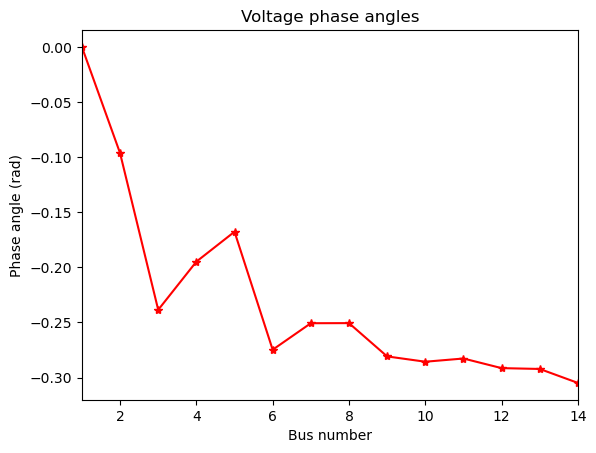

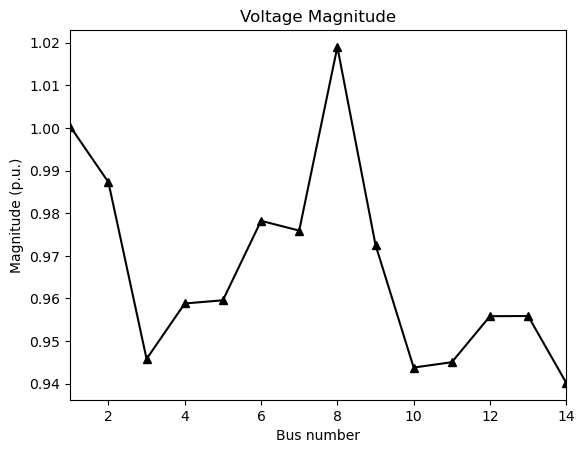

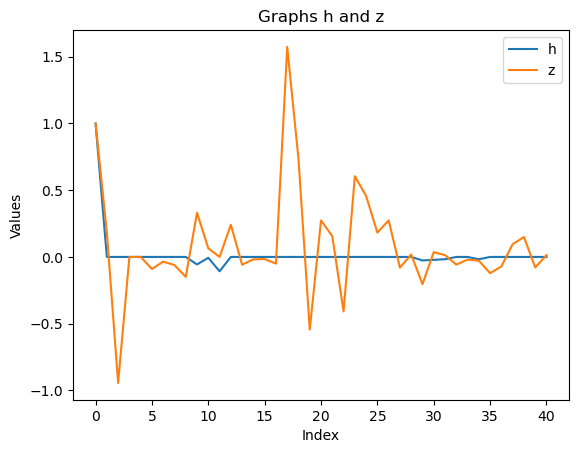

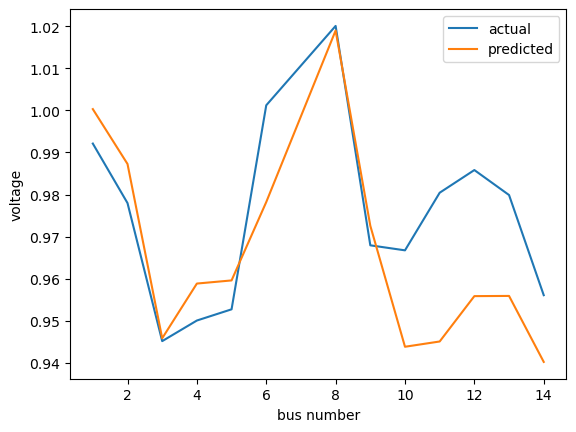

 repetition ------------->>>>>>>>>>>>>>>>> 1001
state 

 [1.00305431 0.98678052 0.94790457 0.95671878 0.95959684 0.98507832
 0.97661444 1.01400748 0.958721   0.95468333 0.96500639 0.96727768
 0.96031952 0.93958326]


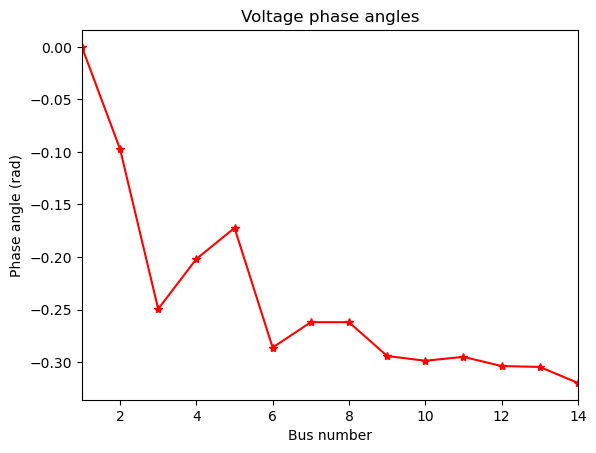

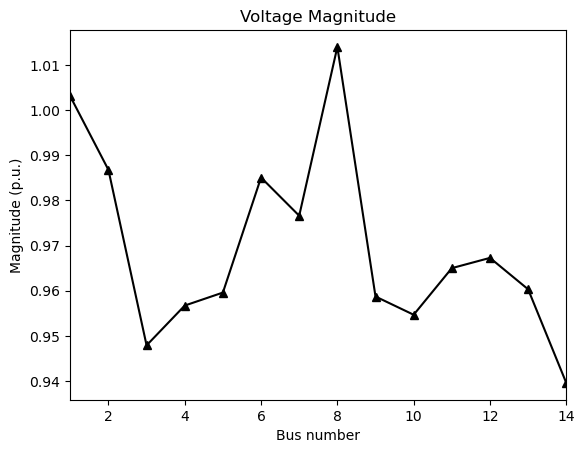

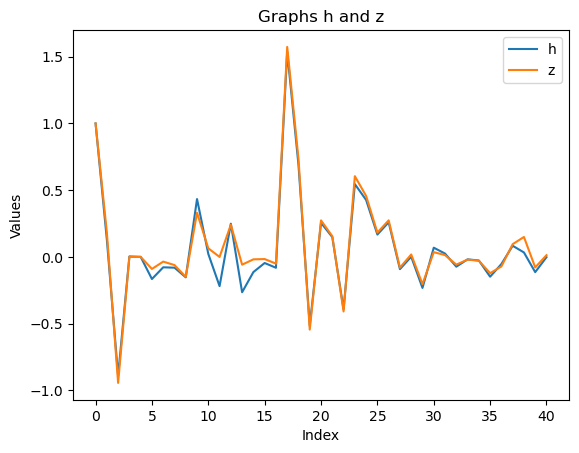

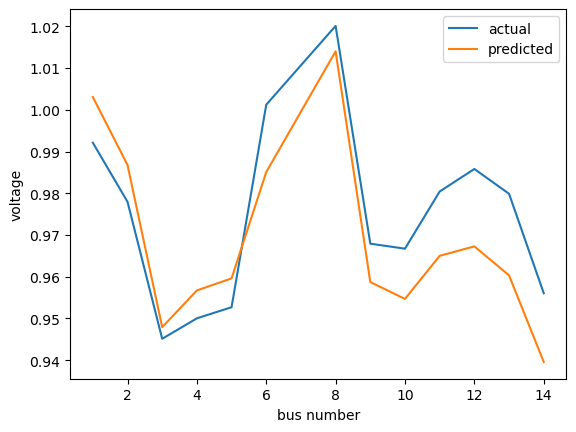

 repetition ------------->>>>>>>>>>>>>>>>> 1002
state 

 [1.00359284 0.98733134 0.94847527 0.95730643 0.96016987 0.98567756
 0.9772341  1.01456524 0.95935552 0.95506196 0.96529068 0.96782929
 0.96094527 0.9402343 ]


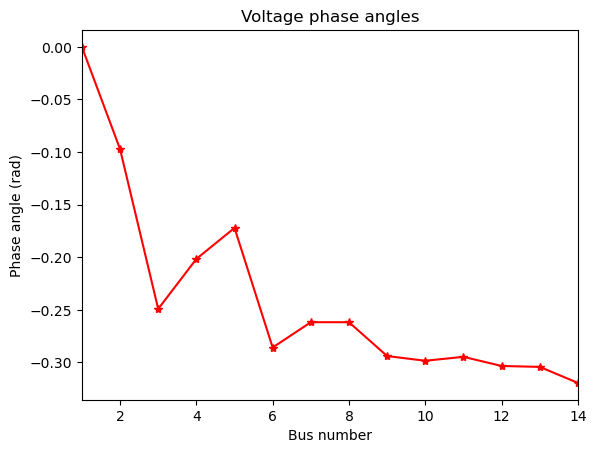

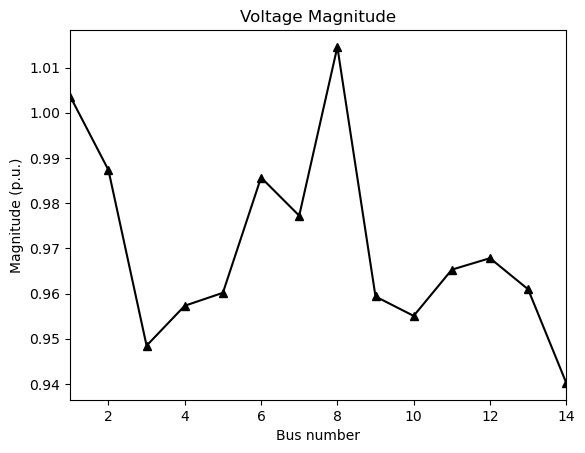

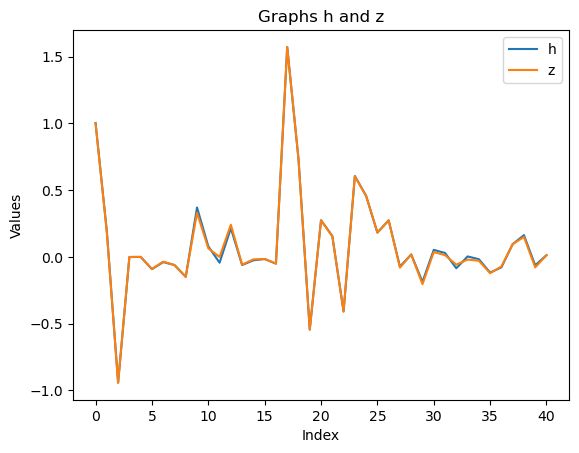

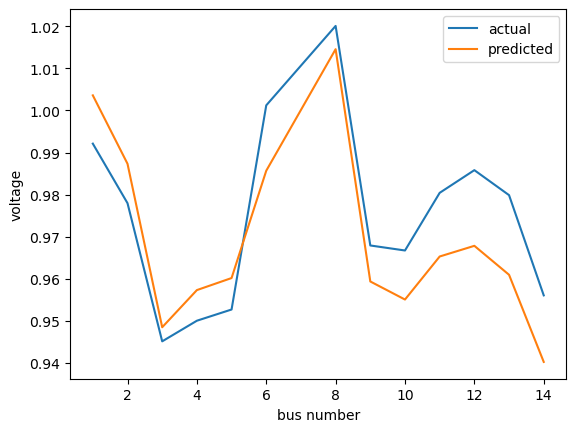

 repetition ------------->>>>>>>>>>>>>>>>> 1003
state 

 [1.00359042 0.98732839 0.94847162 0.95730314 0.96016622 0.98567428
 0.97723061 1.01456633 0.95935064 0.95505673 0.9652862  0.96782585
 0.96094243 0.94022979]


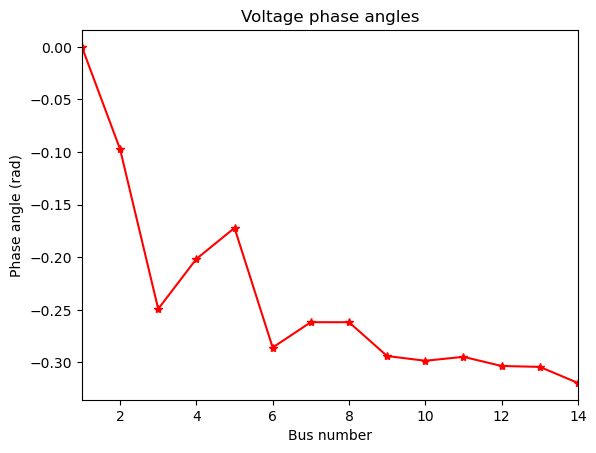

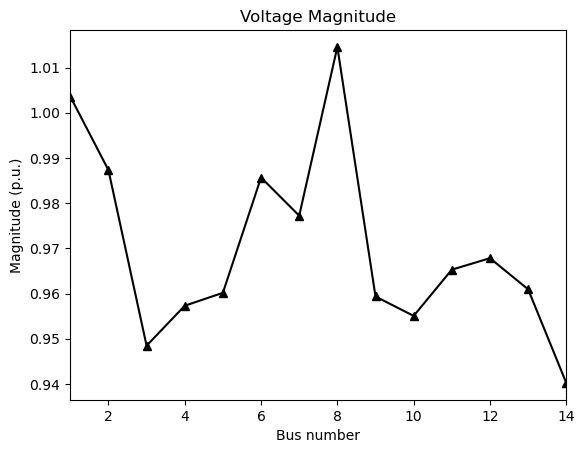

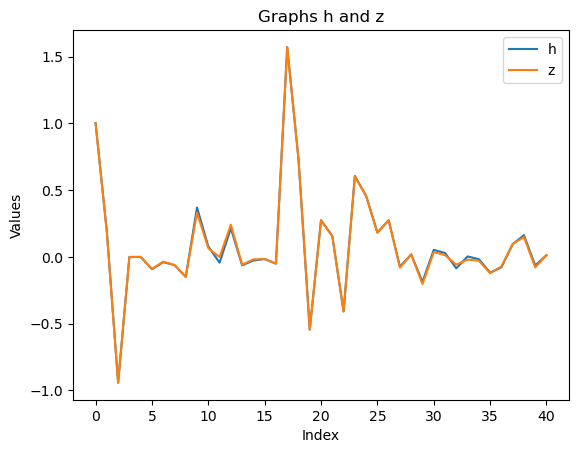

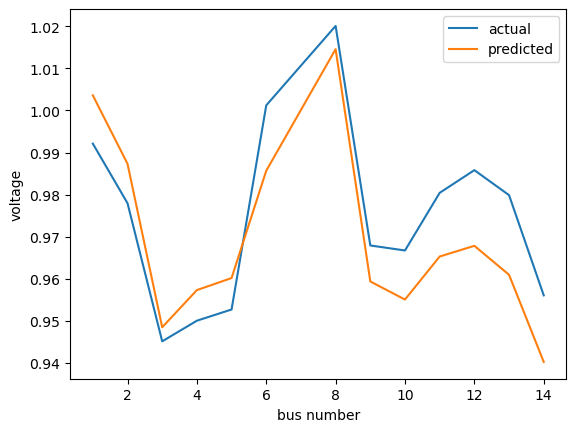

 repetition ------------->>>>>>>>>>>>>>>>> 1004
state 

 [1.0035904  0.98732805 0.94847094 0.95730264 0.96016573 0.9856738
 0.97722991 1.01457092 0.95934671 0.95505359 0.96528465 0.96782542
 0.96094201 0.94022738]


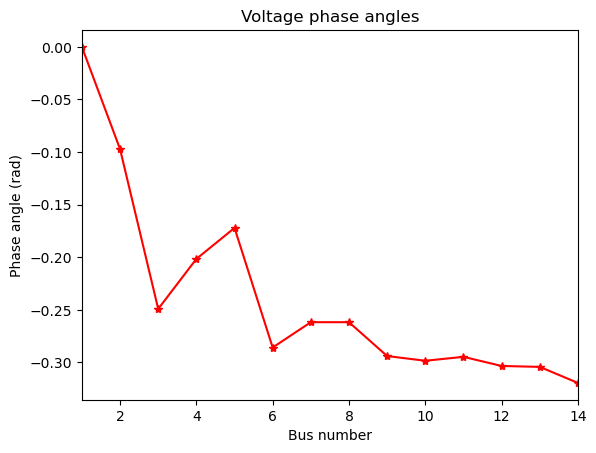

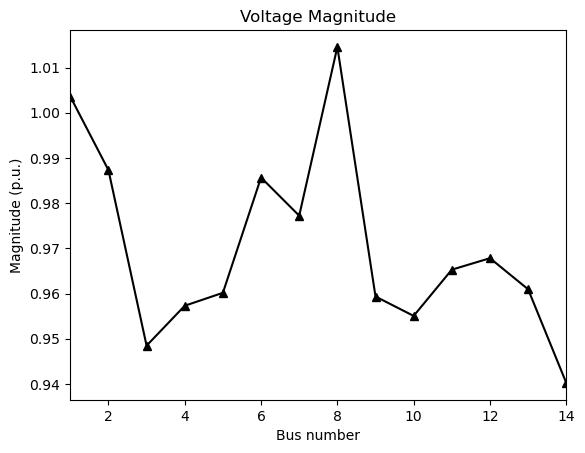

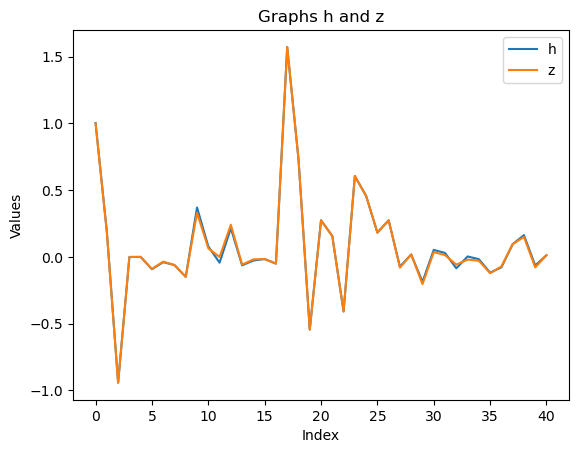

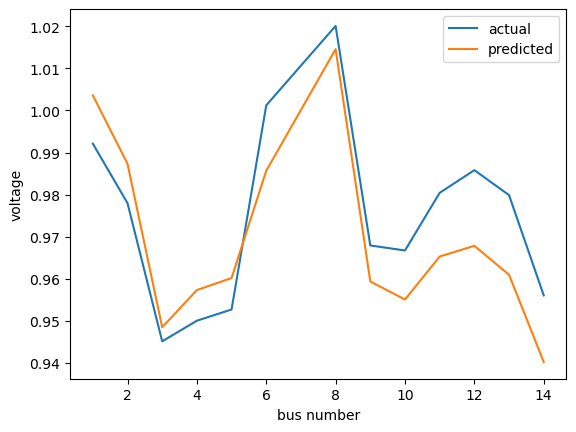

 repetition ------------->>>>>>>>>>>>>>>>> 1005
state 

 [1.0035903  0.98732762 0.94847017 0.95730206 0.96016516 0.98567321
 0.97722905 1.01457541 0.95934252 0.95505024 0.96528294 0.96782487
 0.96094148 0.94022477]


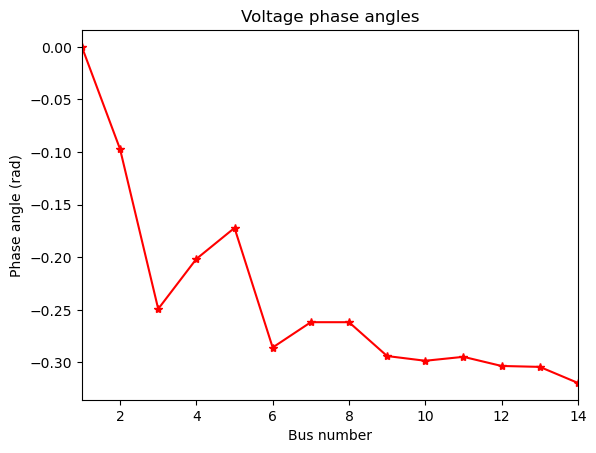

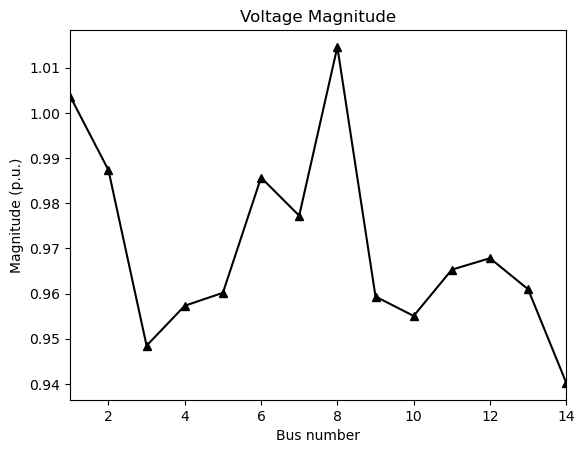

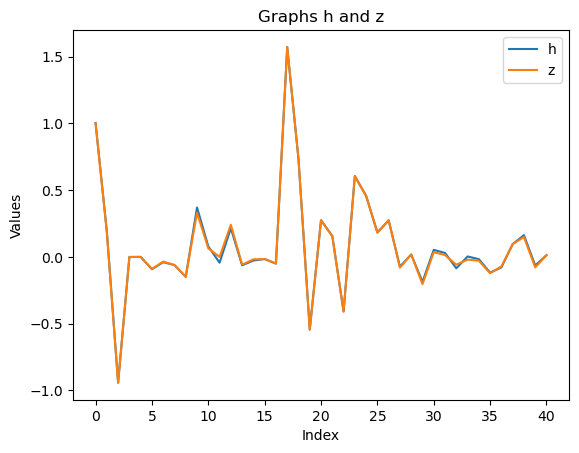

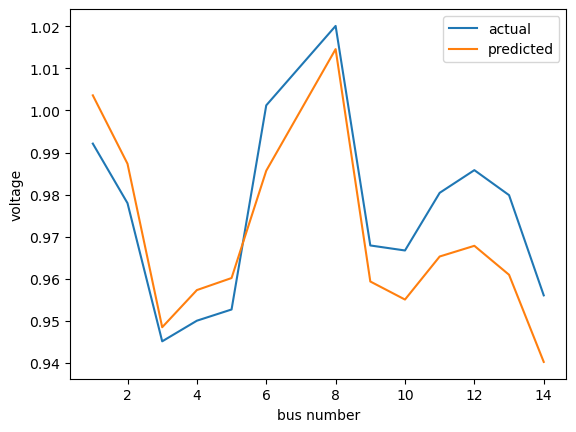

 repetition ------------->>>>>>>>>>>>>>>>> 1006
state 

 [1.0035902  0.9873272  0.94846941 0.95730147 0.96016459 0.9856726
 0.9772281  1.0145799  0.95933817 0.95504675 0.96528118 0.9678243
 0.96094093 0.94022205]


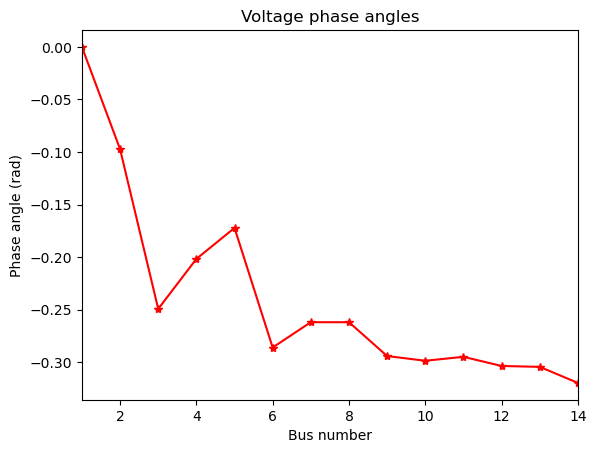

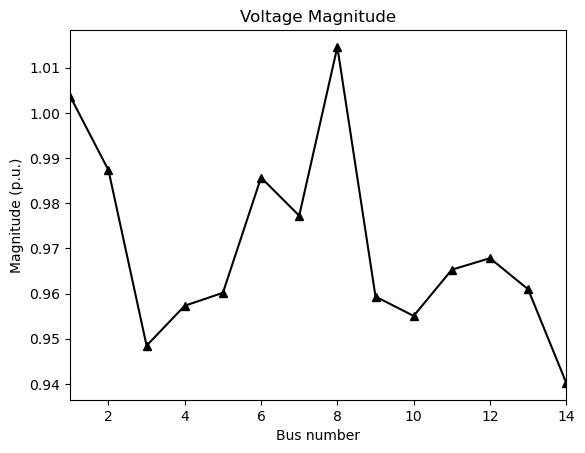

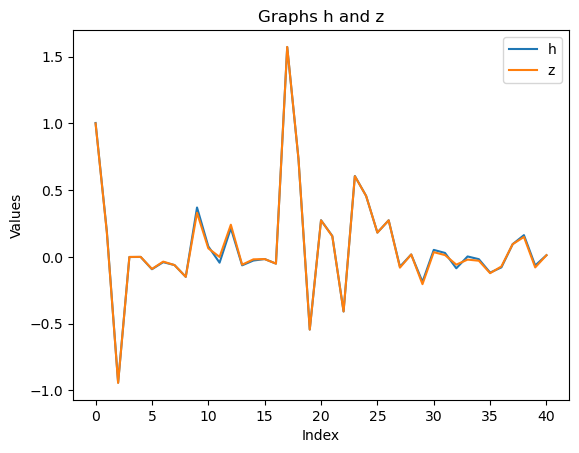

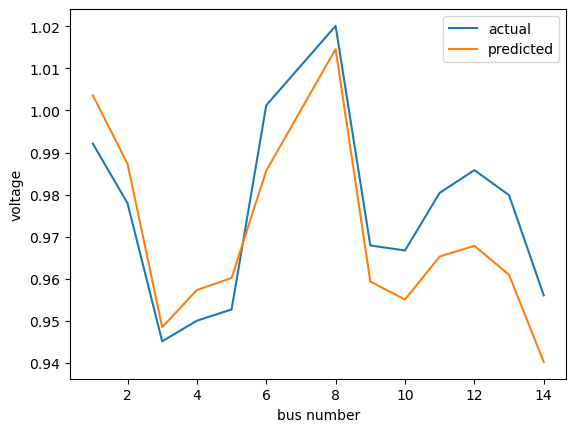

 repetition ------------->>>>>>>>>>>>>>>>> 1007
state 

 [1.0035901  0.98732677 0.94846865 0.95730089 0.96016401 0.98567196
 0.97722708 1.01458438 0.95933365 0.95504313 0.96527935 0.96782371
 0.96094035 0.94021923]


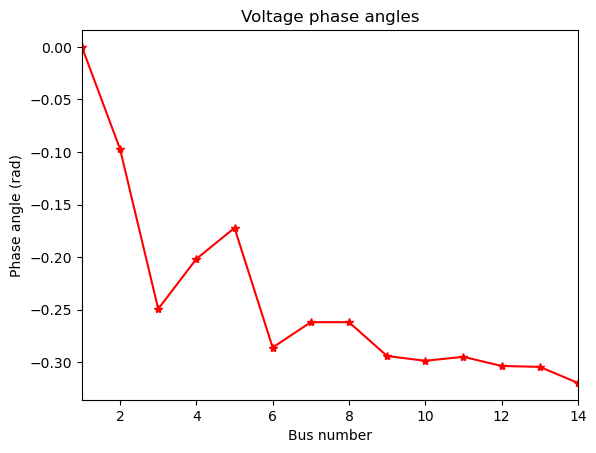

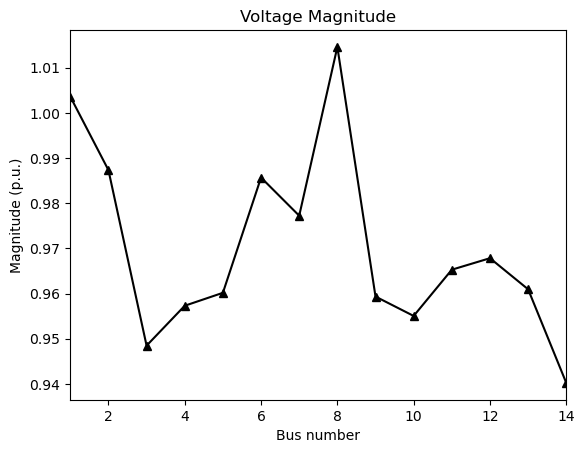

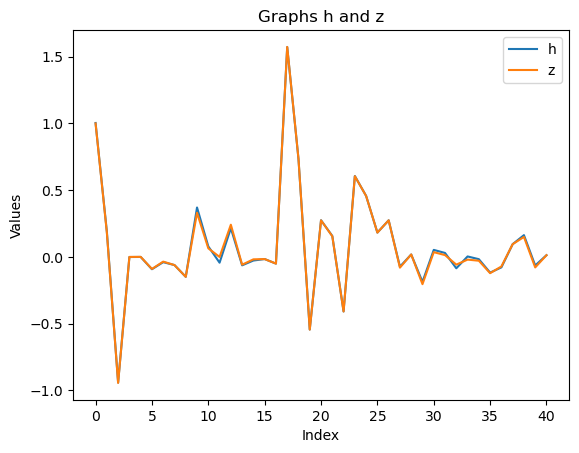

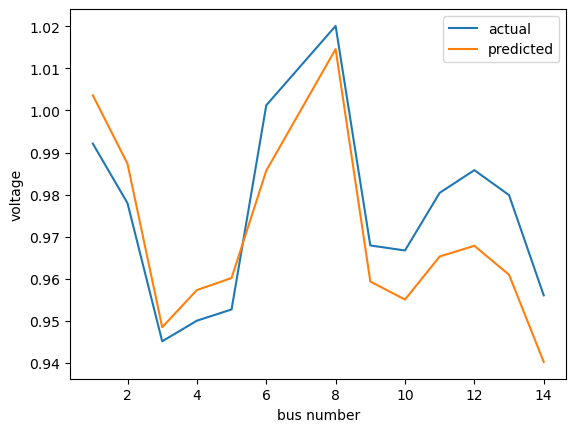

 repetition ------------->>>>>>>>>>>>>>>>> 1008
state 

 [1.00358999 0.98732634 0.9484679  0.9573003  0.96016344 0.98567131
 0.97722599 1.01458885 0.95932896 0.95503939 0.96527746 0.9678231
 0.96093975 0.9402163 ]


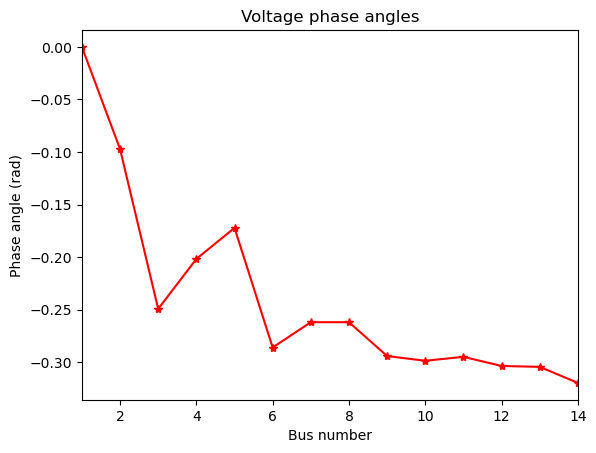

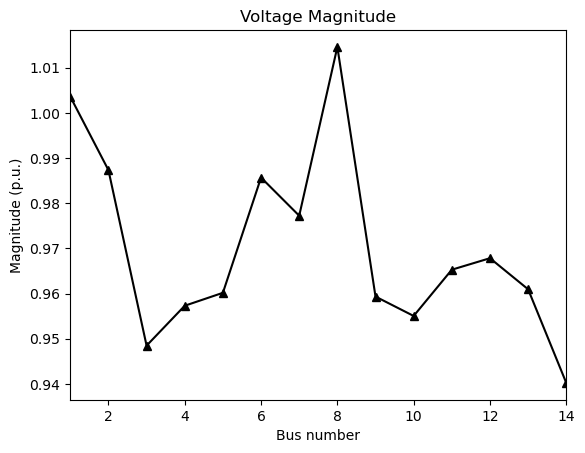

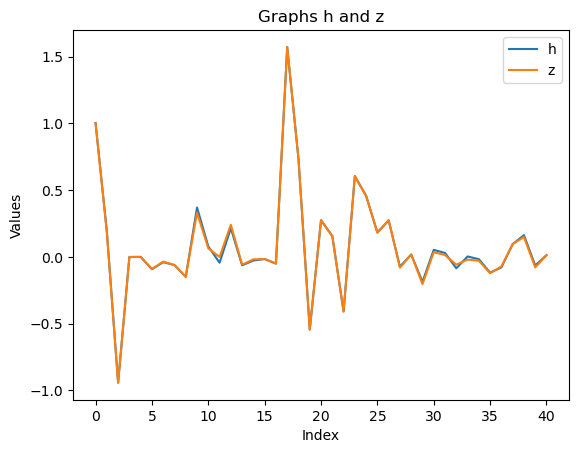

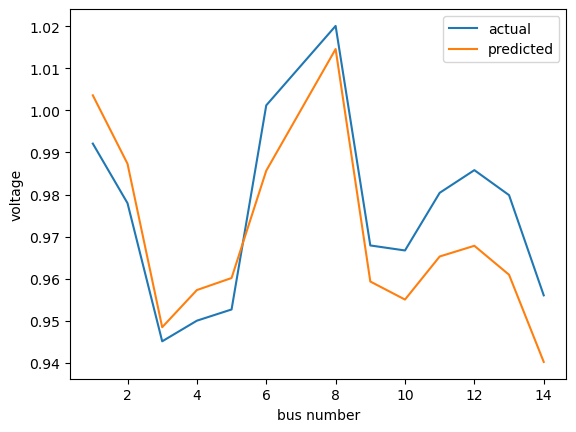

 repetition ------------->>>>>>>>>>>>>>>>> 1009
state 

 [1.00358988 0.98732592 0.94846715 0.95729972 0.96016287 0.98567063
 0.97722481 1.0145933  0.95932411 0.95503551 0.9652755  0.96782247
 0.96093912 0.94021327]


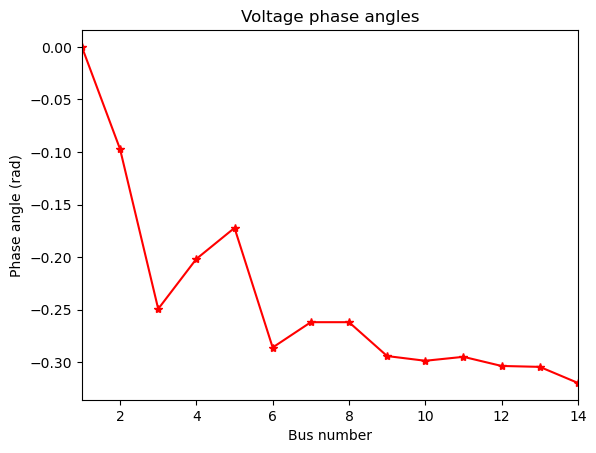

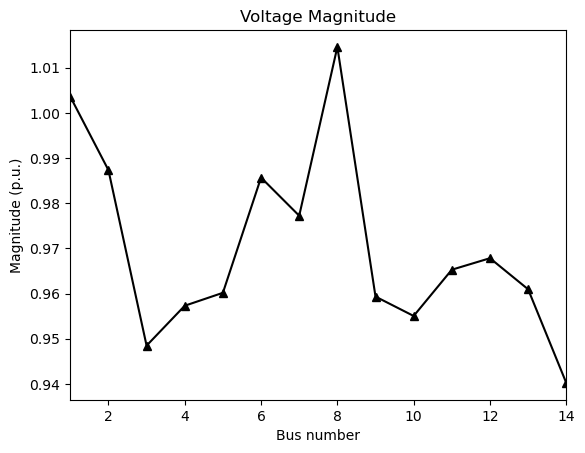

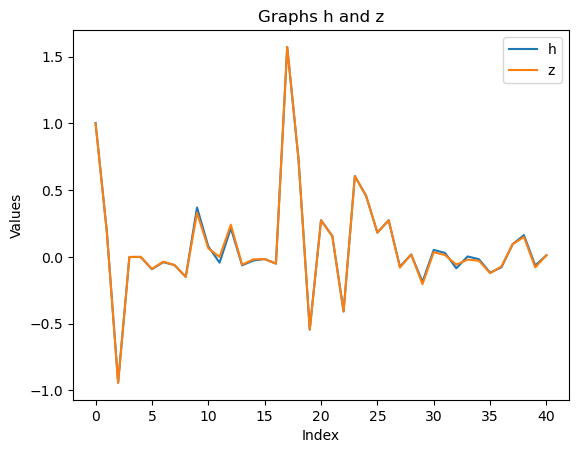

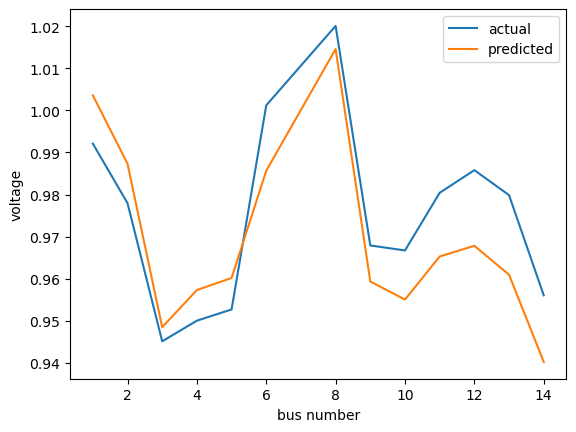

 repetition ------------->>>>>>>>>>>>>>>>> 1010
state 

 [1.00358977 0.98732549 0.9484664  0.95729914 0.96016229 0.98566993
 0.97722356 1.01459775 0.9593191  0.95503151 0.96527349 0.96782181
 0.96093847 0.94021013]


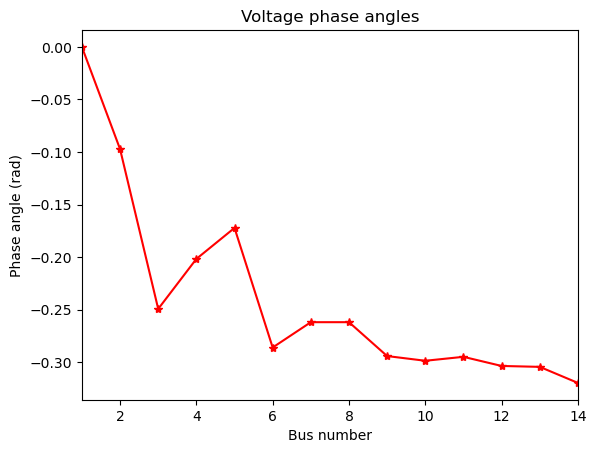

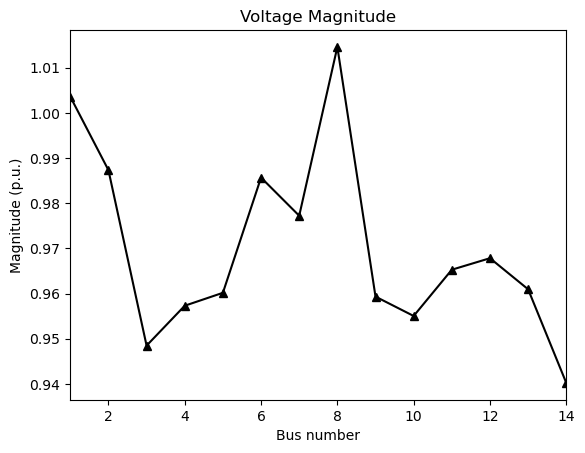

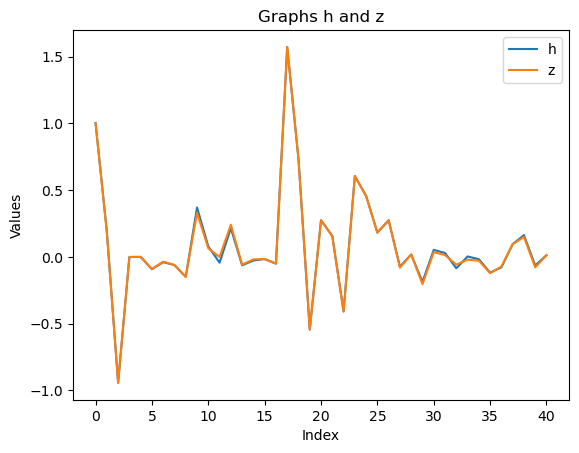

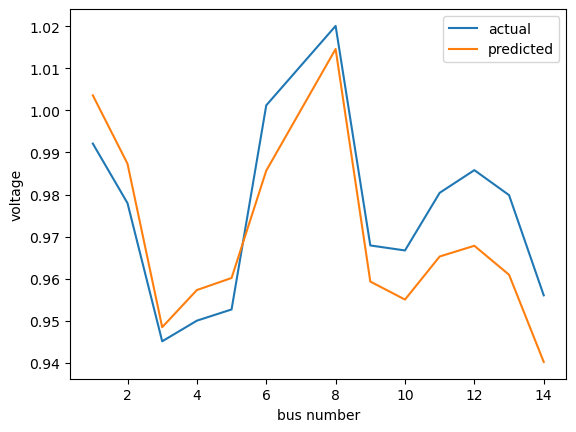

 repetition ------------->>>>>>>>>>>>>>>>> 1011
state 

 [1.00358966 0.98732507 0.94846566 0.95729856 0.96016172 0.98566921
 0.97722223 1.01460217 0.95931393 0.95502738 0.96527141 0.96782113
 0.96093779 0.94020689]


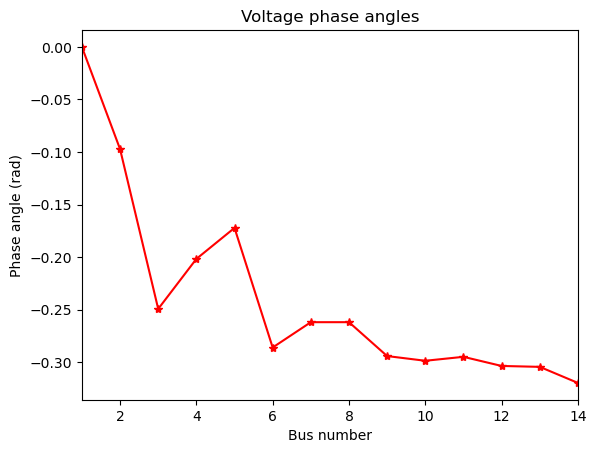

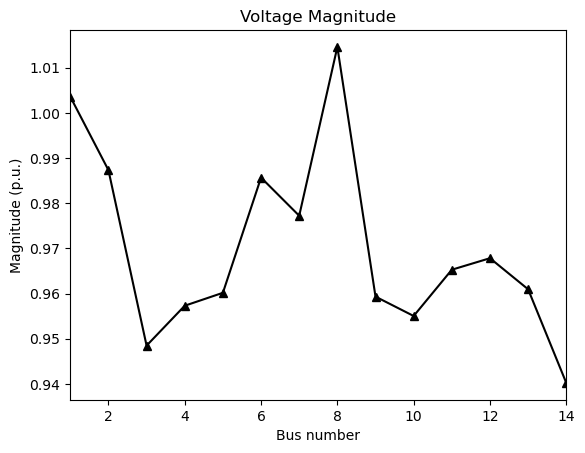

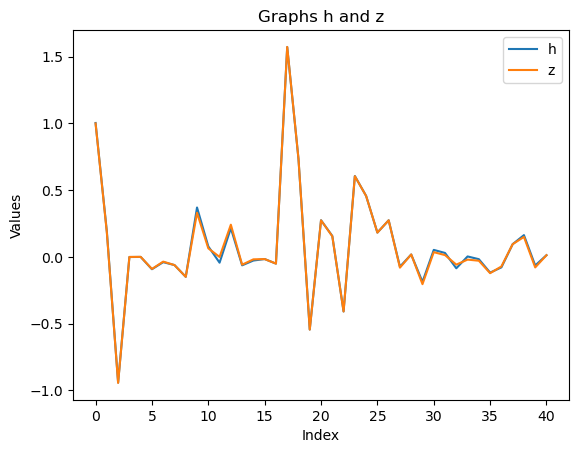

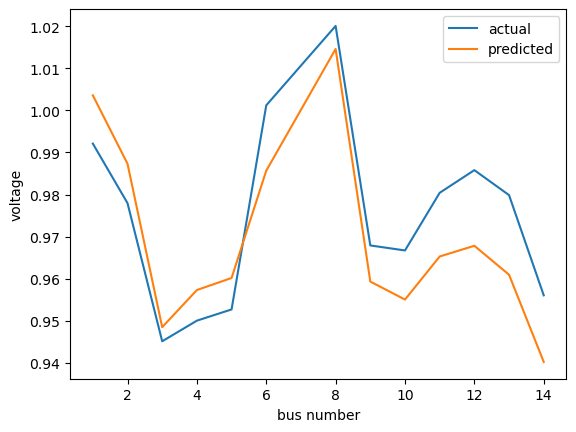

 repetition ------------->>>>>>>>>>>>>>>>> 1012
state 

 [1.00358954 0.98732465 0.94846492 0.95729798 0.96016115 0.98566847
 0.97722082 1.01460658 0.9593086  0.95502313 0.96526927 0.96782044
 0.96093709 0.94020355]


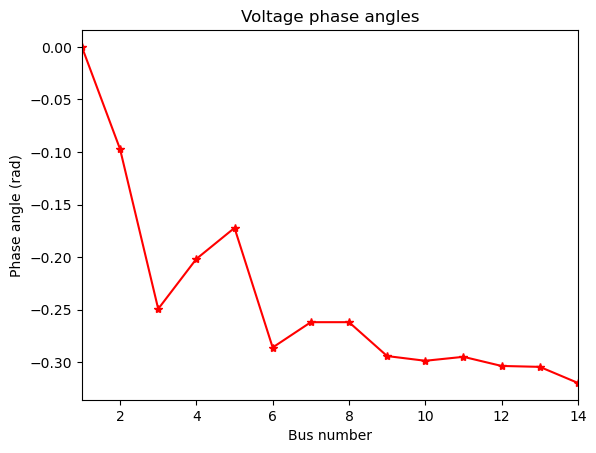

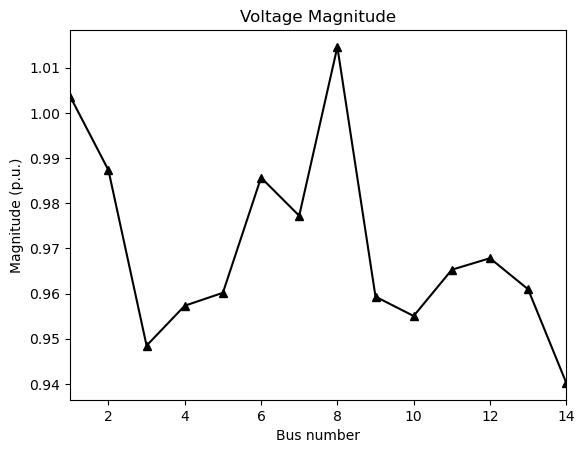

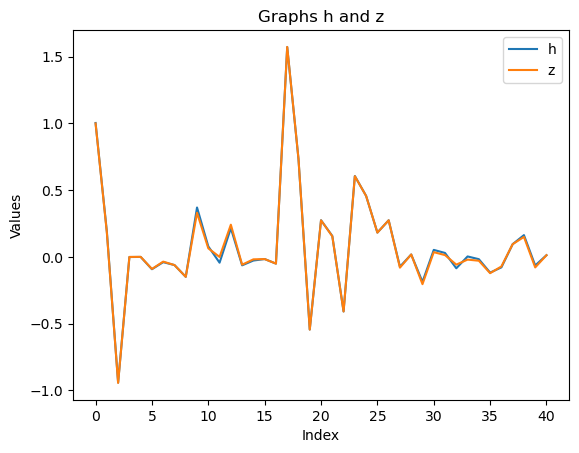

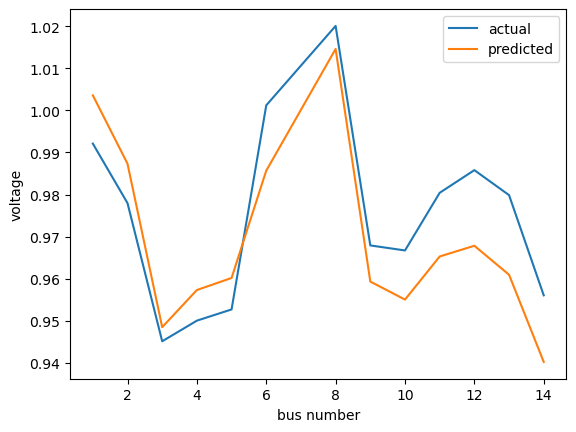

 repetition ------------->>>>>>>>>>>>>>>>> 1013
state 

 [1.00358942 0.98732423 0.94846419 0.95729741 0.96016058 0.9856677
 0.97721934 1.01461097 0.95930311 0.95501876 0.96526707 0.96781972
 0.96093637 0.94020011]


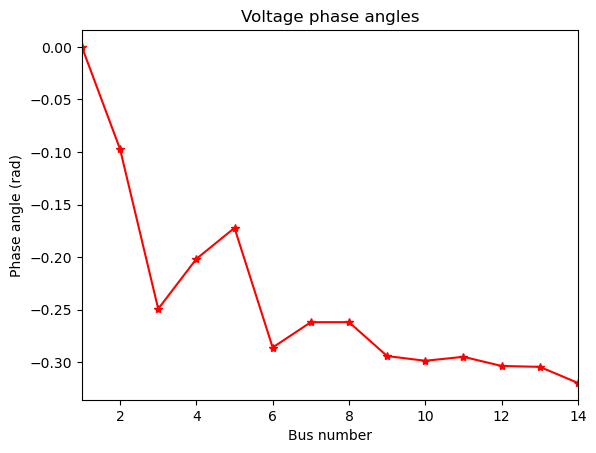

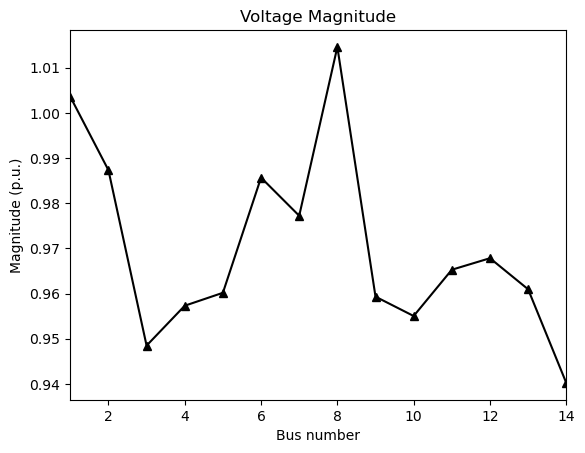

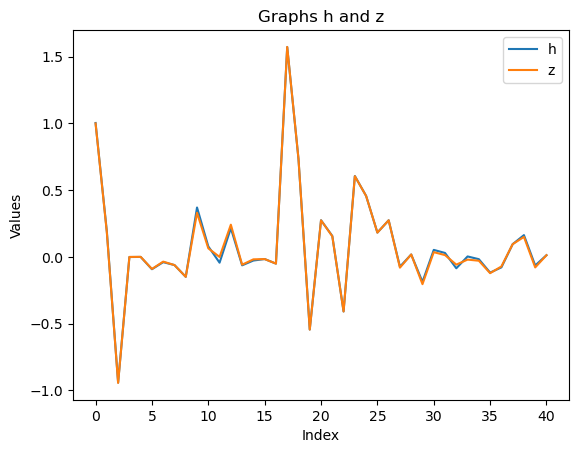

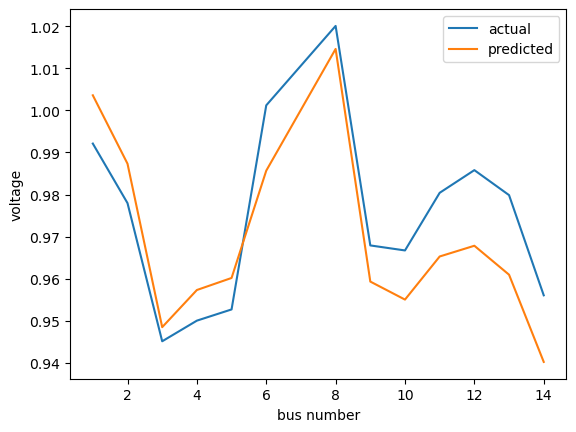

 repetition ------------->>>>>>>>>>>>>>>>> 1014
state 

 [1.0035893  0.98732381 0.94846347 0.95729684 0.96016001 0.98566692
 0.97721778 1.01461534 0.95929747 0.95501427 0.96526482 0.96781898
 0.96093563 0.94019657]


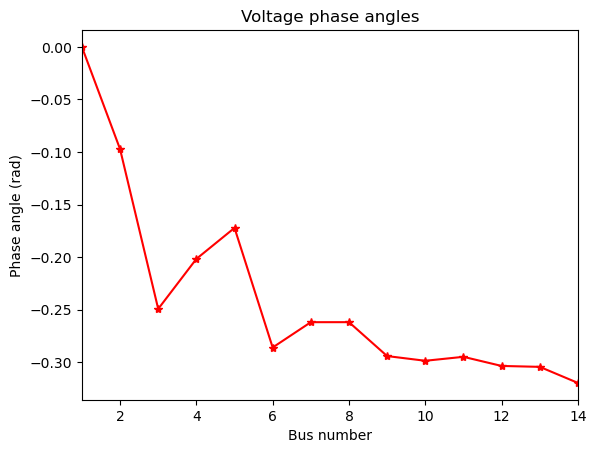

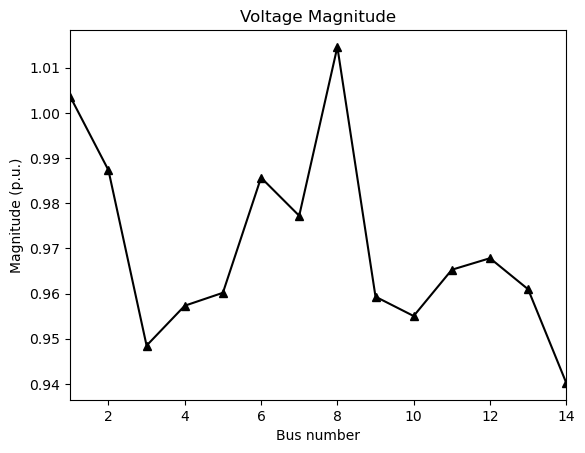

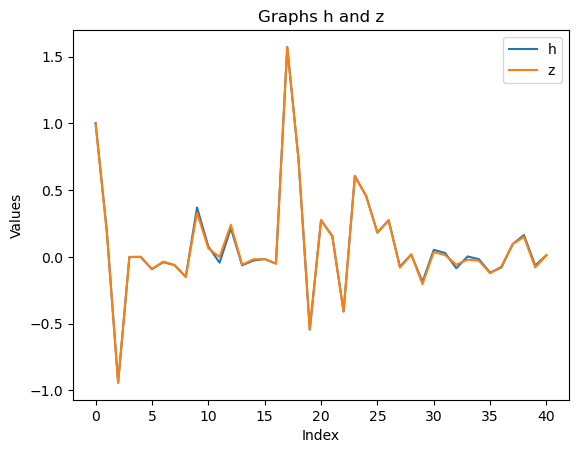

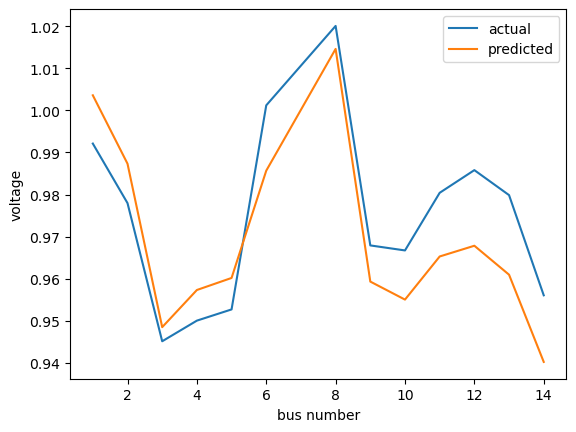

 repetition ------------->>>>>>>>>>>>>>>>> 1015
state 

 [1.00358918 0.98732339 0.94846275 0.95729627 0.96015944 0.98566612
 0.97721615 1.01461968 0.95929168 0.95500966 0.9652625  0.96781822
 0.96093486 0.94019294]


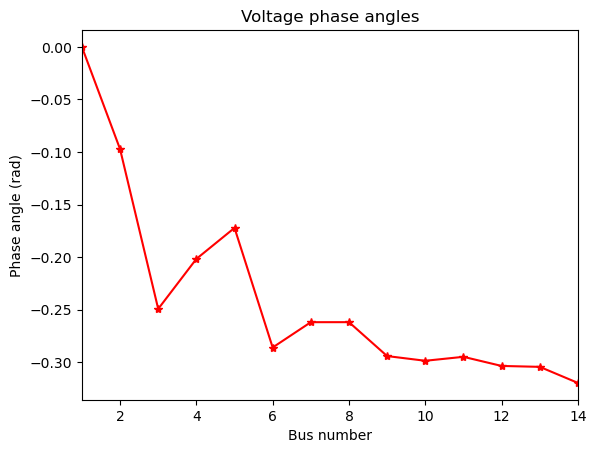

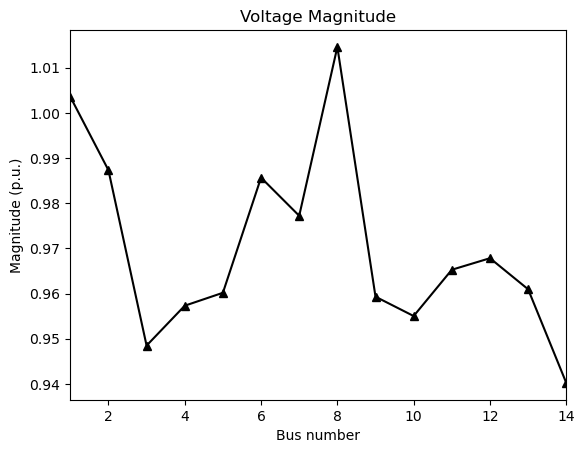

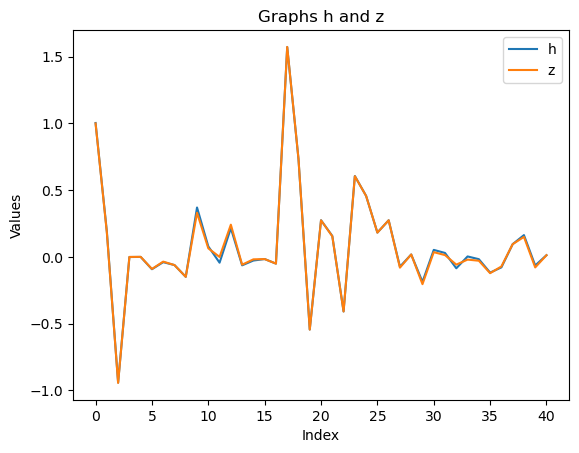

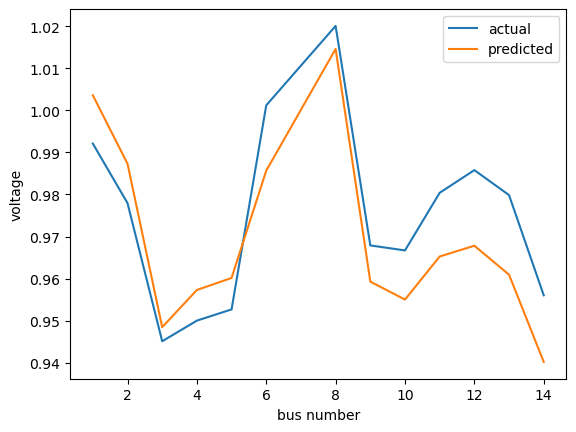

 repetition ------------->>>>>>>>>>>>>>>>> 1016
state 

 [1.00358906 0.98732297 0.94846203 0.9572957  0.96015887 0.9856653
 0.97721445 1.01462401 0.95928574 0.95500493 0.96526013 0.96781744
 0.96093407 0.9401892 ]


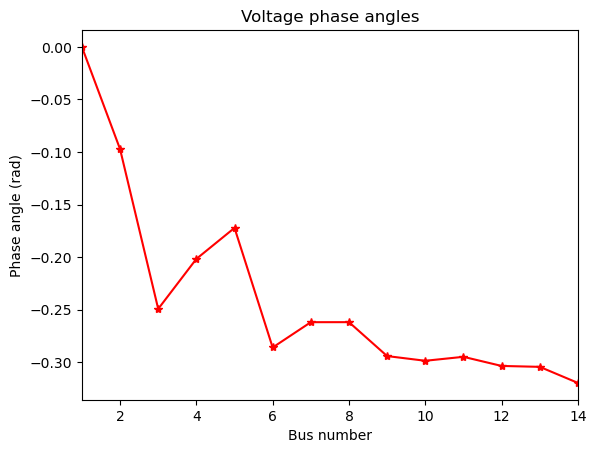

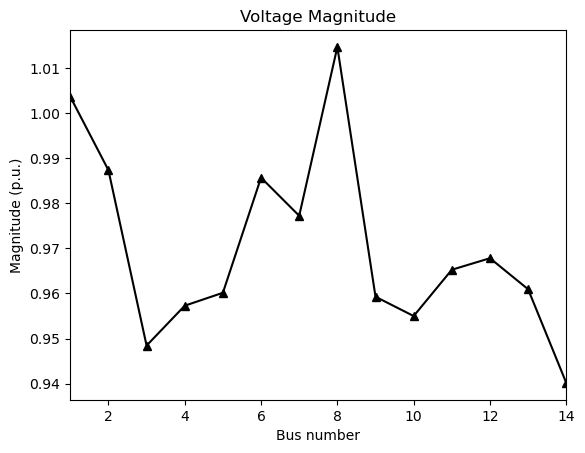

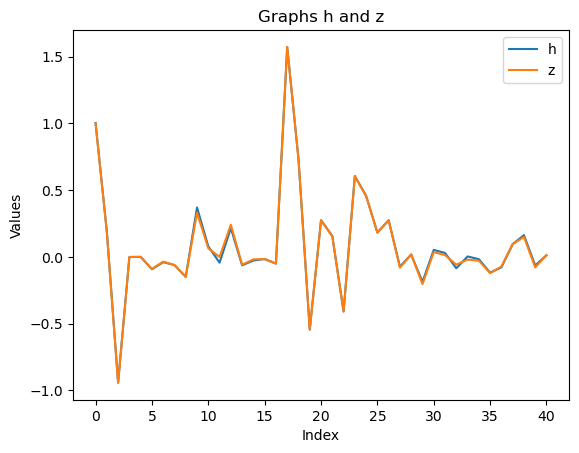

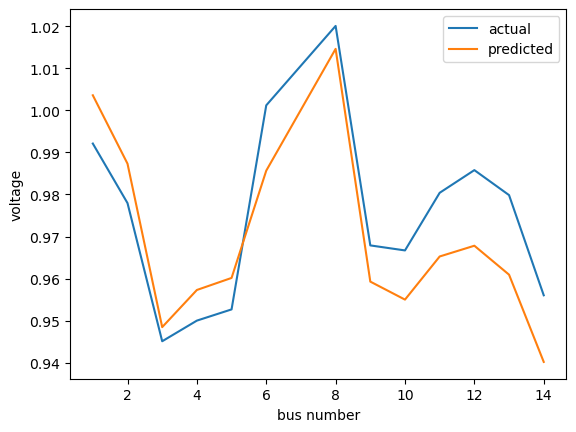

 repetition ------------->>>>>>>>>>>>>>>>> 1017
state 

 [1.00358893 0.98732256 0.94846132 0.95729513 0.96015831 0.98566445
 0.97721267 1.01462831 0.95927965 0.95500008 0.96525771 0.96781664
 0.96093326 0.94018538]


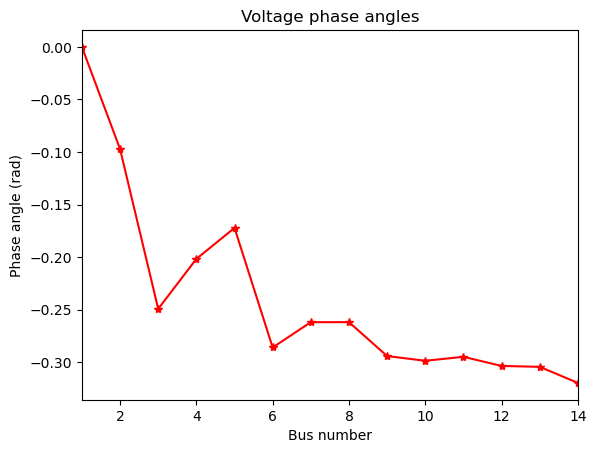

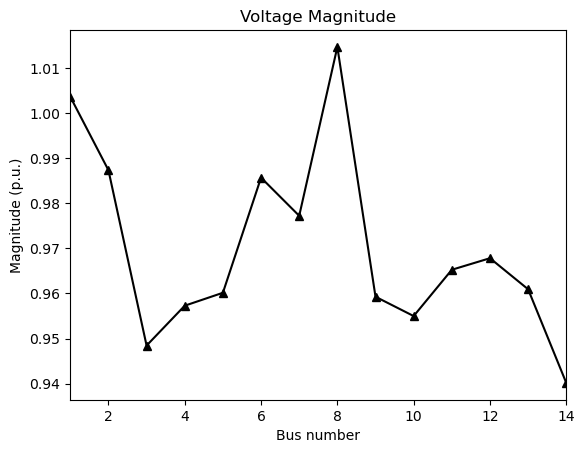

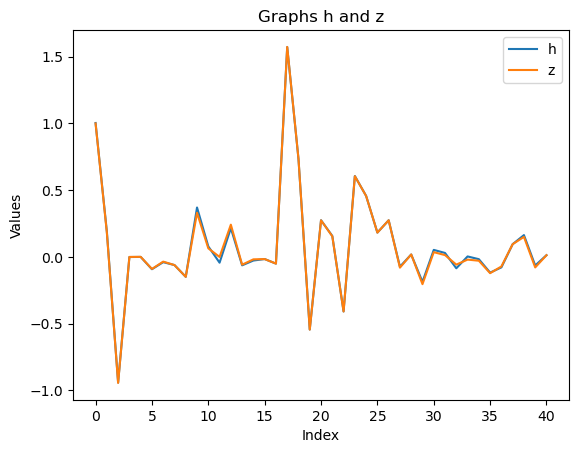

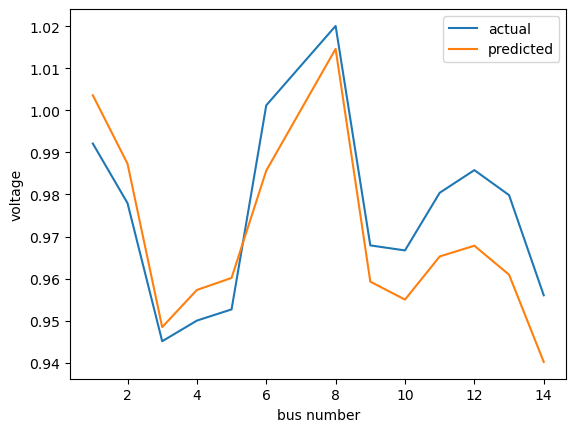

 repetition ------------->>>>>>>>>>>>>>>>> 1018
state 

 [1.0035888  0.98732214 0.94846062 0.95729457 0.96015775 0.98566359
 0.97721082 1.01463258 0.95927341 0.95499512 0.96525522 0.96781582
 0.96093242 0.94018146]


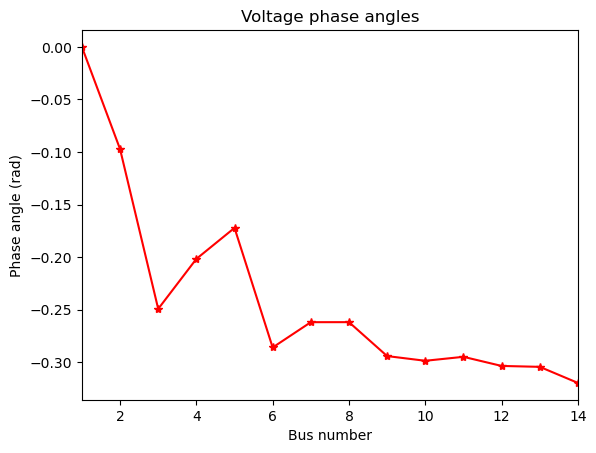

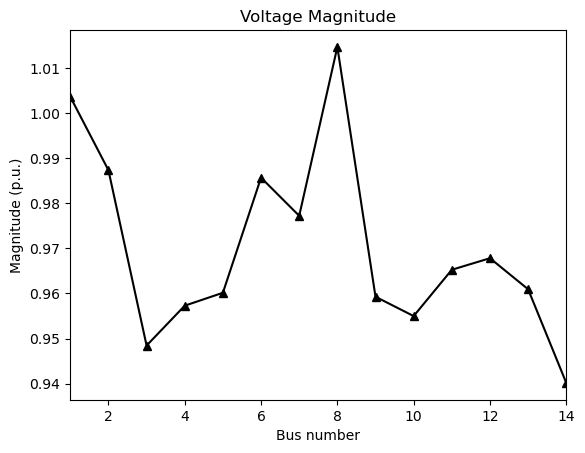

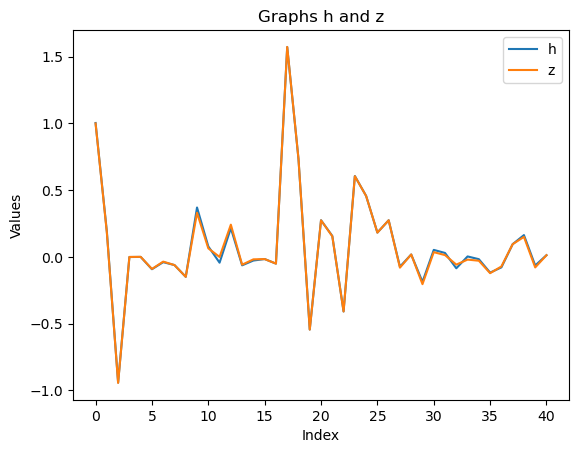

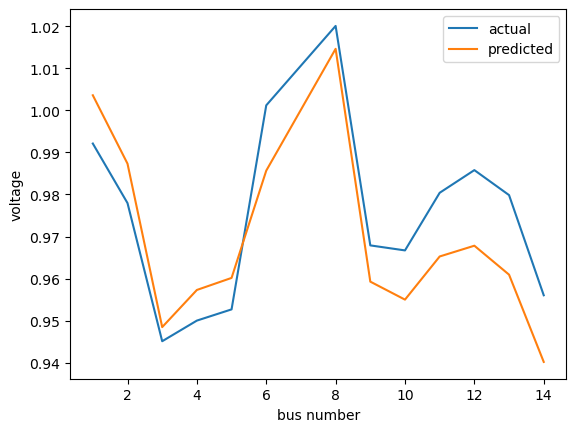

 repetition ------------->>>>>>>>>>>>>>>>> 1019
state 

 [1.00358867 0.98732173 0.94845993 0.95729402 0.96015719 0.98566271
 0.9772089  1.01463682 0.95926703 0.95499005 0.96525269 0.96781498
 0.96093157 0.94017744]


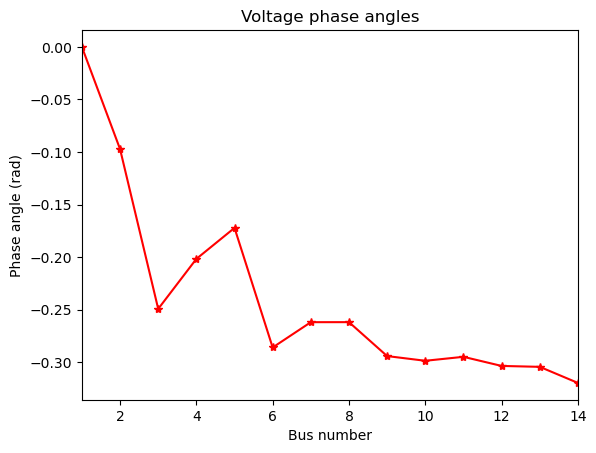

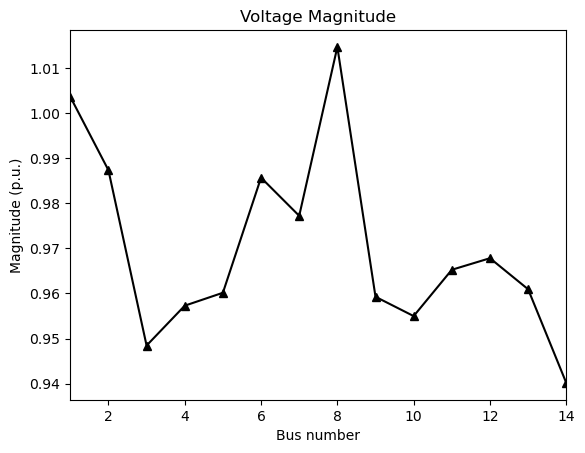

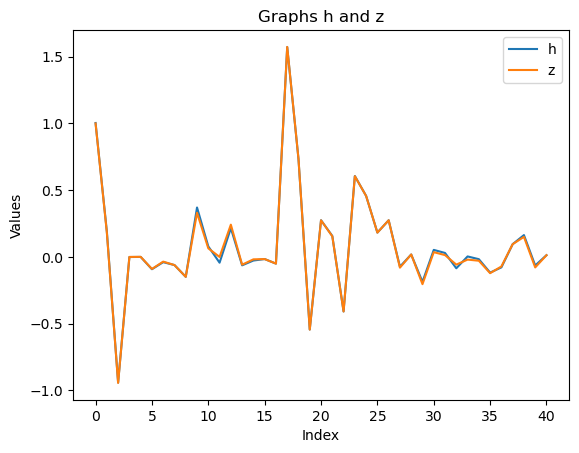

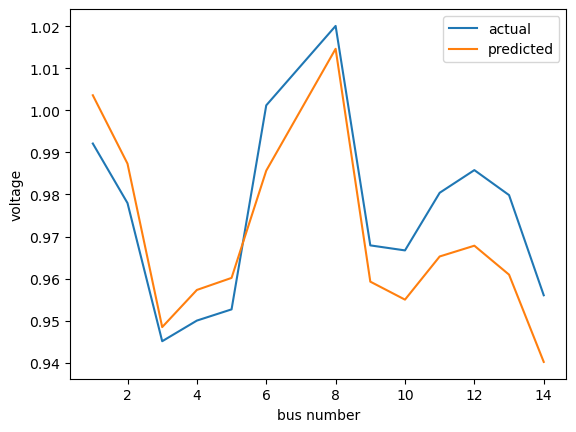

 repetition ------------->>>>>>>>>>>>>>>>> 1020
state 

 [1.00358854 0.98732133 0.94845924 0.95729346 0.96015663 0.98566181
 0.9772069  1.01464103 0.95926051 0.95498487 0.9652501  0.96781413
 0.96093069 0.94017334]


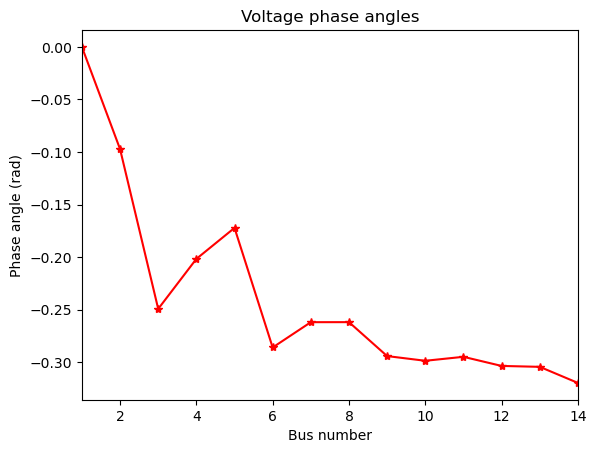

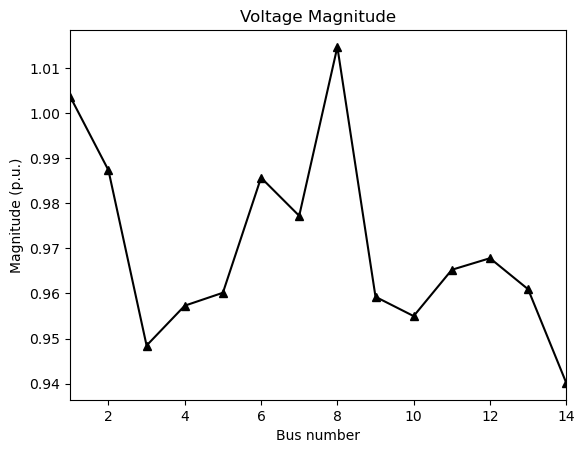

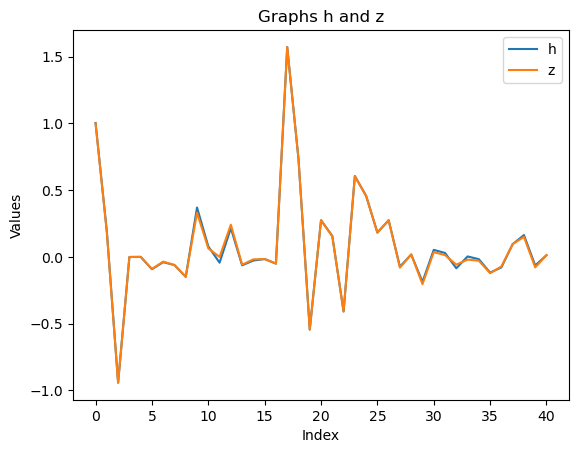

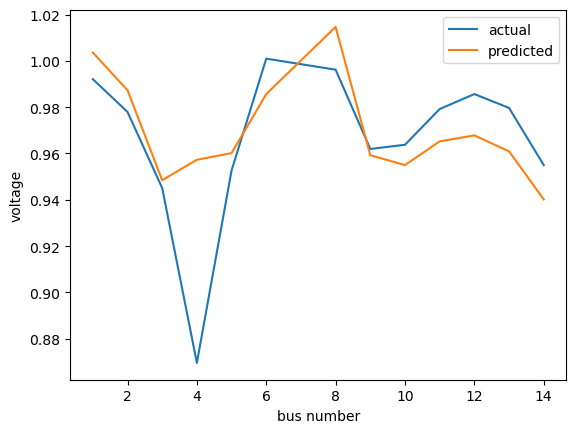

 repetition ------------->>>>>>>>>>>>>>>>> 1021
state 

 [1.00378236 0.98754603 0.94871344 0.95765194 0.96046101 0.98587423
 0.97651996 1.01292767 0.95874149 0.95461957 0.96521655 0.96800756
 0.96121184 0.93997672]


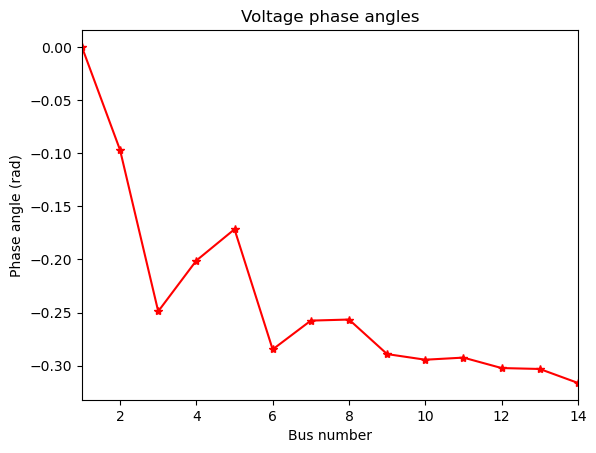

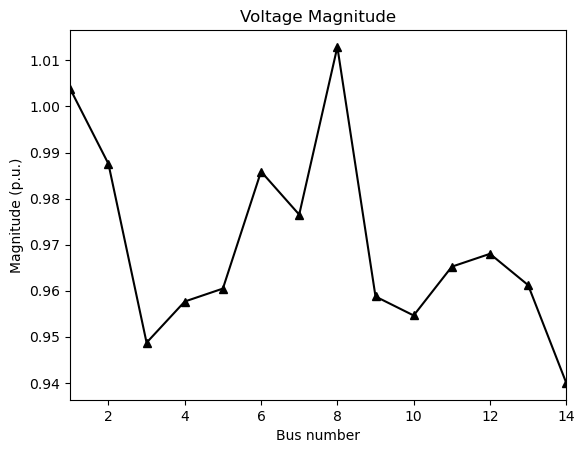

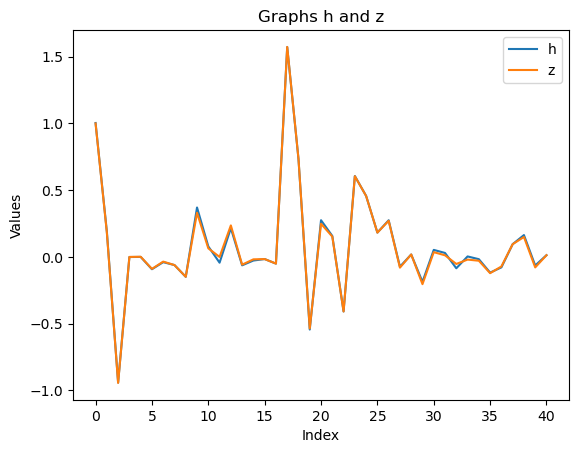

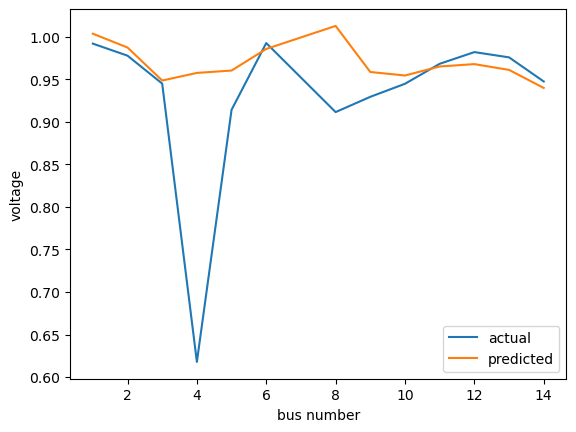

 repetition ------------->>>>>>>>>>>>>>>>> 1022
state 

 [1.00546424 0.98953465 0.95092937 0.96069765 0.96362207 0.98854946
 0.97618176 1.0088356  0.9595408  0.95553474 0.96693522 0.97067078
 0.96461226 0.94172454]


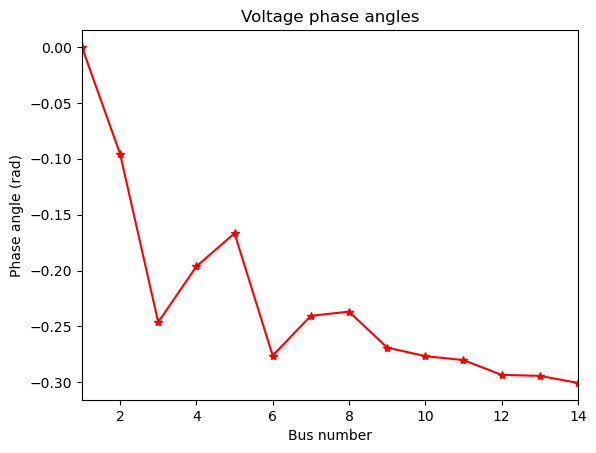

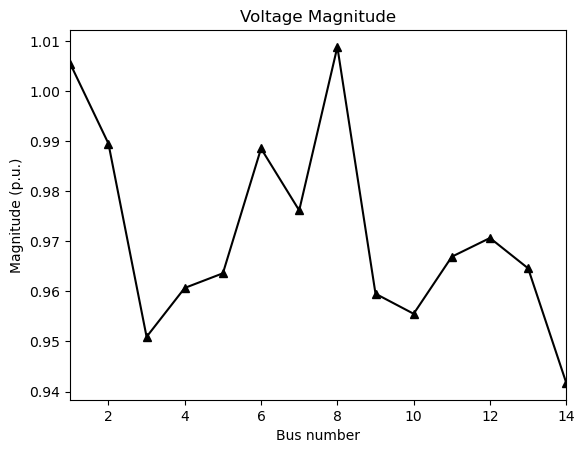

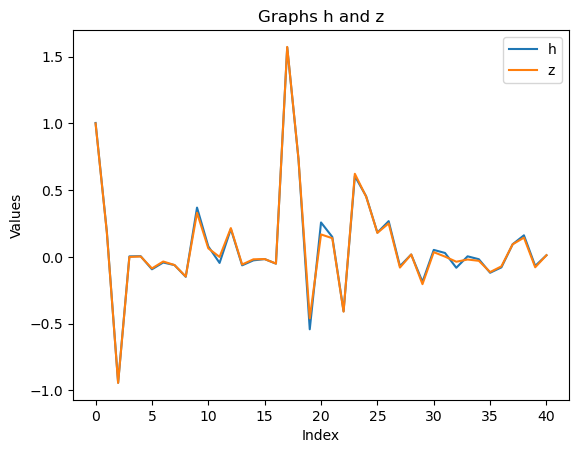

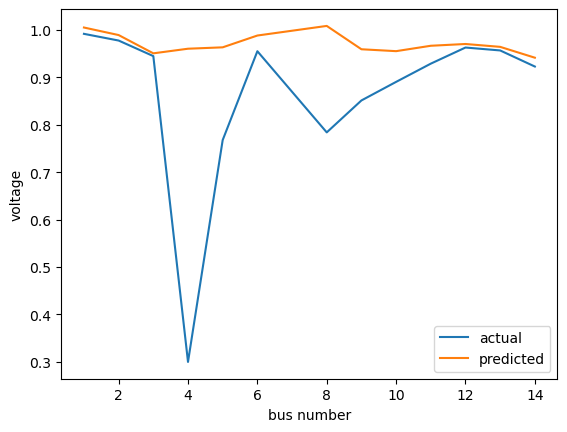

 repetition ------------->>>>>>>>>>>>>>>>> 1023
state 

 [1.00977065 0.99468215 0.95666066 0.9686402  0.97221266 0.99584504
 0.97995739 1.00681044 0.96619653 0.96143666 0.97296926 0.97827924
 0.97423218 0.94939771]


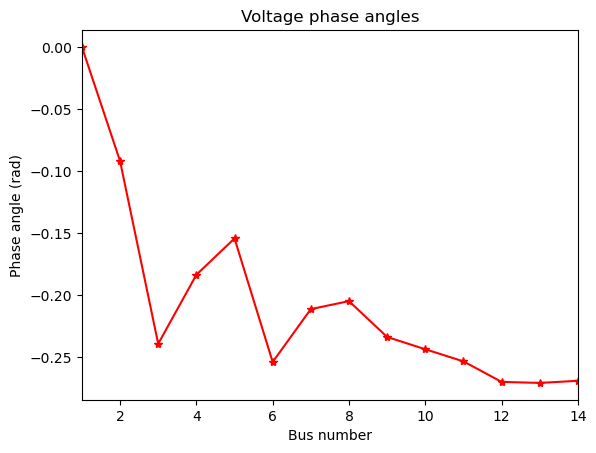

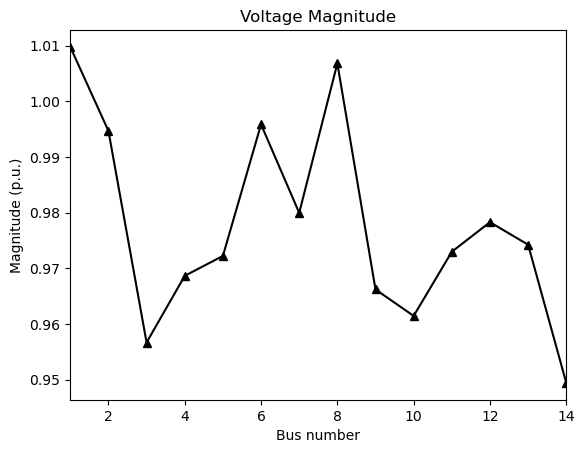

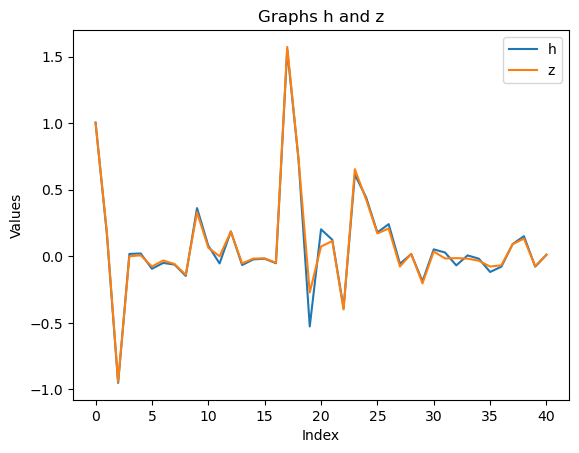

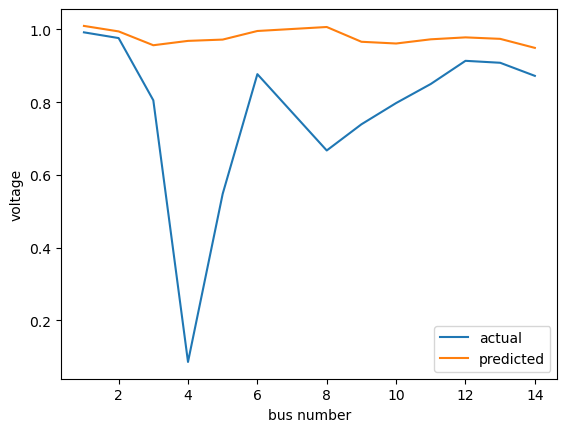

 repetition ------------->>>>>>>>>>>>>>>>> 1024
state 

 [1.01374749 0.9995912  0.96788717 0.97473294 0.97823403 1.00055655
 0.9834826  1.00505469 0.97434093 0.96690584 0.97660032 0.98368838
 0.9832343  0.95748718]


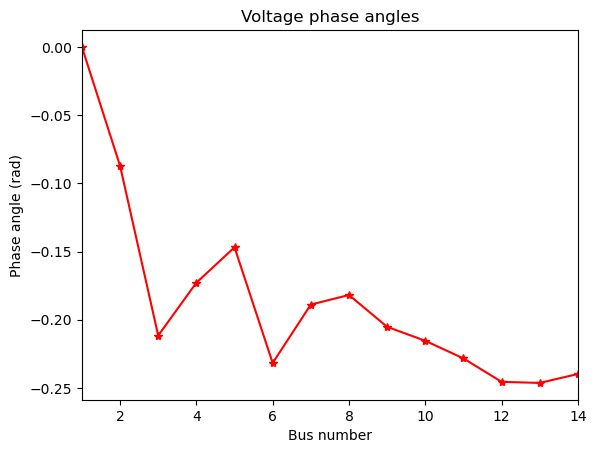

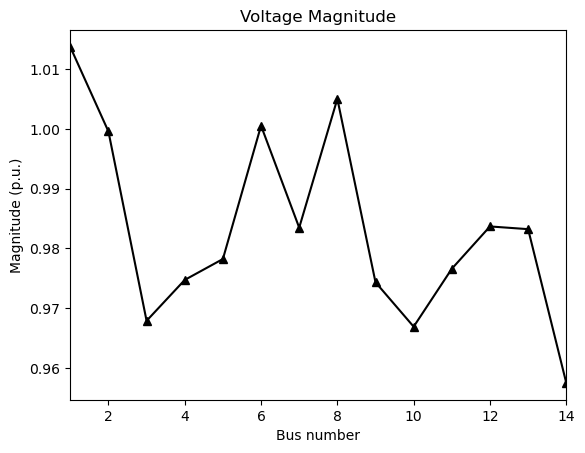

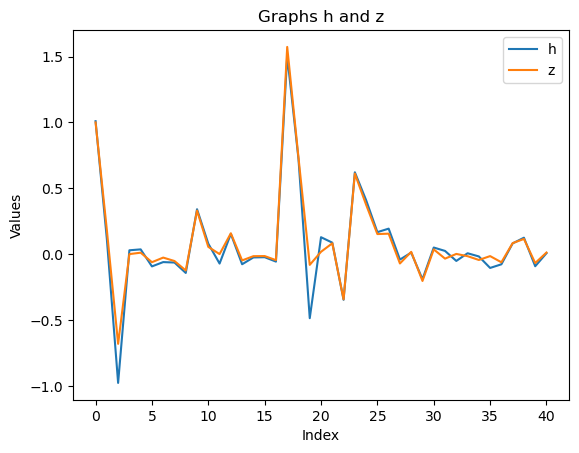

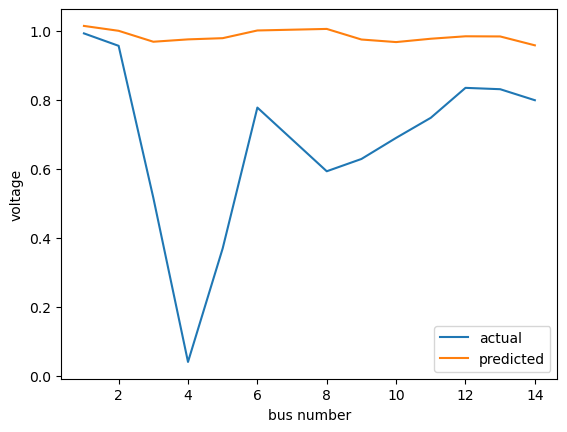

 repetition ------------->>>>>>>>>>>>>>>>> 1025
state 

 [1.01642478 1.00285645 0.98003667 0.97727757 0.98011643 1.00106454
 0.9853604  1.00351844 0.98033077 0.97027239 0.97730713 0.98549996
 0.98832419 0.96355489]


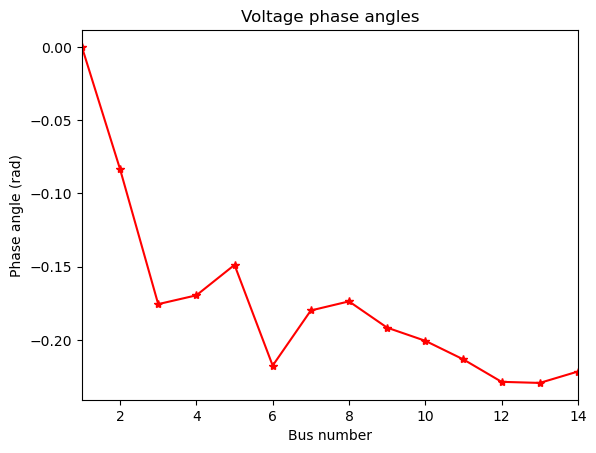

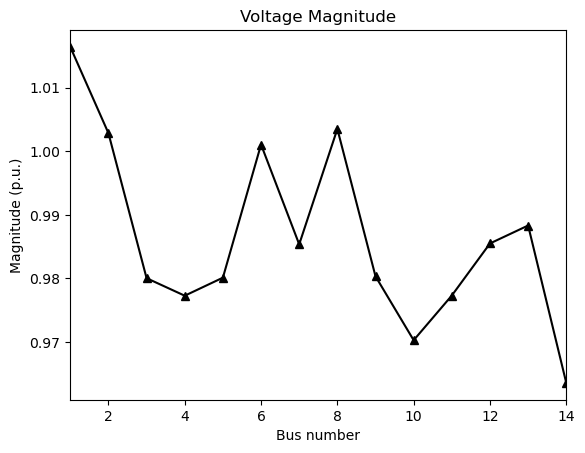

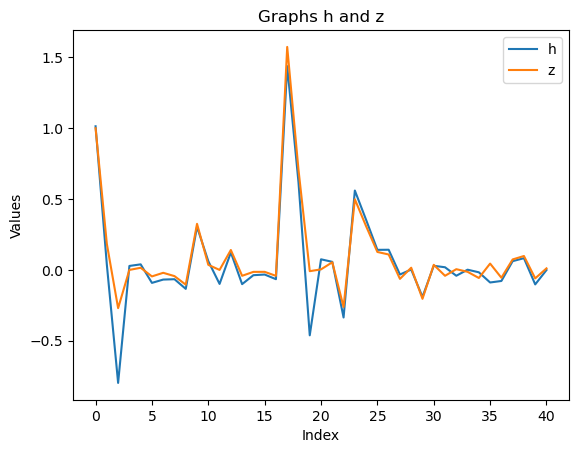

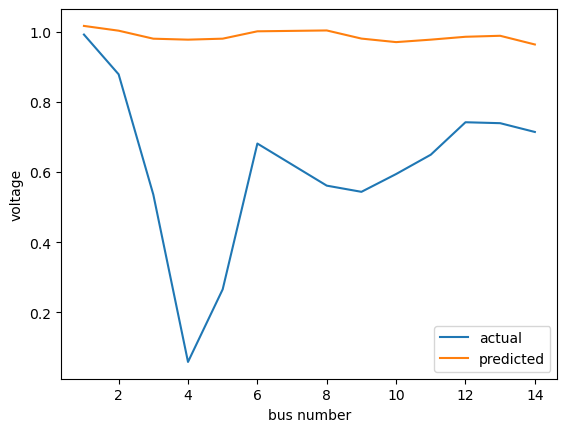

 repetition ------------->>>>>>>>>>>>>>>>> 1026
state 

 [1.01749409 1.00410996 0.98230829 0.97975004 0.98296717 1.00152225
 0.9884491  1.00518074 0.98445275 0.97484209 0.98039549 0.9881258
 0.99141434 0.96979884]


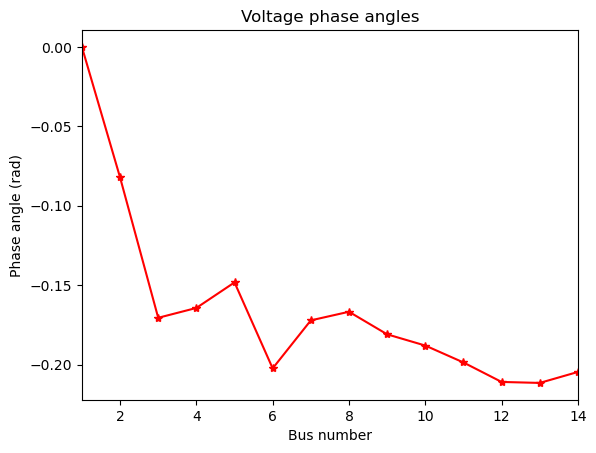

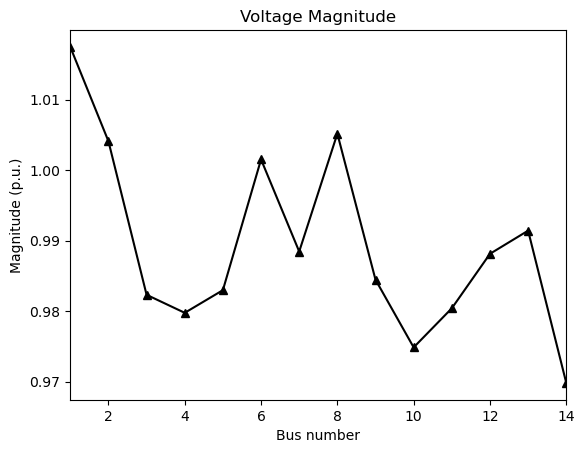

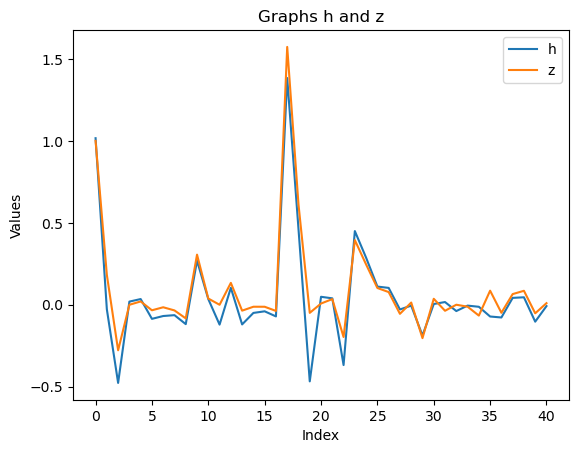

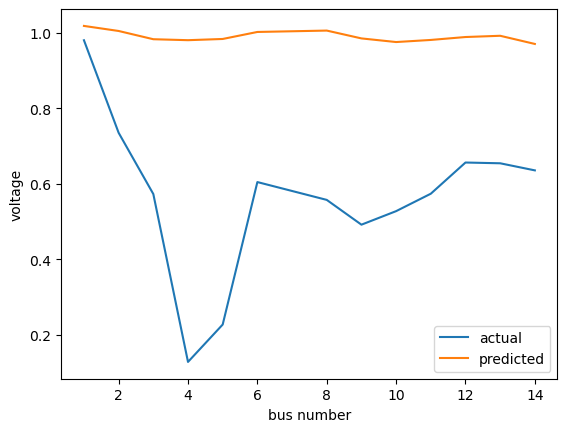

 repetition ------------->>>>>>>>>>>>>>>>> 1027
state 

 [1.01642037 1.00283668 0.98236137 0.97883975 0.98268875 0.99928205
 0.9887144  1.00535054 0.98467846 0.97600485 0.9806705  0.98779418
 0.99081531 0.97223449]


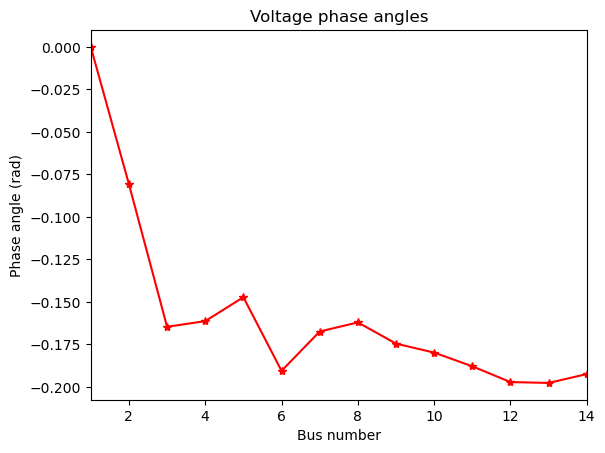

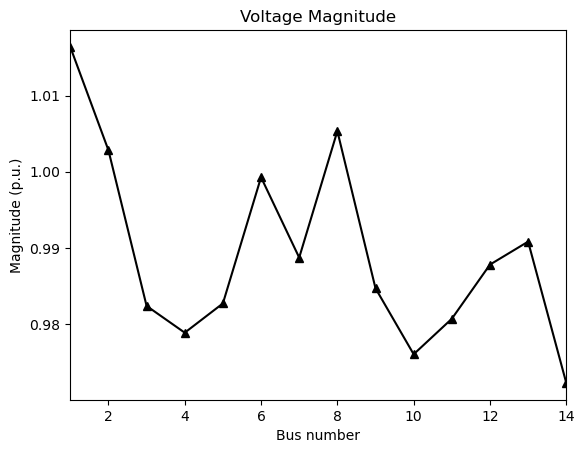

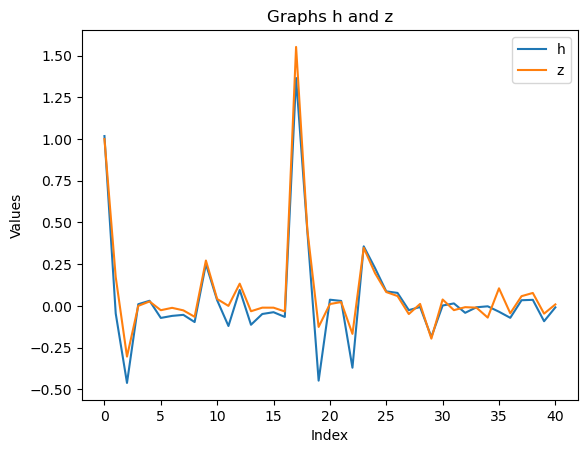

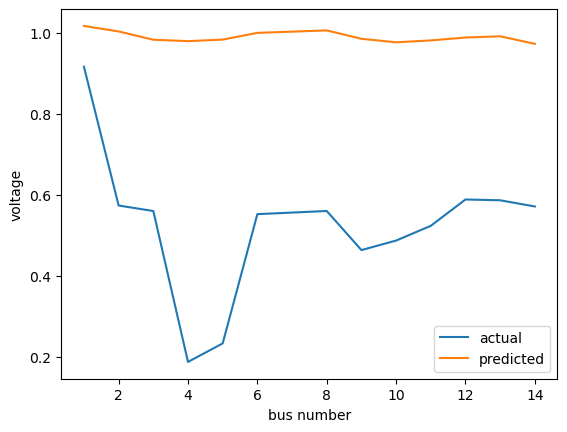

 repetition ------------->>>>>>>>>>>>>>>>> 1028
state 

 [1.01350711 0.99909929 0.97996261 0.97504981 0.97930025 0.99481579
 0.98590644 1.00284508 0.98198307 0.9735325  0.97752304 0.98452865
 0.9876477  0.97097378]


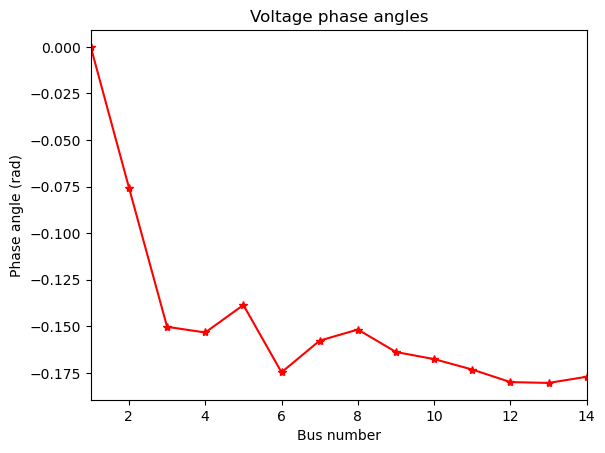

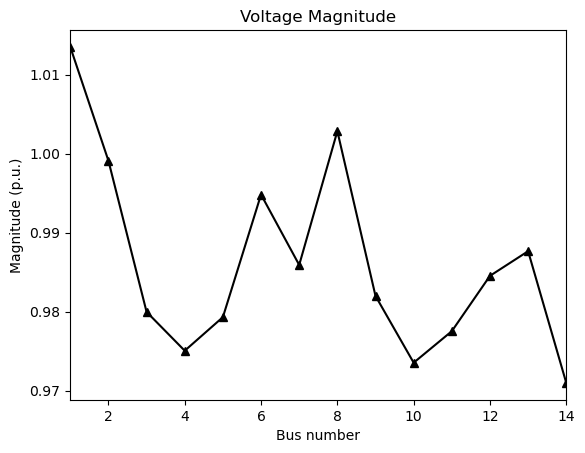

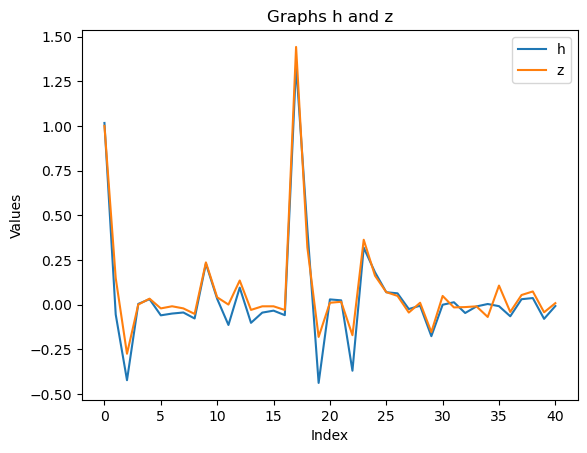

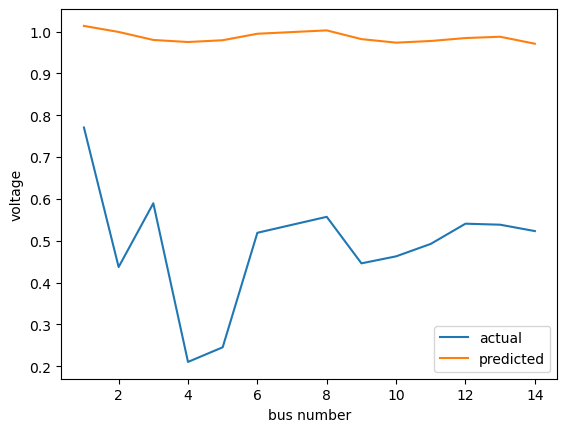

 repetition ------------->>>>>>>>>>>>>>>>> 1029
state 

 [1.00843358 0.9911352  0.96961816 0.96689533 0.97080306 0.98633069
 0.97819478 0.99530686 0.97527765 0.96567366 0.96881192 0.97642652
 0.98064313 0.96446491]


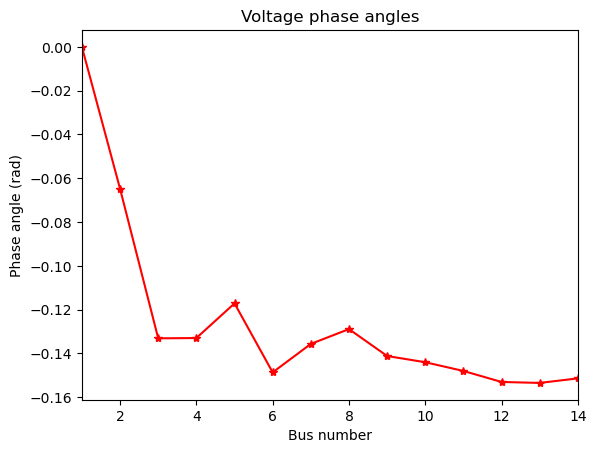

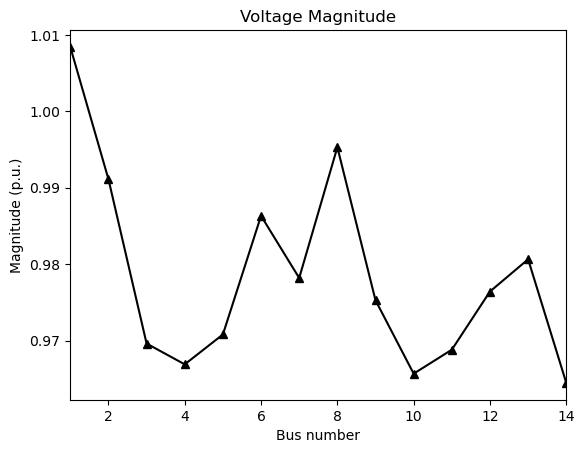

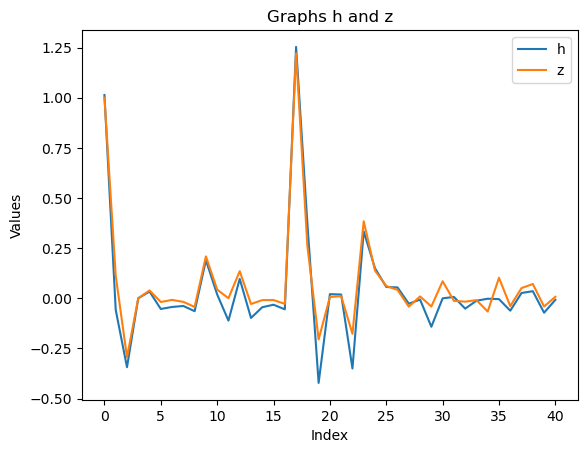

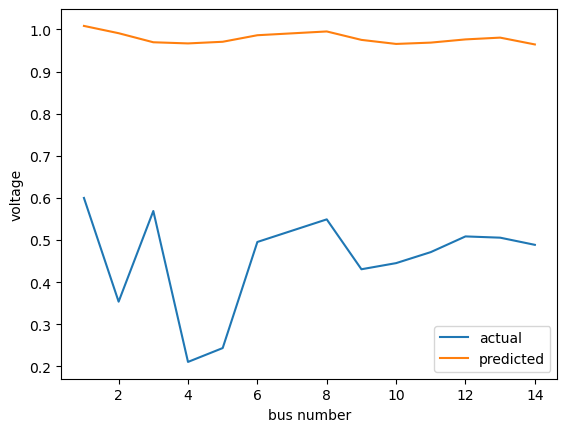

 repetition ------------->>>>>>>>>>>>>>>>> 1030
state 

 [1.00355613 0.98060817 0.95566615 0.95464359 0.95728396 0.97391118
 0.96600488 0.98309022 0.96530234 0.95292591 0.95473358 0.9636965
 0.9702837  0.9533419 ]


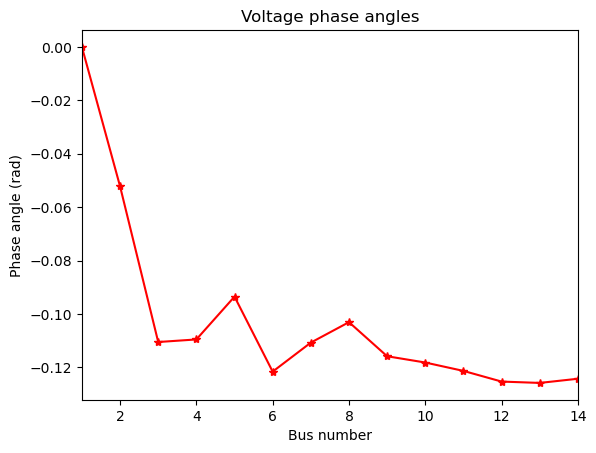

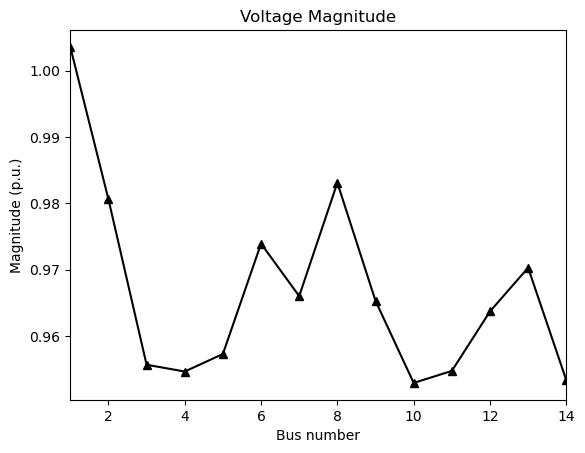

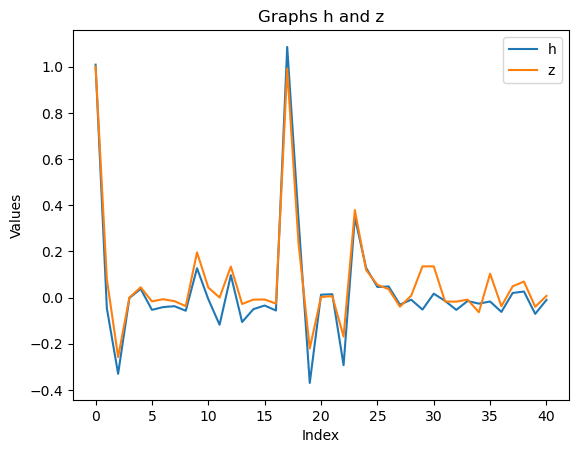

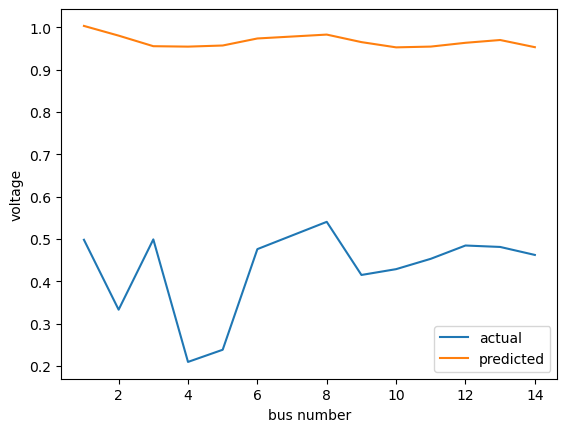

 repetition ------------->>>>>>>>>>>>>>>>> 1031
state 

 [1.00129625 0.97169896 0.94495042 0.94217693 0.94333456 0.96139236
 0.95356552 0.97062334 0.95531777 0.93986761 0.94026464 0.95066556
 0.95985281 0.94181285]


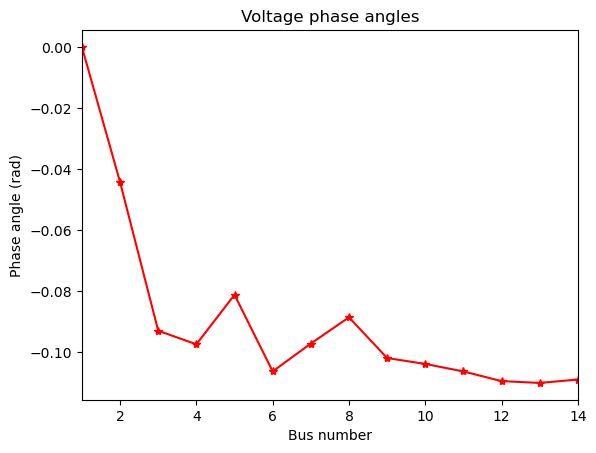

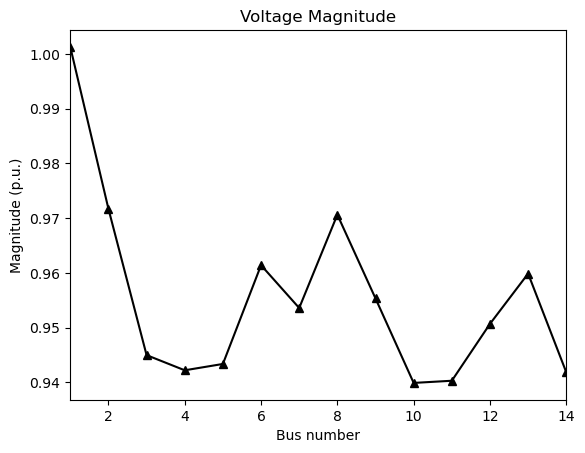

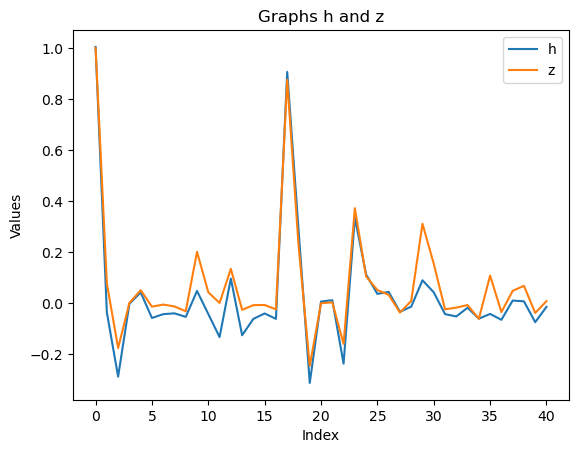

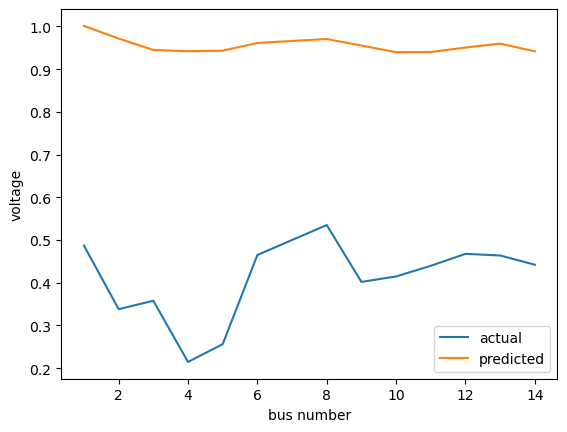

 repetition ------------->>>>>>>>>>>>>>>>> 1032
state 

 [1.00227435 0.9665011  0.94016977 0.93250218 0.93247892 0.95176348
 0.94404663 0.96119549 0.94780143 0.92983417 0.9290499  0.94056252
 0.95183557 0.93296312]


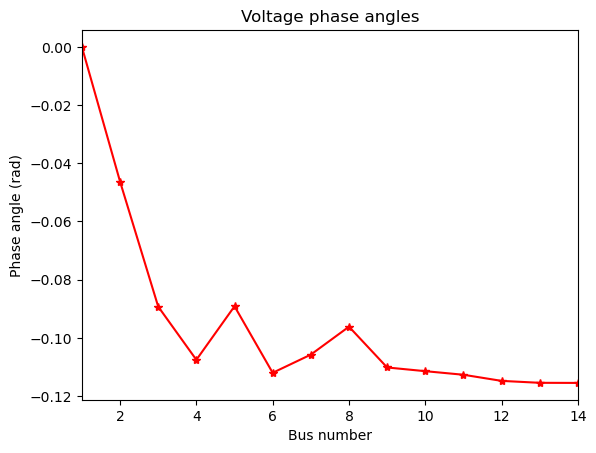

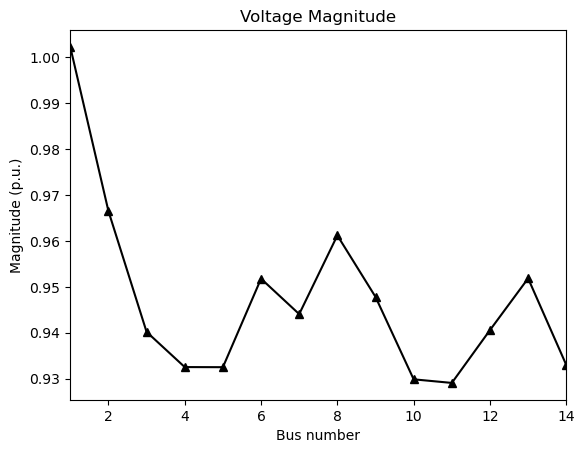

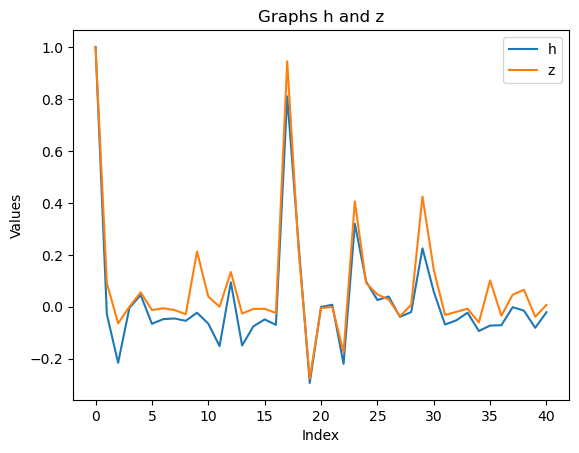

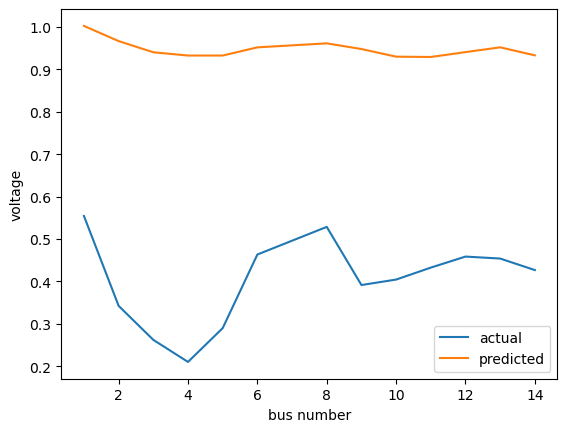

 repetition ------------->>>>>>>>>>>>>>>>> 1033
state 

 [1.00606244 0.96524187 0.93909701 0.92805996 0.9273606  0.94735121
 0.93970839 0.95688384 0.94470467 0.92519722 0.92366202 0.93580522
 0.94830398 0.92906751]


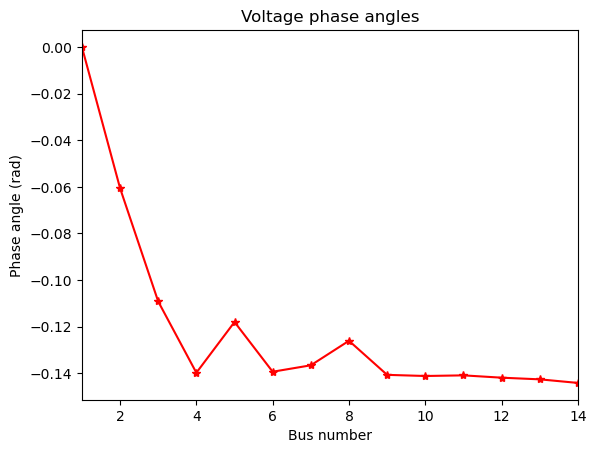

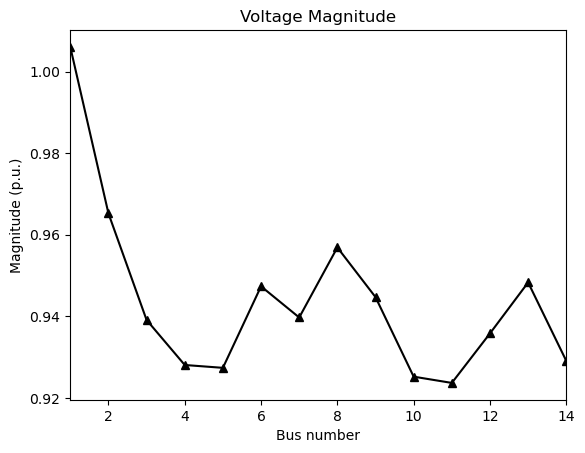

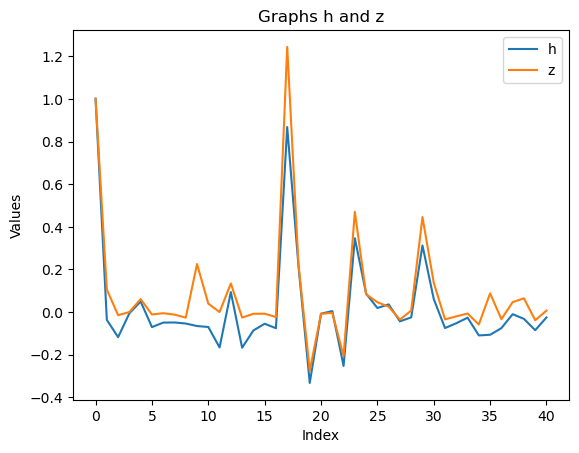

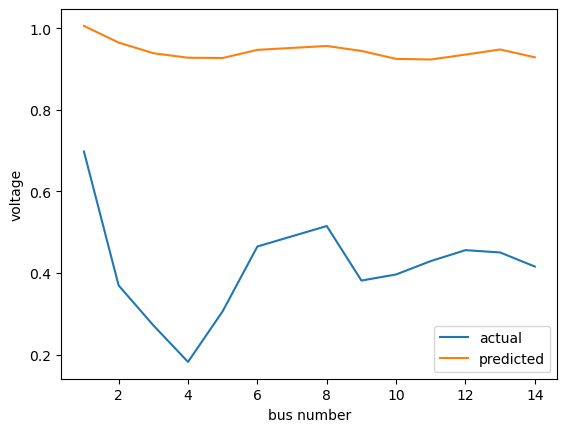

 repetition ------------->>>>>>>>>>>>>>>>> 1034
state 

 [1.01325614 0.97014783 0.94501611 0.93184154 0.93122    0.95104765
 0.94331651 0.96013071 0.94860475 0.92894421 0.92727795 0.93947499
 0.95211795 0.93306429]


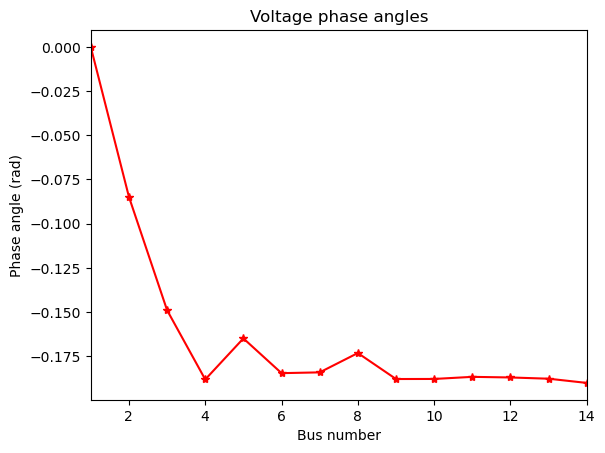

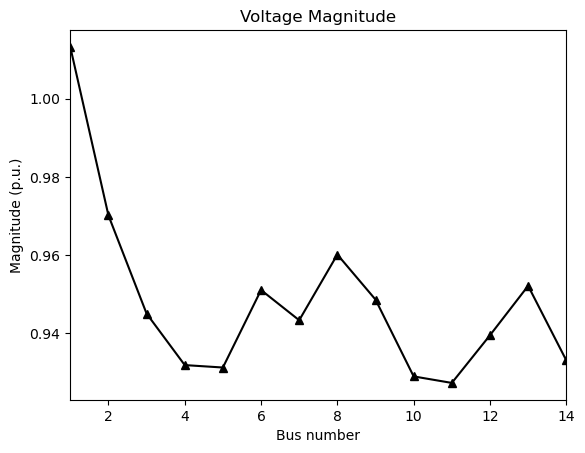

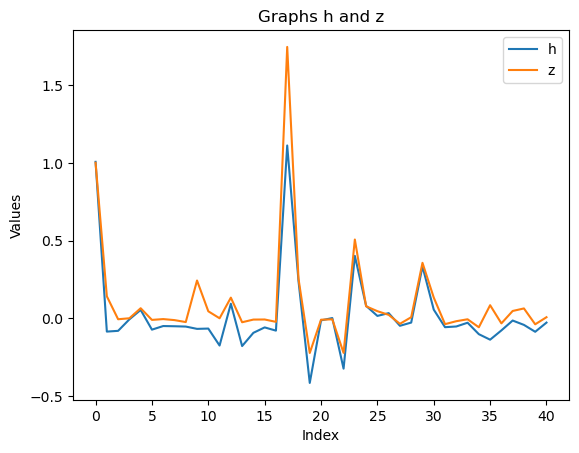

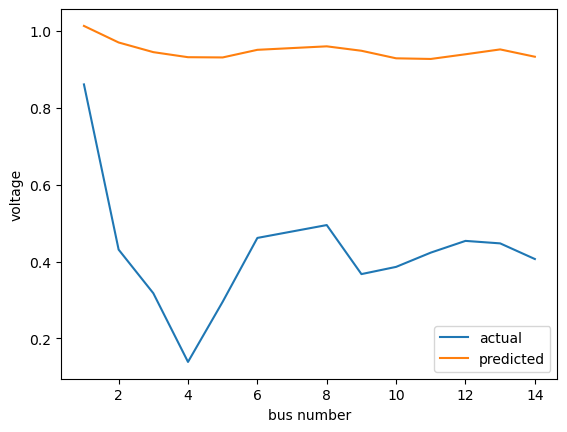

 repetition ------------->>>>>>>>>>>>>>>>> 1035
state 

 [1.02083886 0.97864055 0.95537272 0.93982503 0.94054733 0.9590496
 0.95099364 0.96719849 0.95535262 0.93738368 0.93641656 0.94797225
 0.95939896 0.94117878]


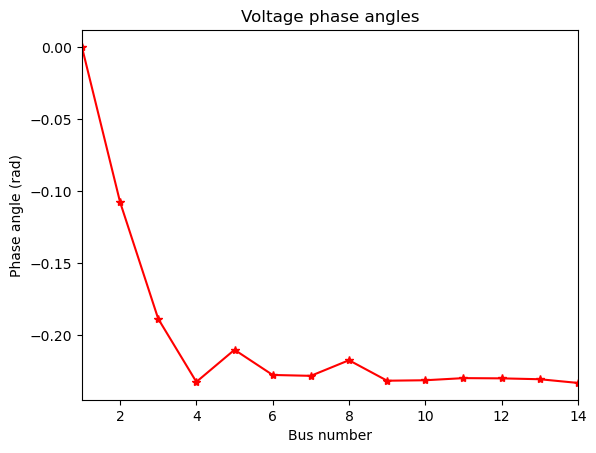

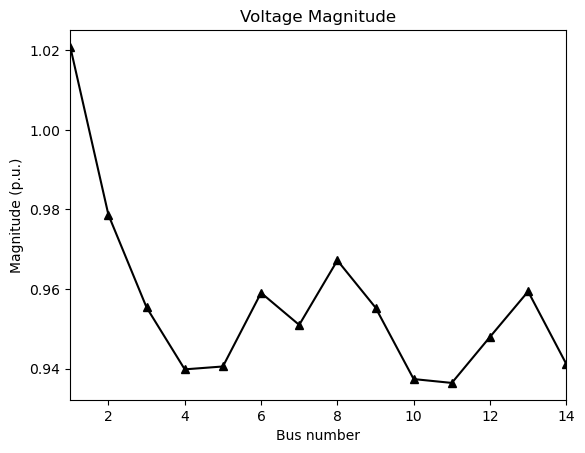

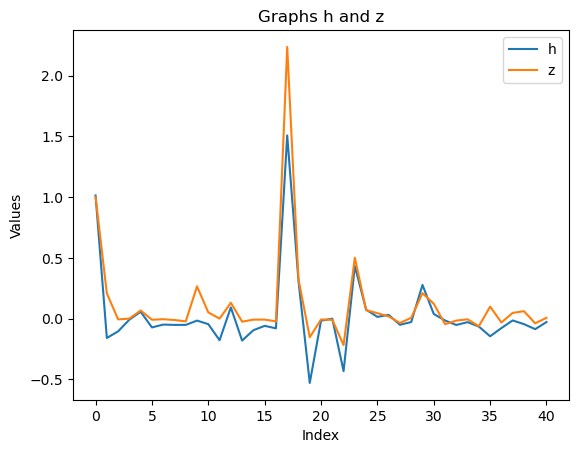

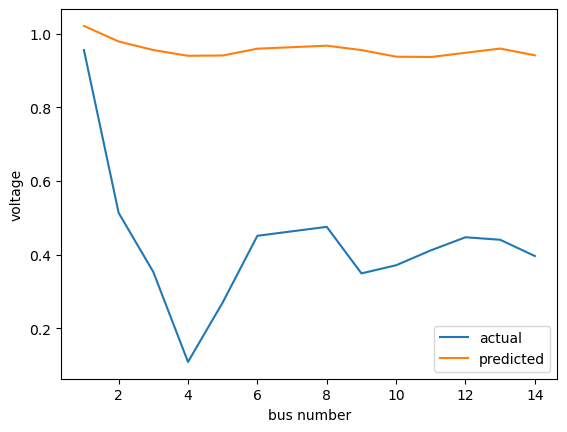

 repetition ------------->>>>>>>>>>>>>>>>> 1036
state 

 [1.02497299 0.98445756 0.96206919 0.94451759 0.94666426 0.96394631
 0.95559543 0.97133544 0.95927949 0.94273947 0.94231681 0.9533593
 0.96382992 0.94630256]


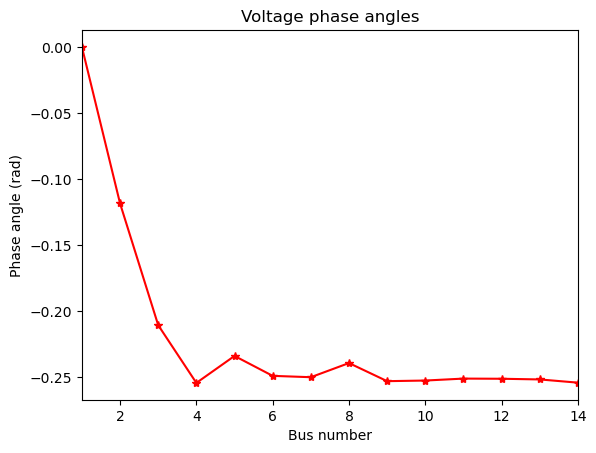

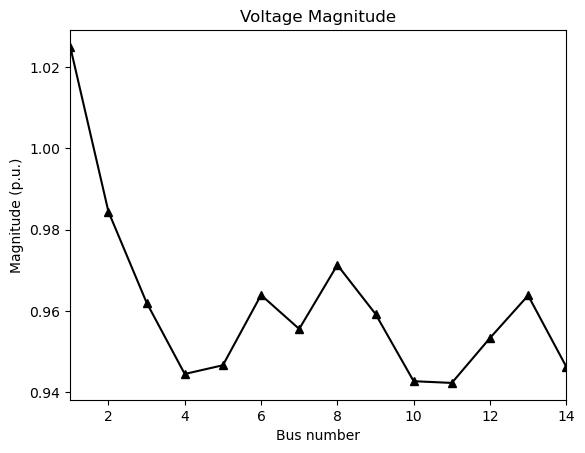

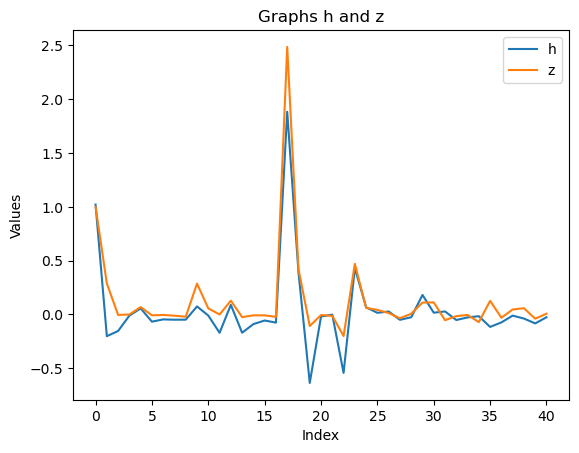

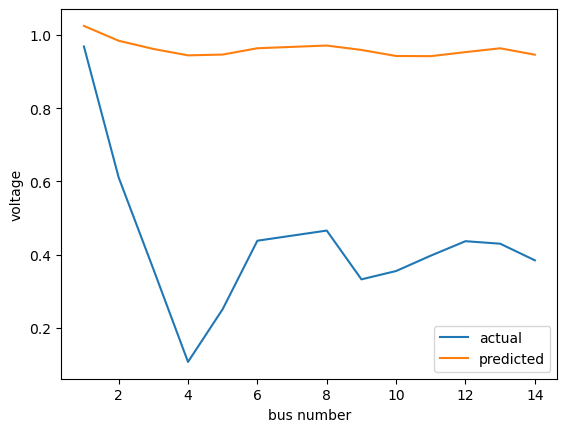

 repetition ------------->>>>>>>>>>>>>>>>> 1037
state 

 [1.02510928 0.9845564  0.96157746 0.94266389 0.94520012 0.96236414
 0.95404557 0.96977522 0.95836094 0.94135064 0.94056471 0.9518155
 0.96279413 0.94525811]


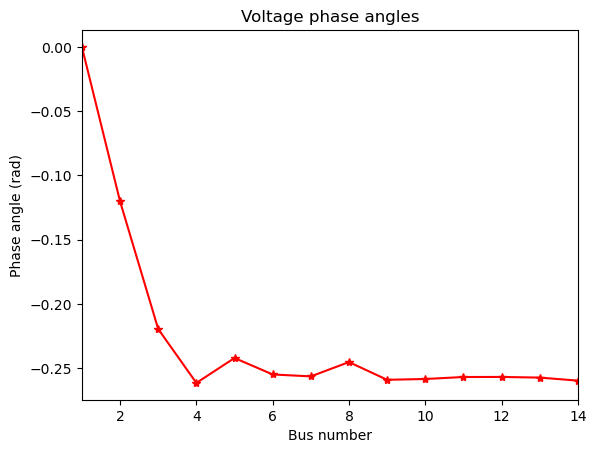

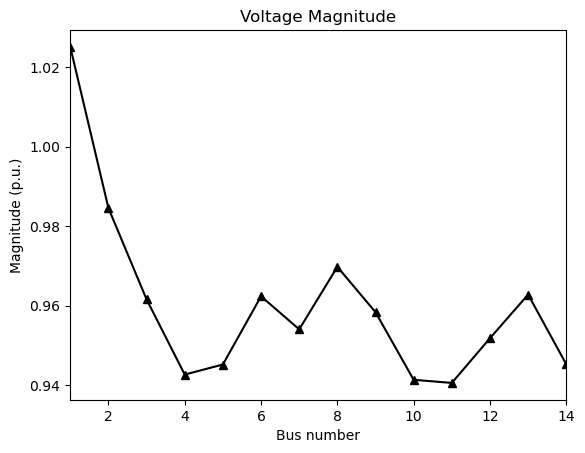

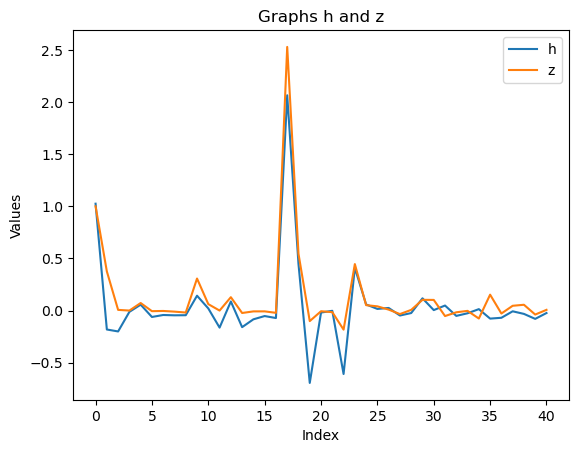

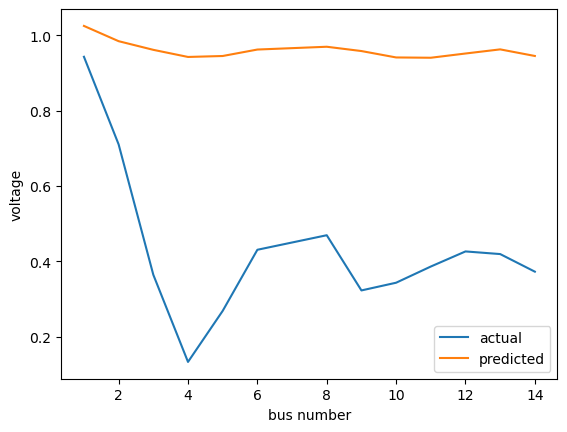

 repetition ------------->>>>>>>>>>>>>>>>> 1038
state 

 [1.02183271 0.97887787 0.95451401 0.93375922 0.93635685 0.95394027
 0.94581697 0.96222361 0.9511043  0.93282944 0.93137539 0.94314532
 0.9551268  0.9372885 ]


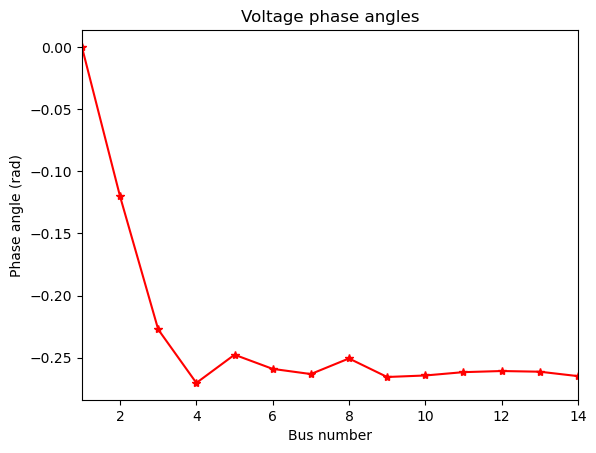

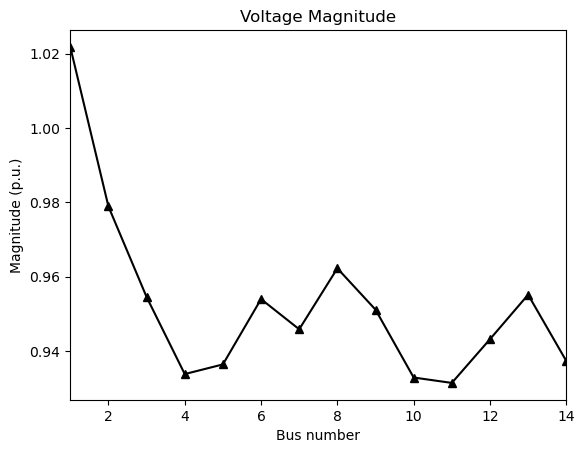

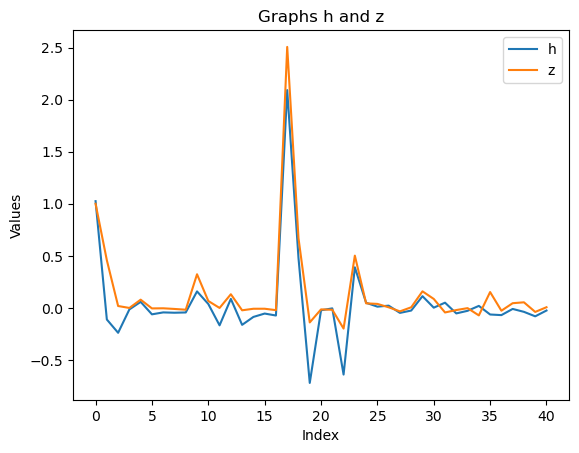

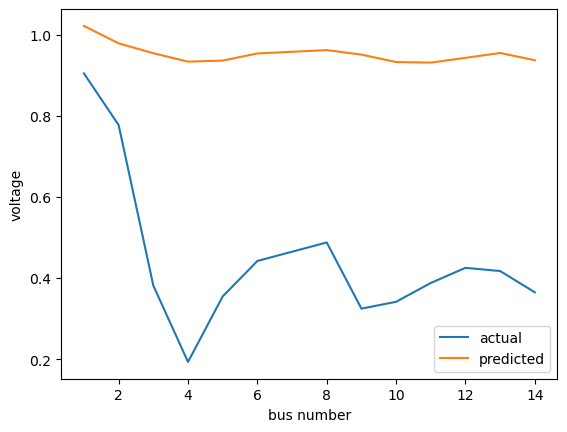

 repetition ------------->>>>>>>>>>>>>>>>> 1039
state 

 [1.01468238 0.96752126 0.94134992 0.91750935 0.92077072 0.9386859
 0.93048864 0.94840843 0.93591994 0.91699837 0.9153846  0.92751457
 0.93976382 0.92174125]


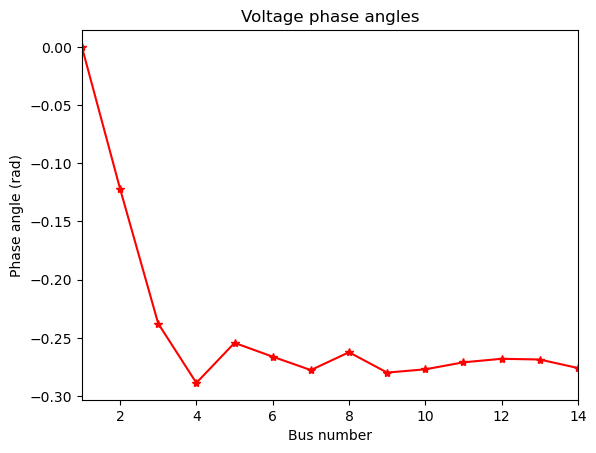

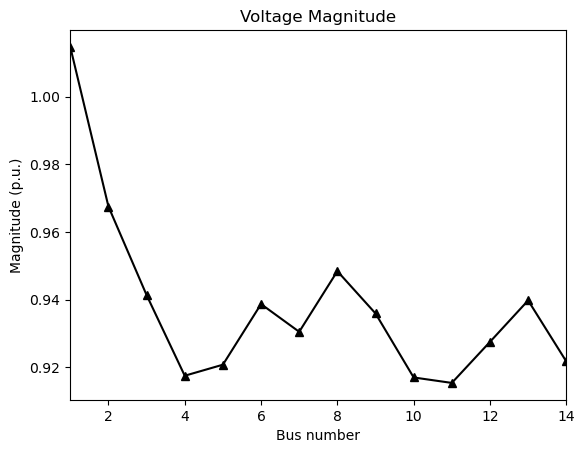

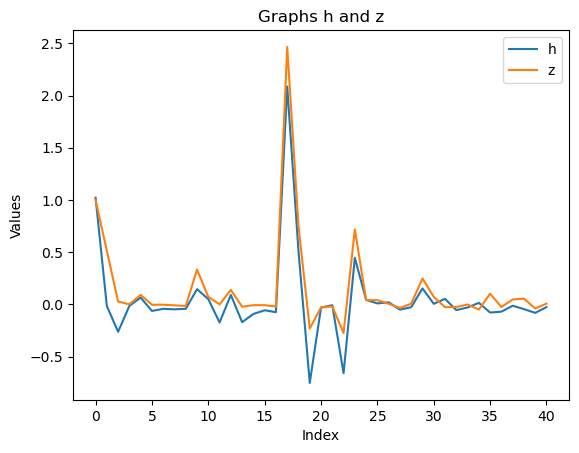

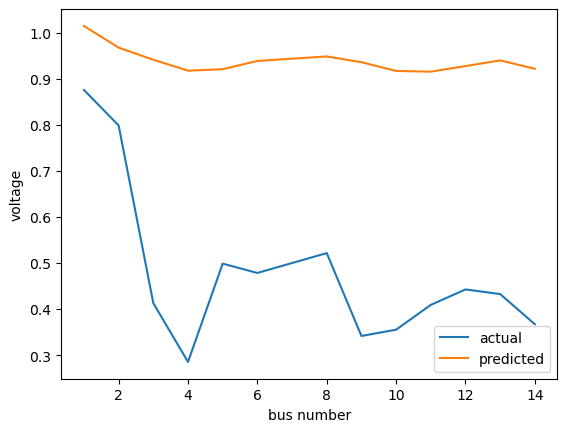

 repetition ------------->>>>>>>>>>>>>>>>> 1040
state 

 [1.00619496 0.95481638 0.92657124 0.89879898 0.9038004  0.92153044
 0.91275325 0.93295951 0.91660451 0.89874606 0.89806263 0.91000391
 0.92086202 0.90309777]


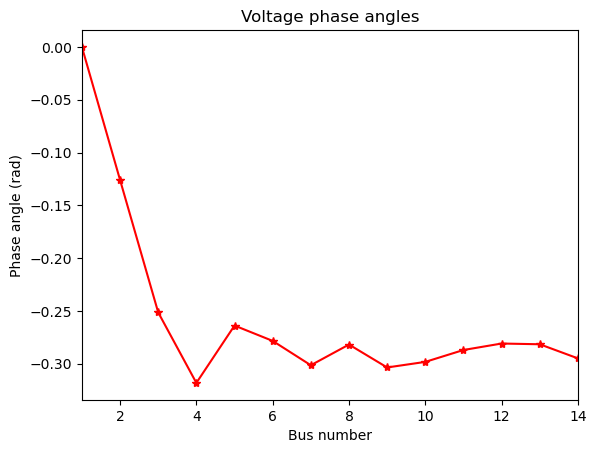

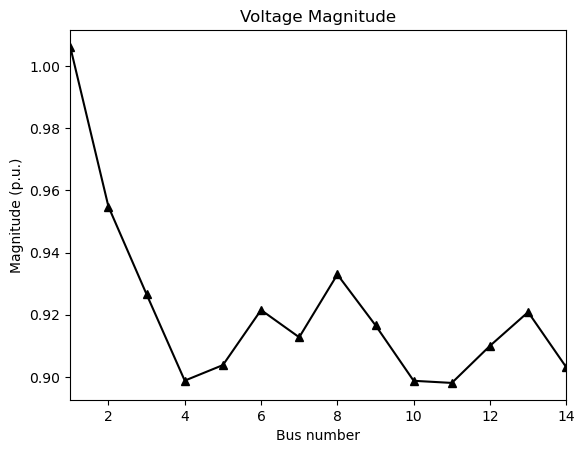

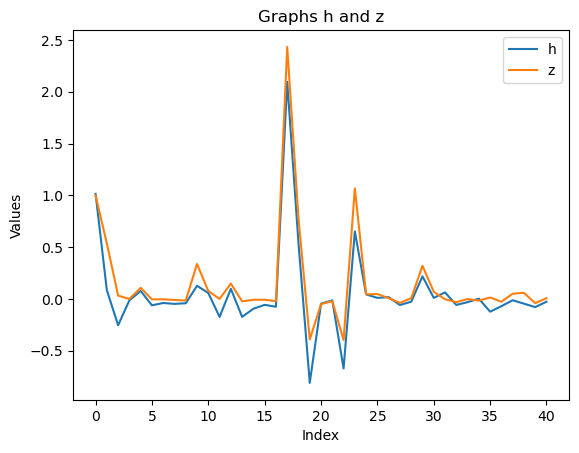

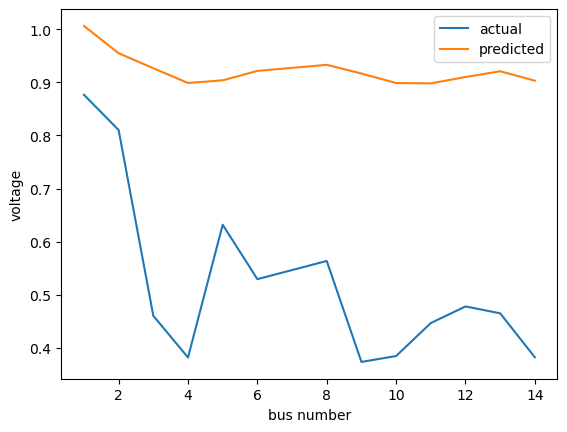

 repetition ------------->>>>>>>>>>>>>>>>> 1041
state 

 [1.0019698  0.94830034 0.91837257 0.88615826 0.89388299 0.91069231
 0.90090983 0.92375437 0.90116763 0.88653945 0.88802919 0.89903461
 0.90657385 0.88964431]


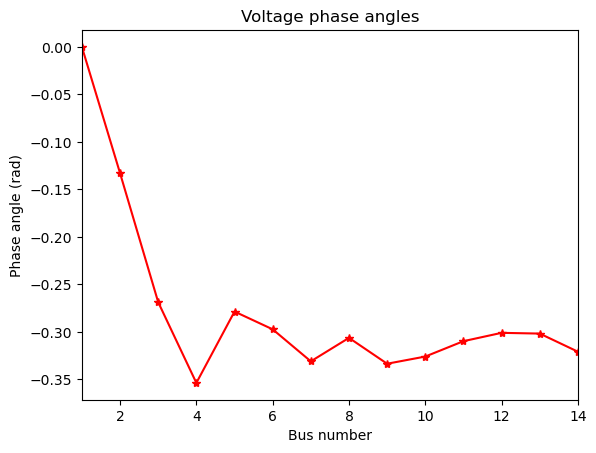

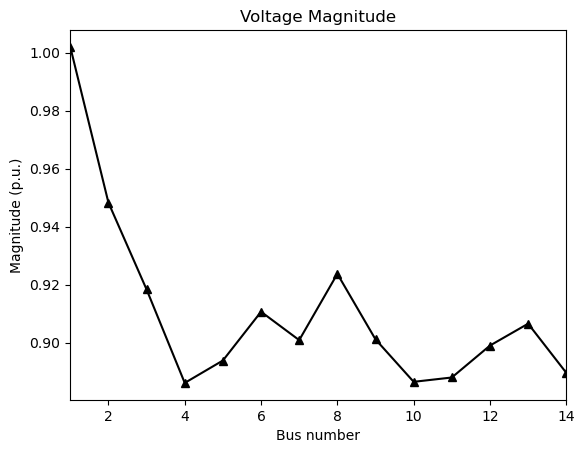

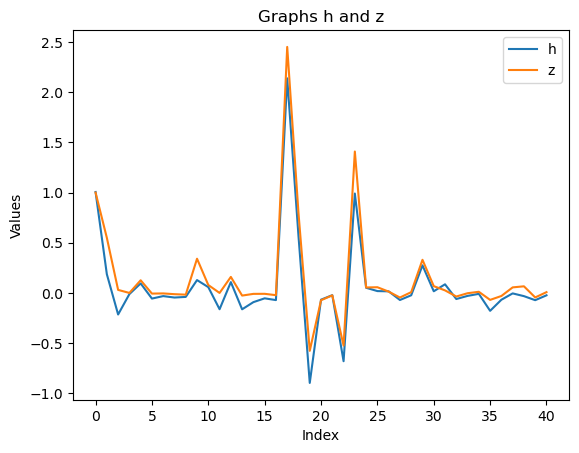

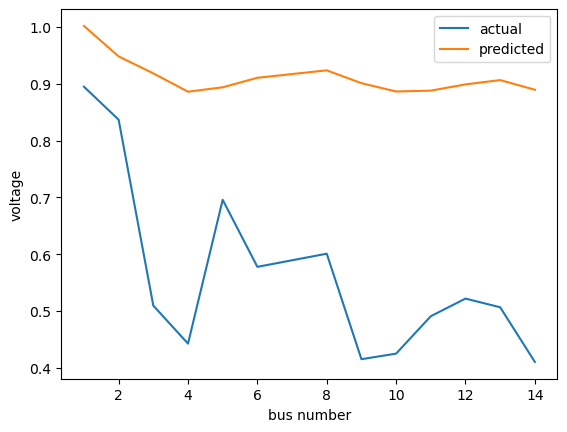

 repetition ------------->>>>>>>>>>>>>>>>> 1042
state 

 [1.00201655 0.94793356 0.91710929 0.87996586 0.89085291 0.9065596
 0.89523607 0.92048103 0.89122097 0.88065526 0.88493991 0.89487339
 0.89849918 0.88219955]


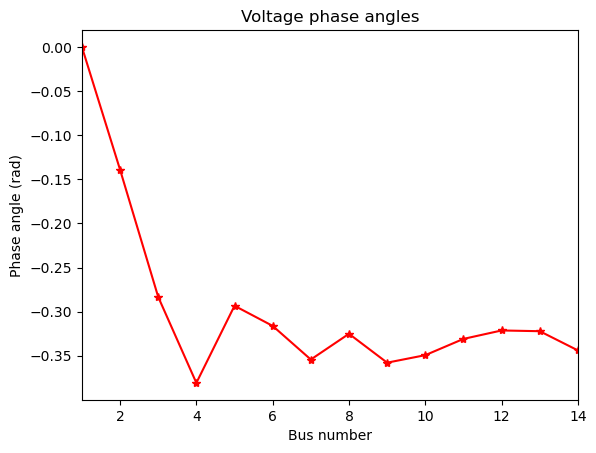

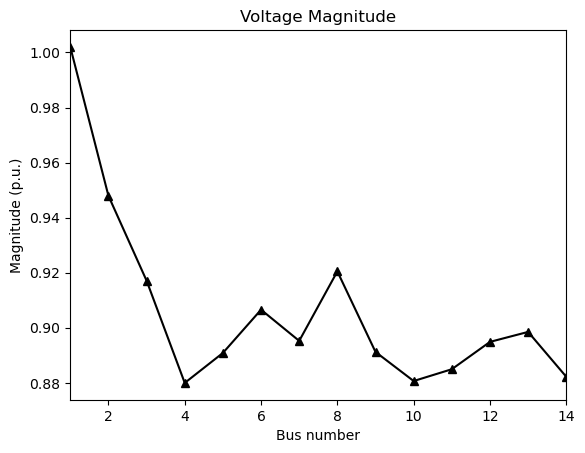

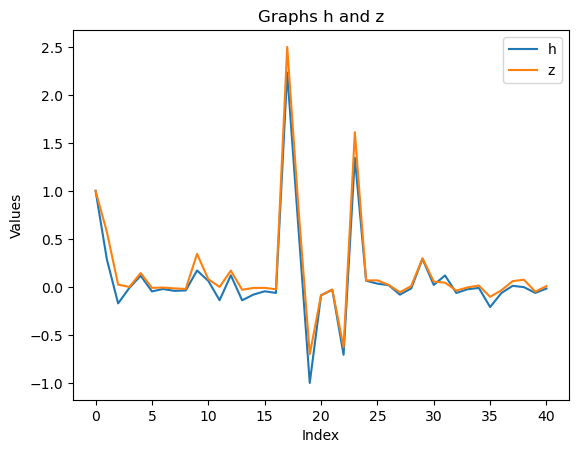

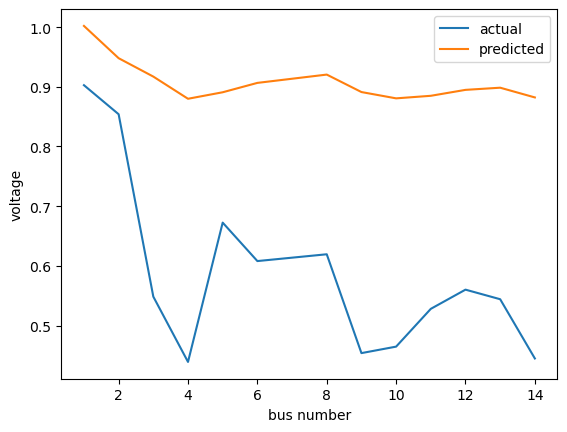

 repetition ------------->>>>>>>>>>>>>>>>> 1043
state 

 [0.99998534 0.94566216 0.91389414 0.87224646 0.88614586 0.9015332
 0.88783331 0.91485679 0.88101513 0.87305844 0.87976094 0.88954731
 0.89074917 0.87363487]


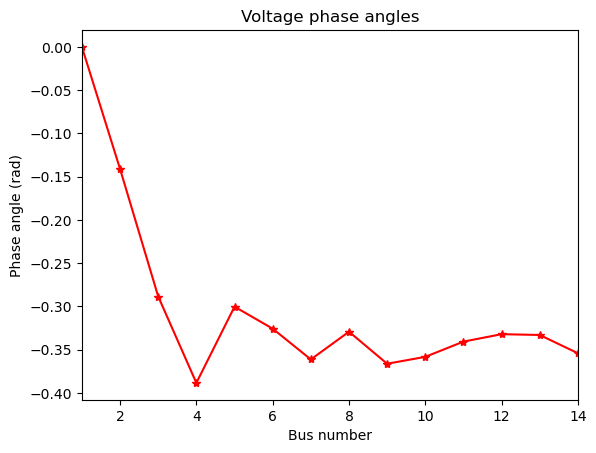

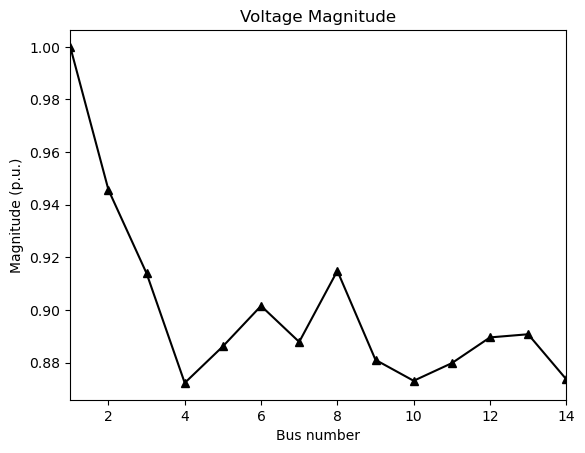

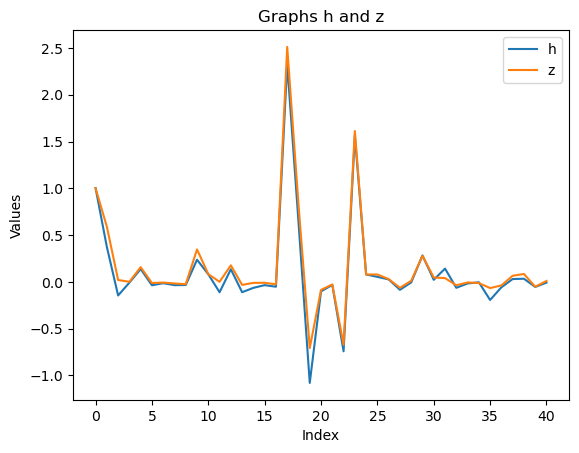

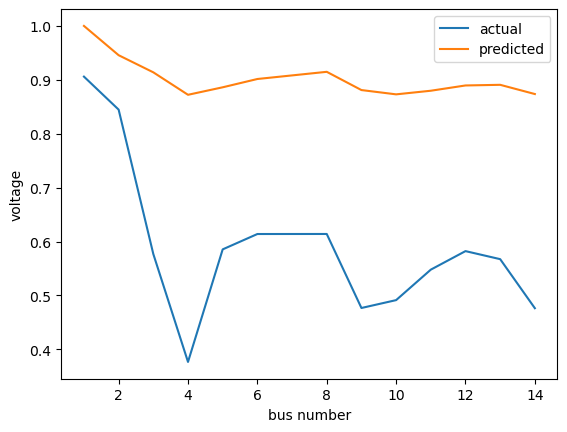

 repetition ------------->>>>>>>>>>>>>>>>> 1044
state 

 [0.9963853  0.9415813  0.90842314 0.86332029 0.88008109 0.89569122
 0.87910868 0.90705105 0.87134663 0.86434744 0.87277341 0.88330766
 0.8838276  0.86466398]


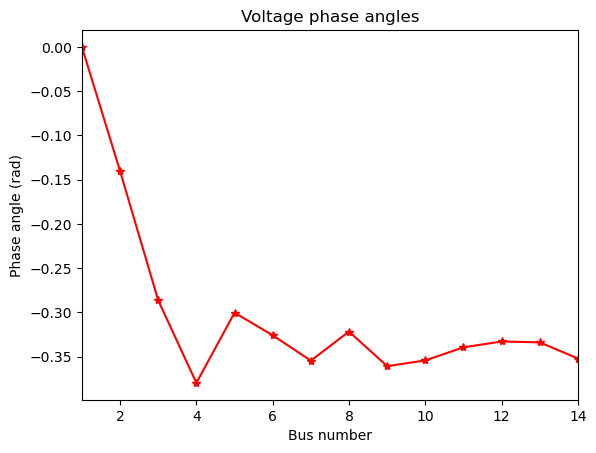

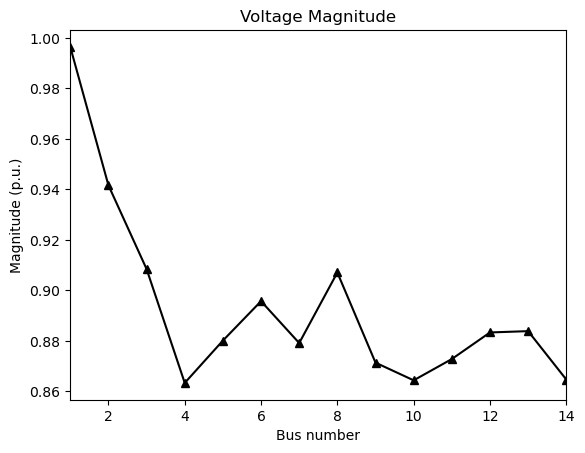

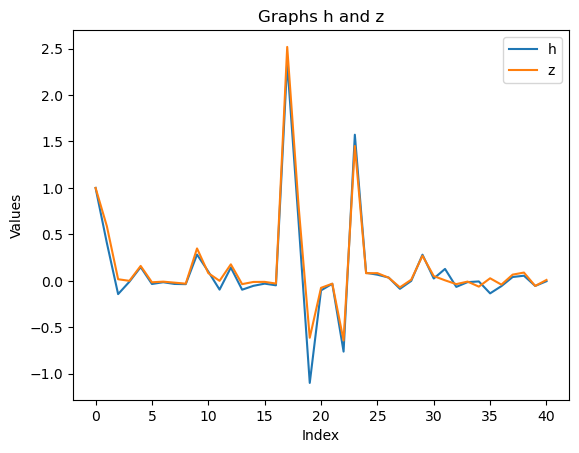

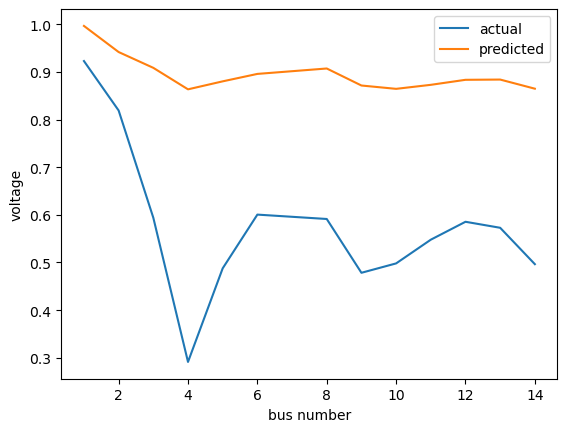

 repetition ------------->>>>>>>>>>>>>>>>> 1045
state 

 [0.99713775 0.94244224 0.90802713 0.86035894 0.88003603 0.89535771
 0.87631512 0.90426656 0.86847852 0.86208336 0.8716809  0.88296883
 0.88341656 0.86238867]


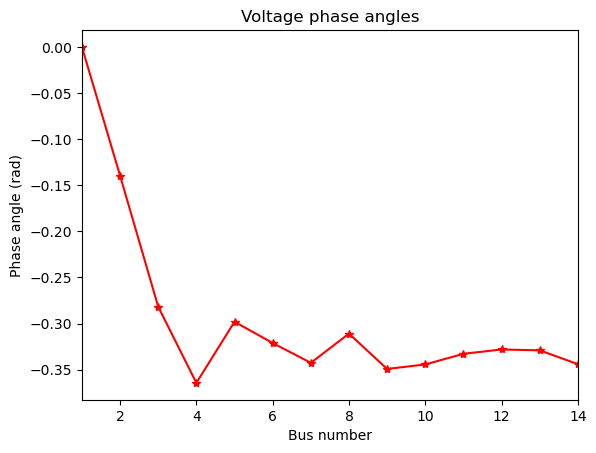

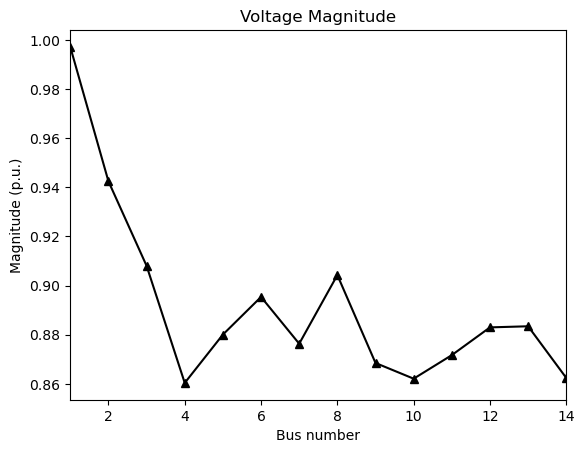

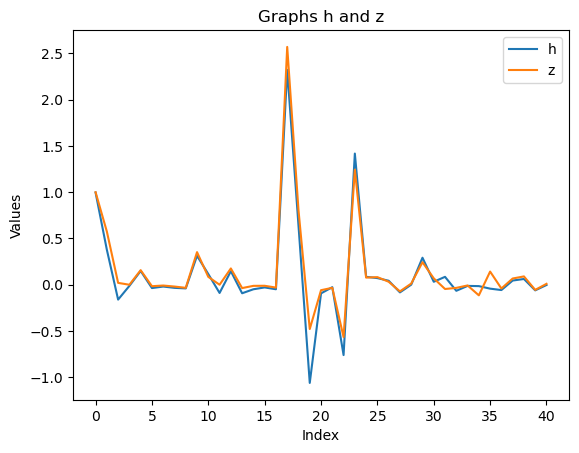

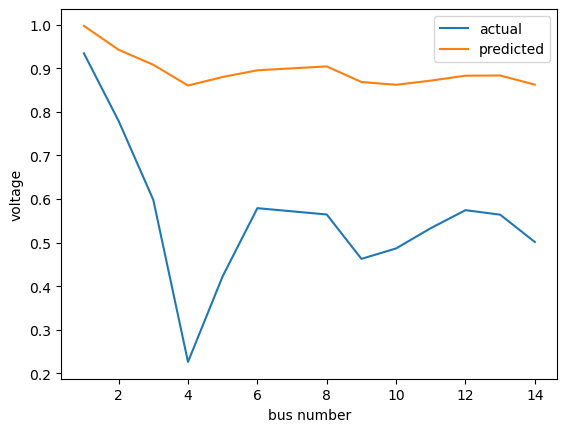

 repetition ------------->>>>>>>>>>>>>>>>> 1046
state 

 [1.00101715 0.94633154 0.91063405 0.86160833 0.88359404 0.89830616
 0.8778048  0.90532566 0.87059765 0.86427804 0.87425019 0.88612445
 0.88698988 0.86481253]


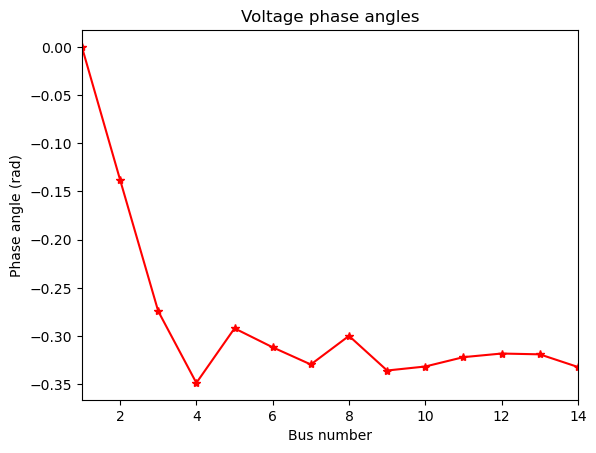

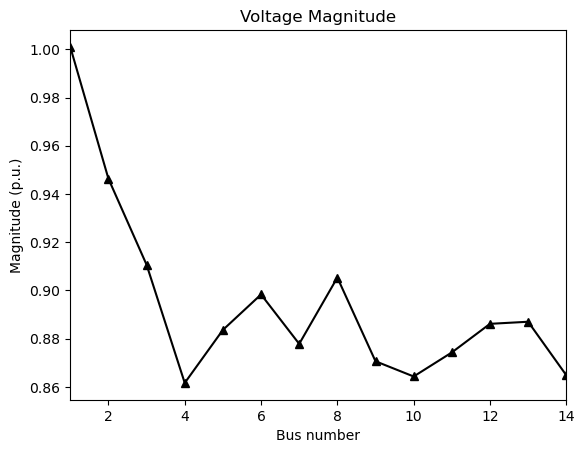

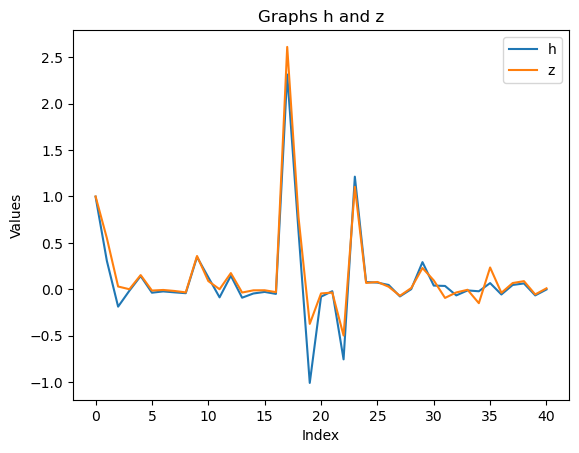

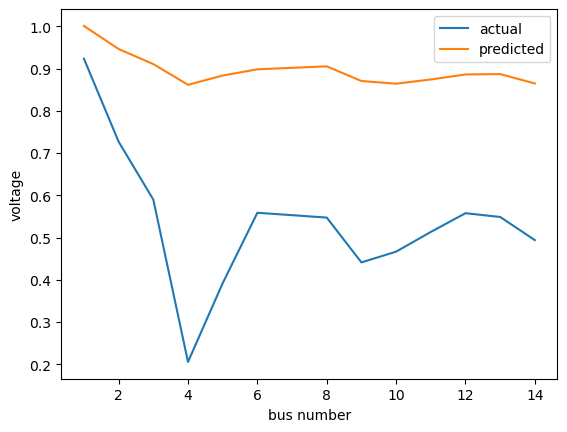

 repetition ------------->>>>>>>>>>>>>>>>> 1047
state 

 [1.00419053 0.94808633 0.91071981 0.86172746 0.88478932 0.89945835
 0.87826575 0.90552252 0.8726507  0.86509472 0.87453237 0.88723947
 0.88948012 0.86635791]


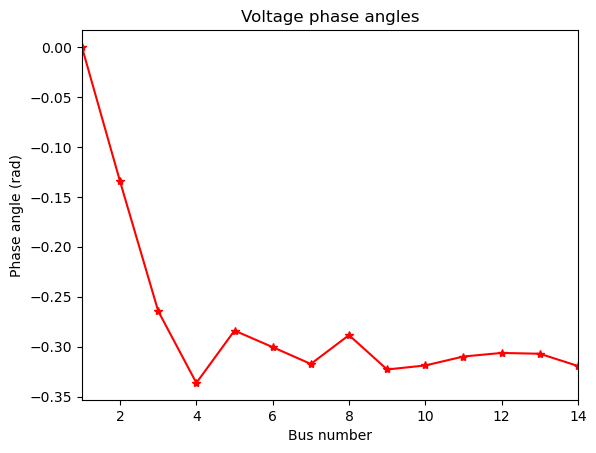

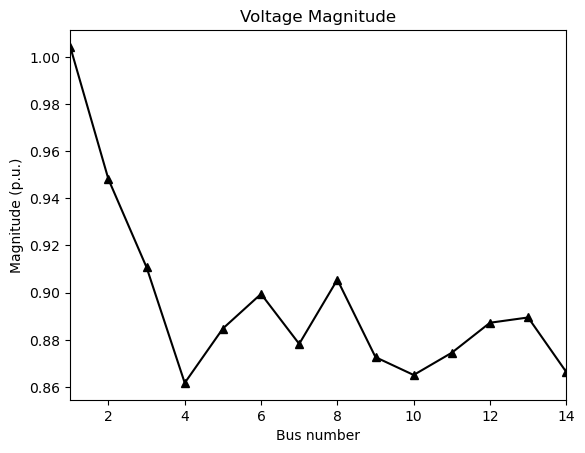

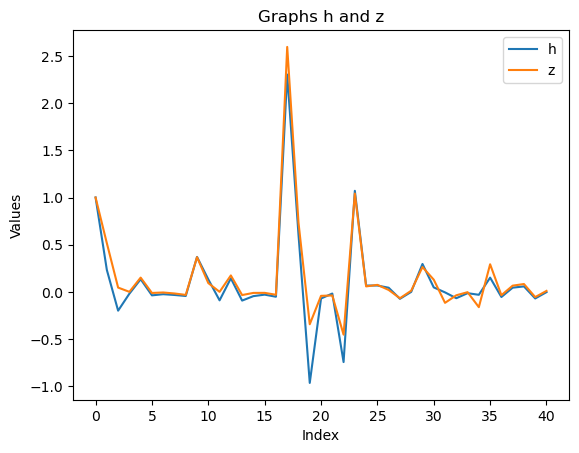

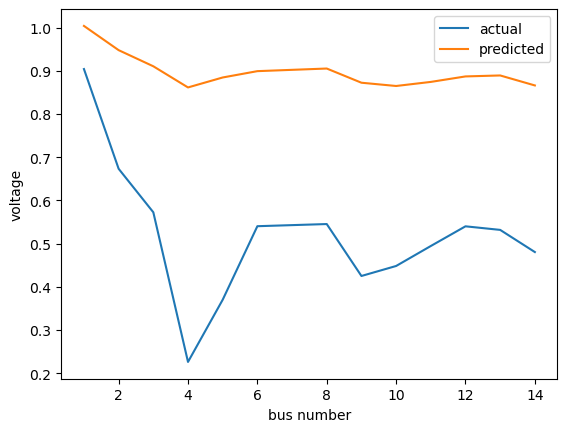

 repetition ------------->>>>>>>>>>>>>>>>> 1048
state 

 [1.00736432 0.94878827 0.9099609  0.8617963  0.88478676 0.90002645
 0.87867598 0.90605096 0.87514517 0.86539655 0.87375716 0.88754404
 0.89183995 0.86777398]


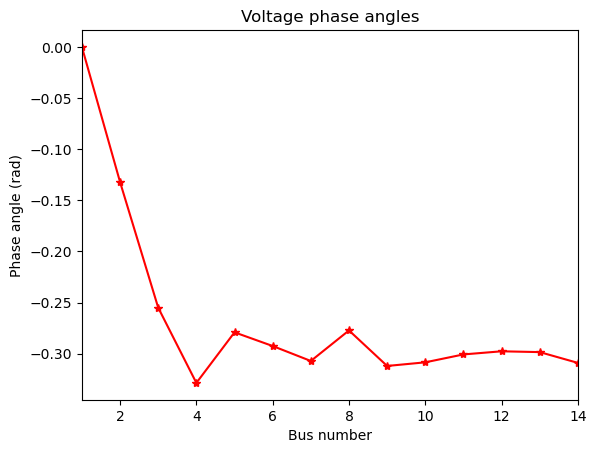

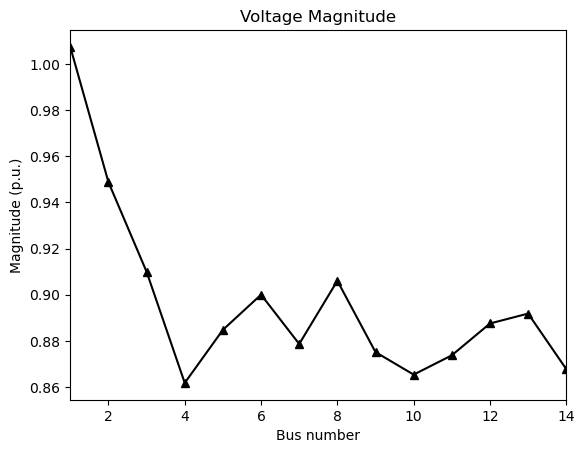

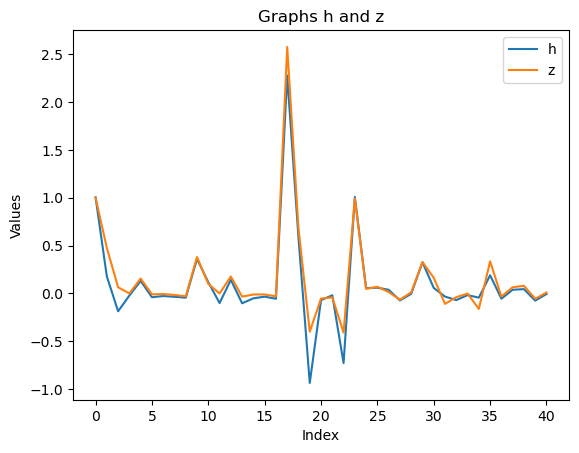

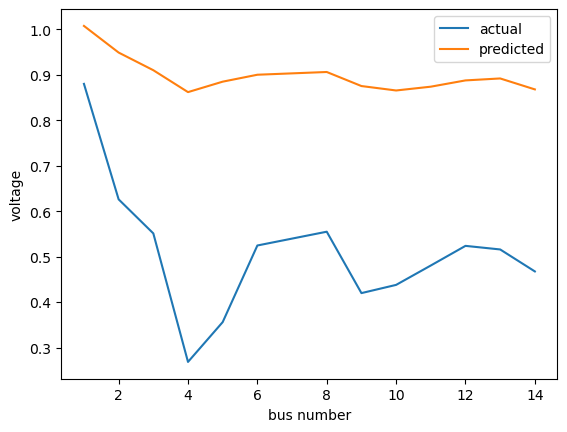

 repetition ------------->>>>>>>>>>>>>>>>> 1049
state 

 [1.00931811 0.94756163 0.90771169 0.86024902 0.88228343 0.89843645
 0.87736953 0.90527146 0.87597178 0.8634528  0.87047778 0.88552574
 0.89219459 0.86710334]


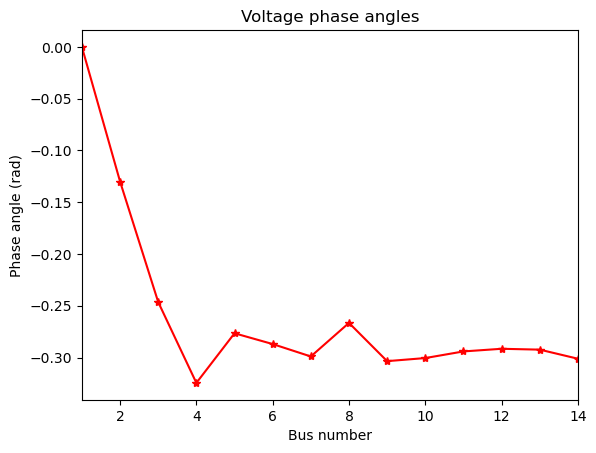

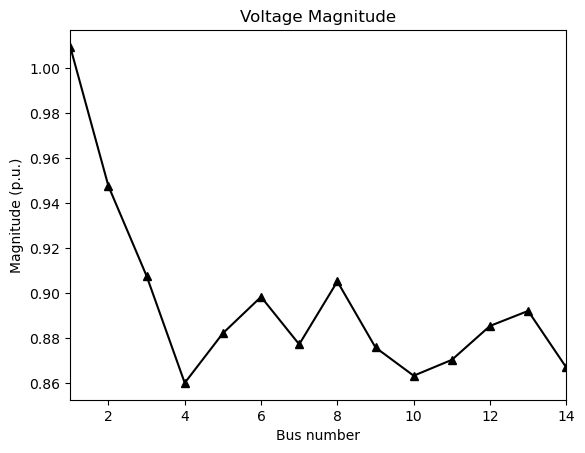

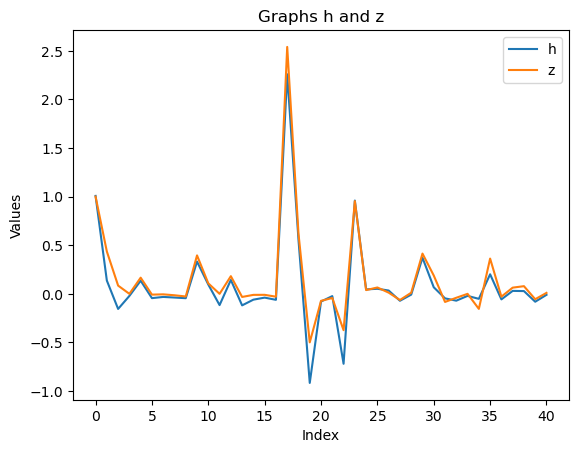

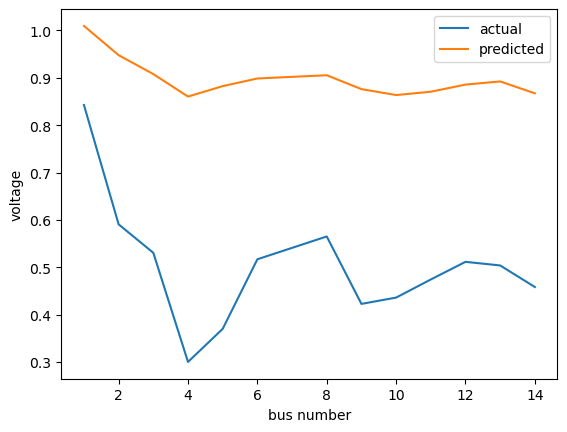

 repetition ------------->>>>>>>>>>>>>>>>> 1050
state 

 [1.00552702 0.93913684 0.89804138 0.85079988 0.87113661 0.88857023
 0.86806622 0.89687456 0.86889988 0.85288038 0.85831323 0.8748861
 0.8842054  0.85784524]


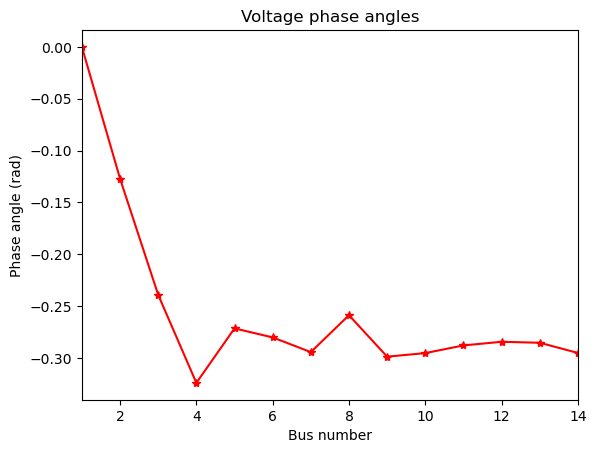

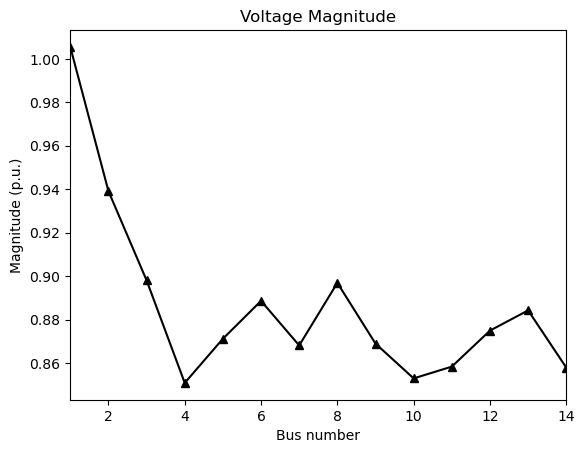

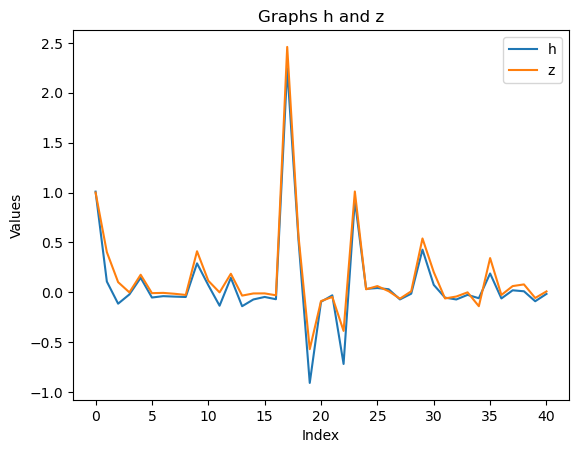

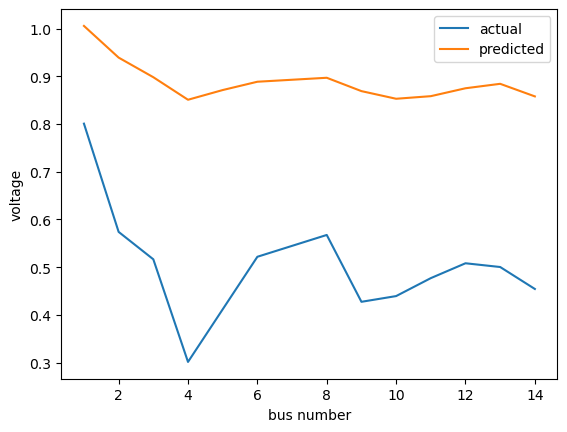

 repetition ------------->>>>>>>>>>>>>>>>> 1051
state 

 [0.99619778 0.92358778 0.88047885 0.83267717 0.85105787 0.87007718
 0.85013386 0.88008293 0.85321447 0.83330153 0.83704322 0.85524735
 0.86720389 0.8394462 ]


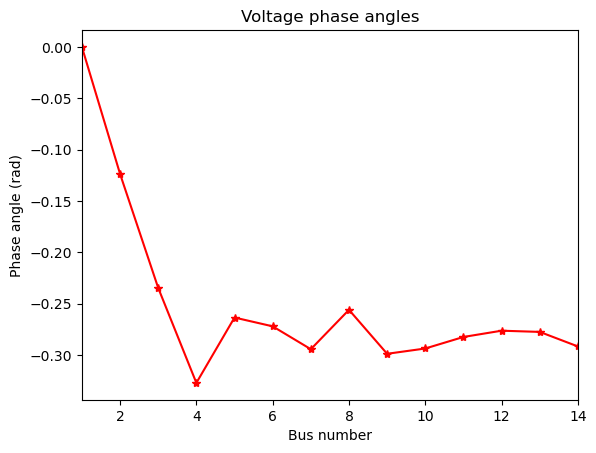

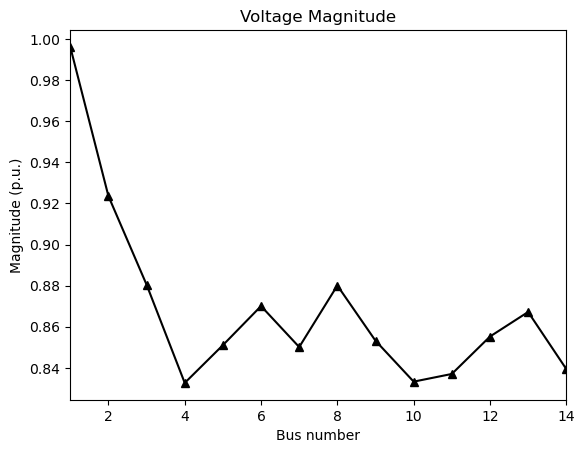

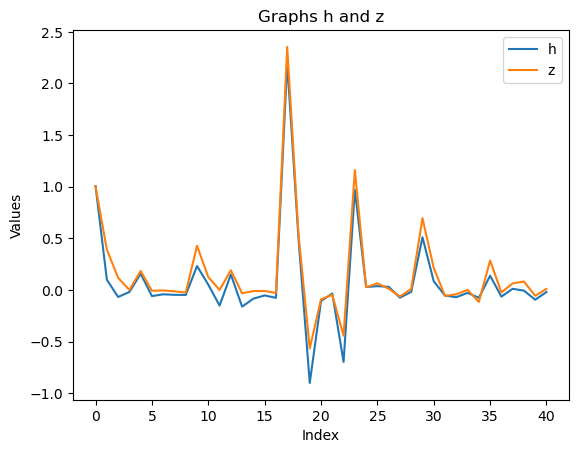

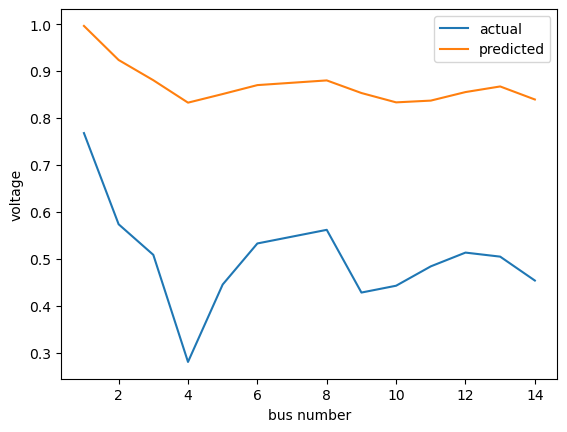

 repetition ------------->>>>>>>>>>>>>>>>> 1052
state 

 [0.98769794 0.90846529 0.86263531 0.8126833  0.82999828 0.85046135
 0.83057353 0.86168116 0.83554966 0.81234551 0.81478344 0.83442555
 0.84846972 0.81936781]


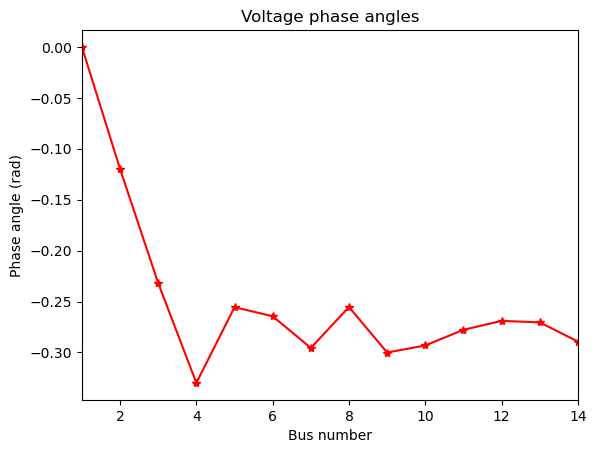

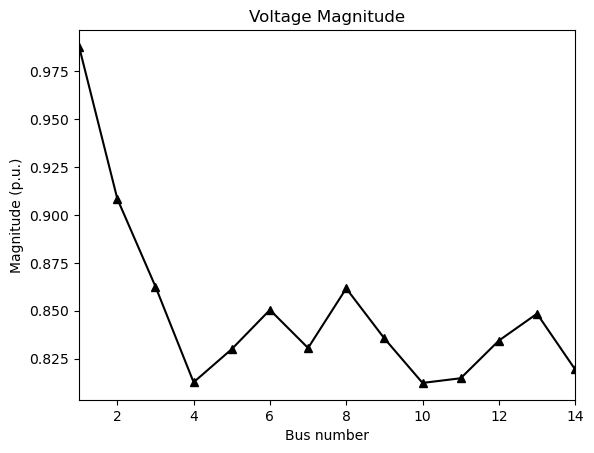

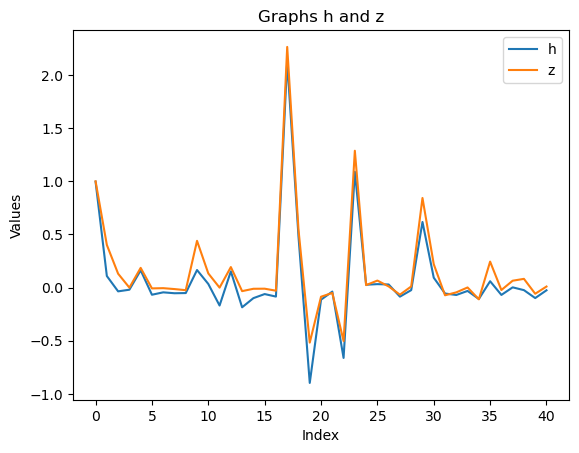

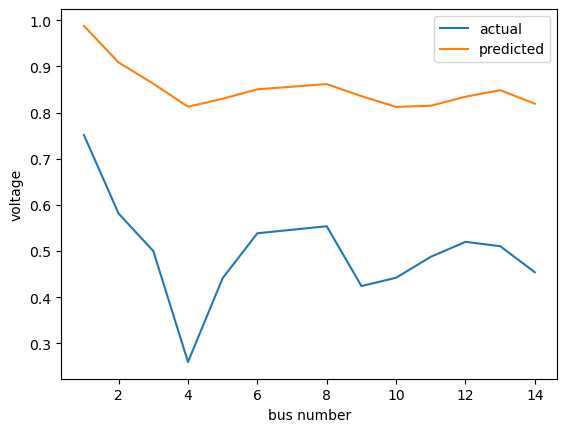

 repetition ------------->>>>>>>>>>>>>>>>> 1053
state 

 [0.9831432  0.89835691 0.84969794 0.79544691 0.8137489  0.83493148
 0.81412743 0.84640181 0.82021629 0.79531601 0.79738543 0.81805801
 0.83321332 0.8028827 ]


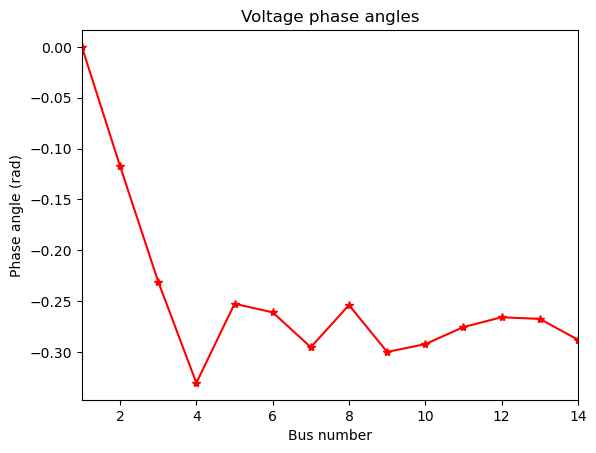

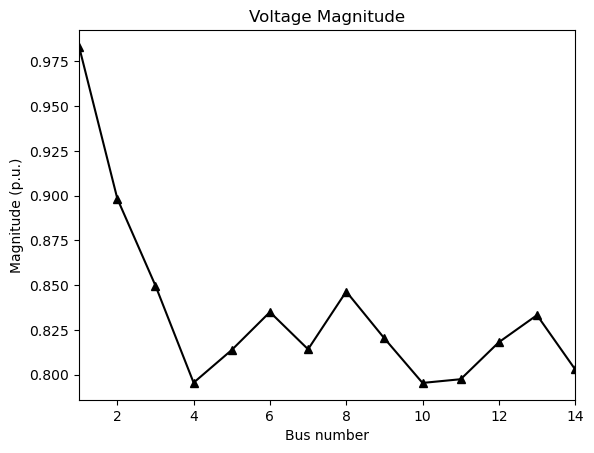

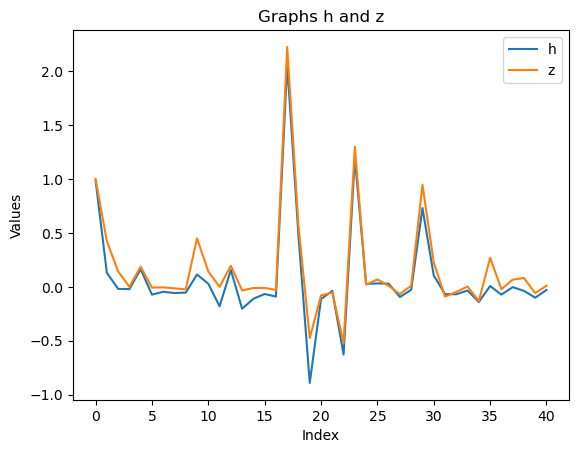

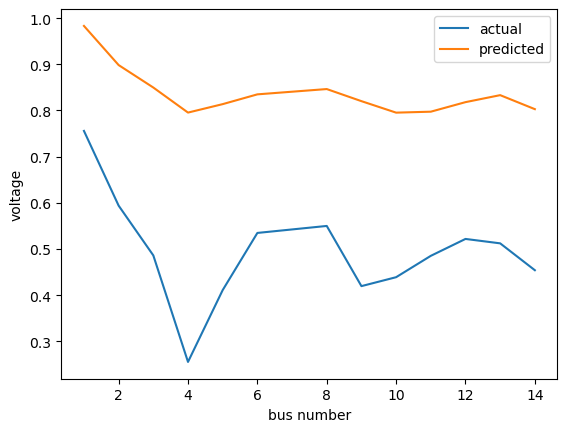

 repetition ------------->>>>>>>>>>>>>>>>> 1054
state 

 [0.98085542 0.89239113 0.84174062 0.78166481 0.80278685 0.82358416
 0.80130649 0.83483528 0.80734755 0.7827185  0.78542215 0.80651314
 0.82158197 0.79044361]


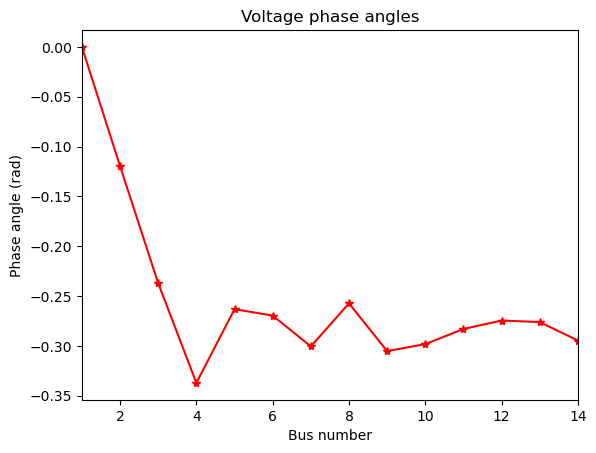

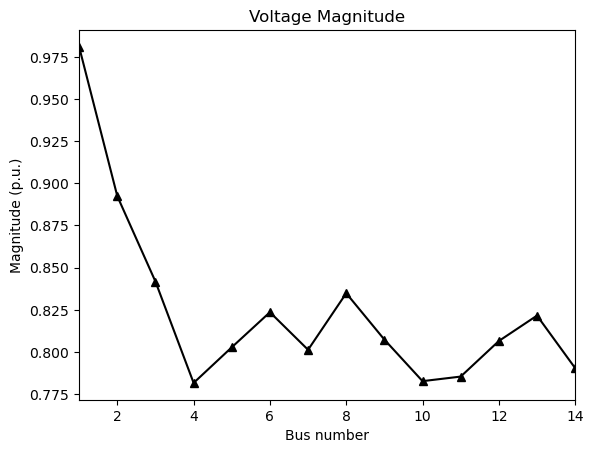

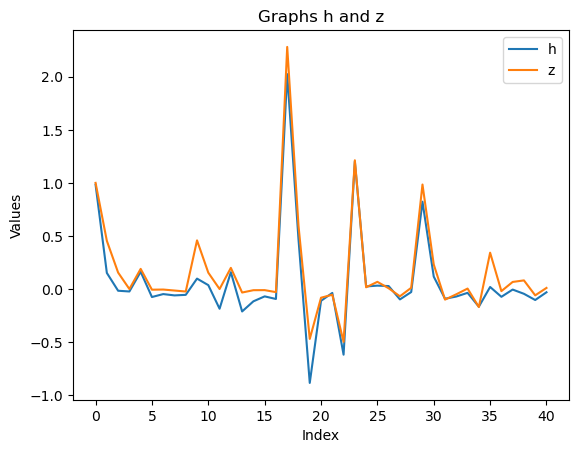

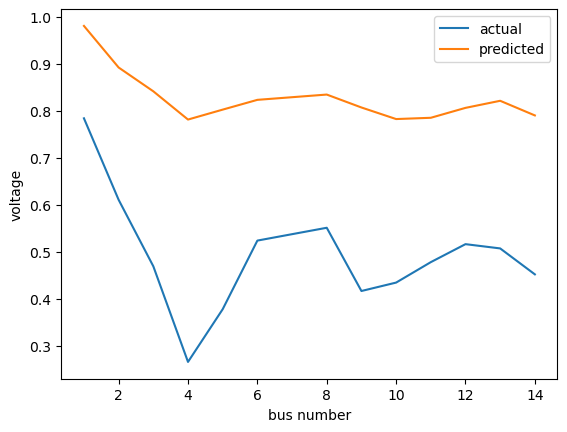

 repetition ------------->>>>>>>>>>>>>>>>> 1055
state 

 [0.98118346 0.89130262 0.84036566 0.77439929 0.79894465 0.81806002
 0.79481623 0.82955043 0.79940222 0.77689811 0.78087225 0.80151444
 0.81518356 0.78424473]


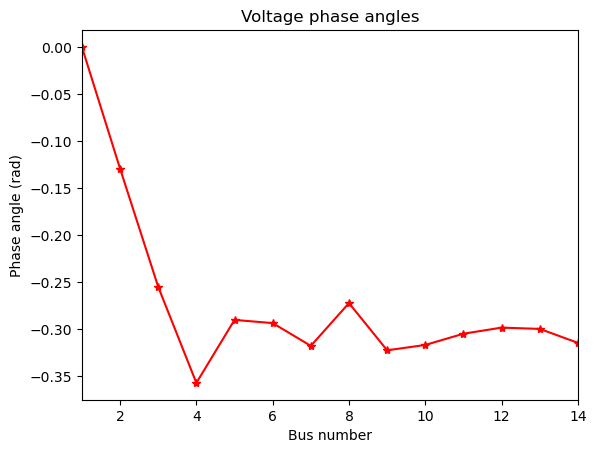

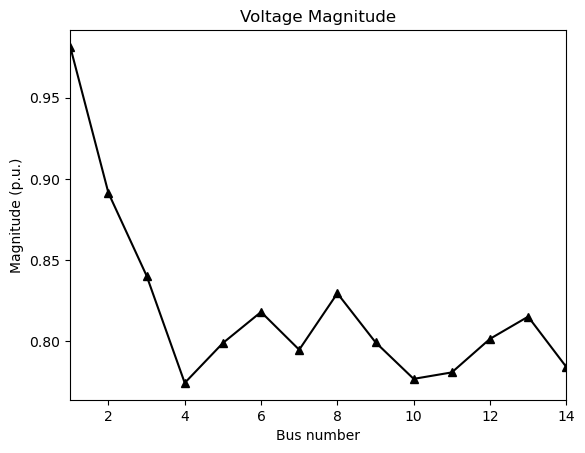

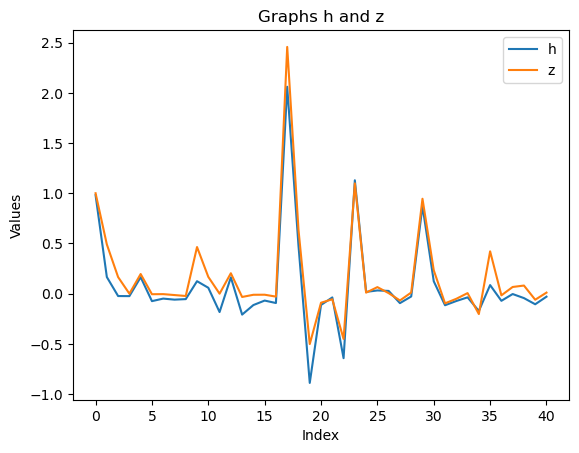

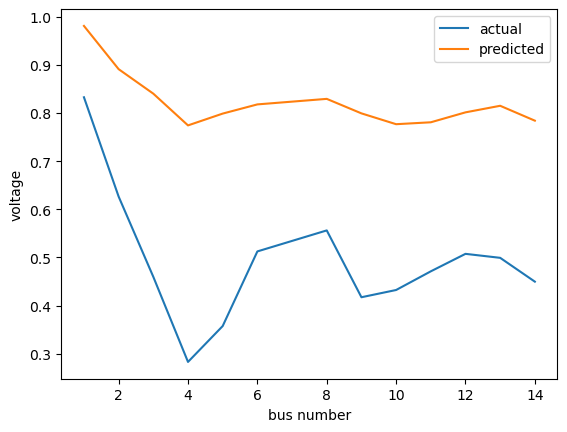

 repetition ------------->>>>>>>>>>>>>>>>> 1056
state 

 [0.98667217 0.89773315 0.84852824 0.77801334 0.80540088 0.8217573
 0.79879342 0.8343568  0.80077159 0.78164962 0.78701874 0.80631873
 0.81753601 0.78808408]


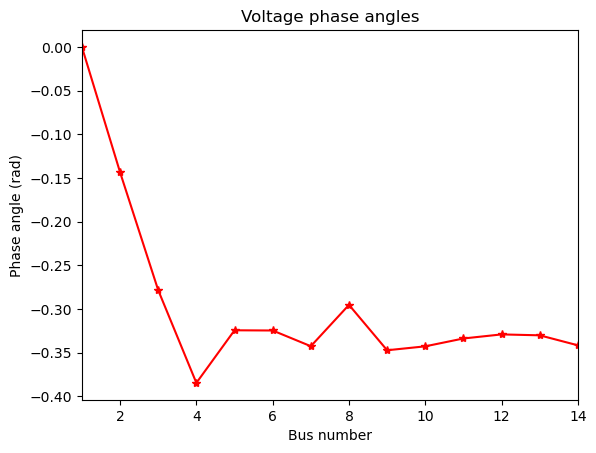

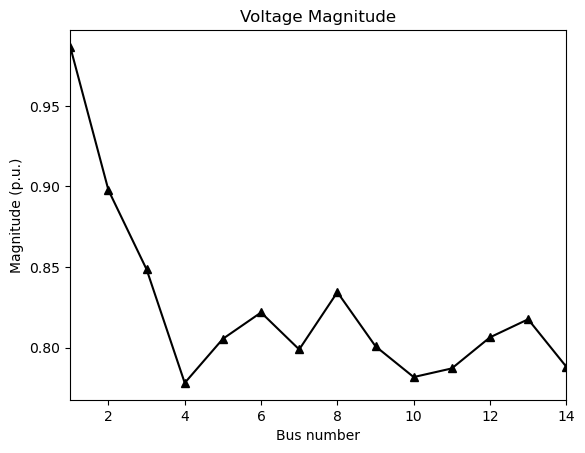

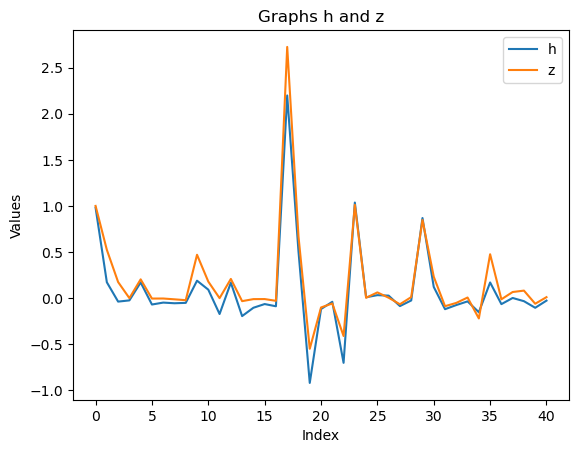

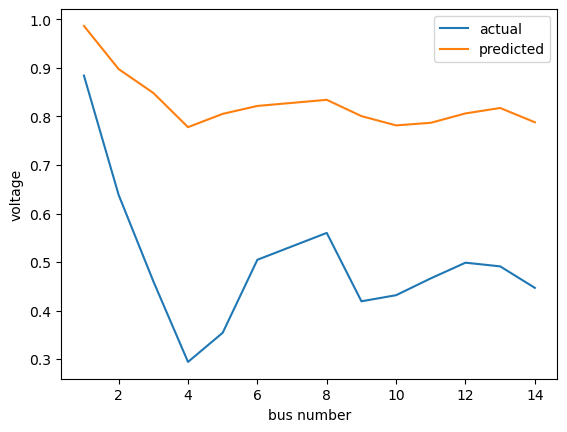

 repetition ------------->>>>>>>>>>>>>>>>> 1057
state 

 [0.99572291 0.90911377 0.86289823 0.7897818  0.81862969 0.83205396
 0.81058184 0.84655896 0.80979619 0.79391621 0.80020697 0.81780437
 0.82645828 0.79924985]


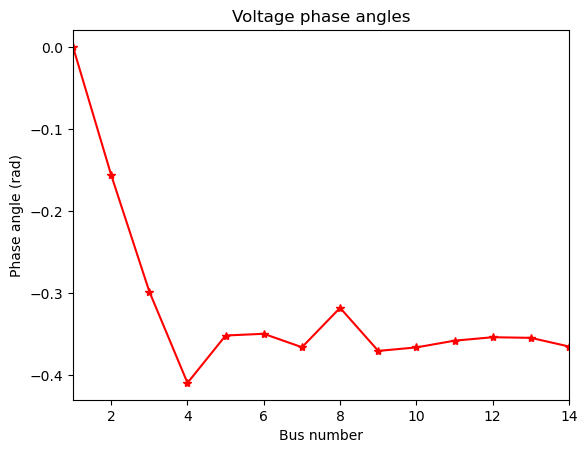

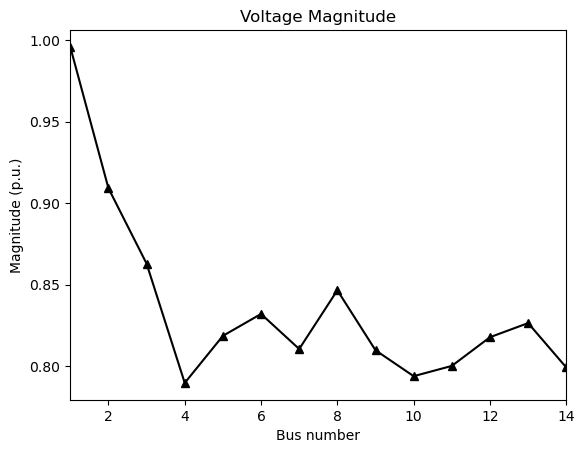

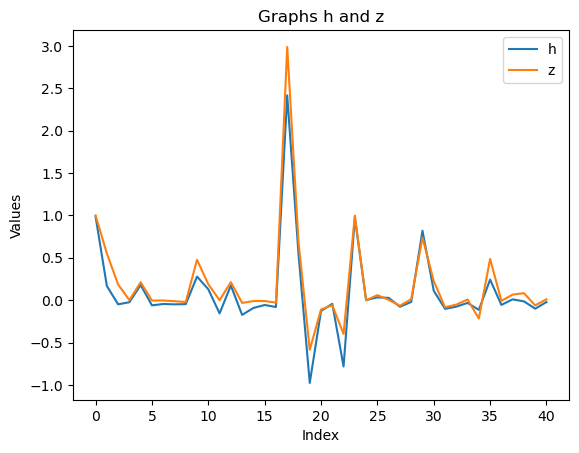

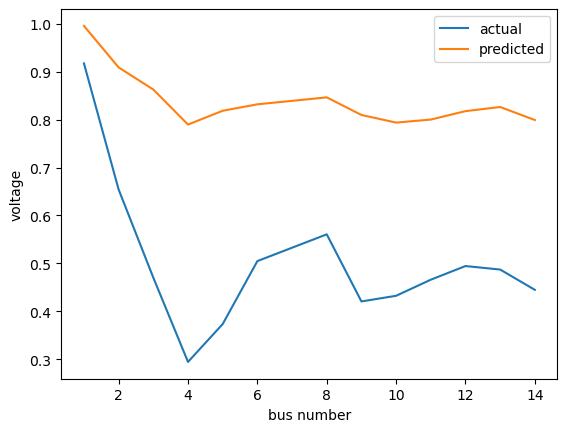

 repetition ------------->>>>>>>>>>>>>>>>> 1058
state 

 [0.99907186 0.91398472 0.87042191 0.79553787 0.82470415 0.8358315
 0.81633192 0.85290685 0.81329051 0.79957365 0.80619923 0.82233365
 0.82893841 0.80388865]


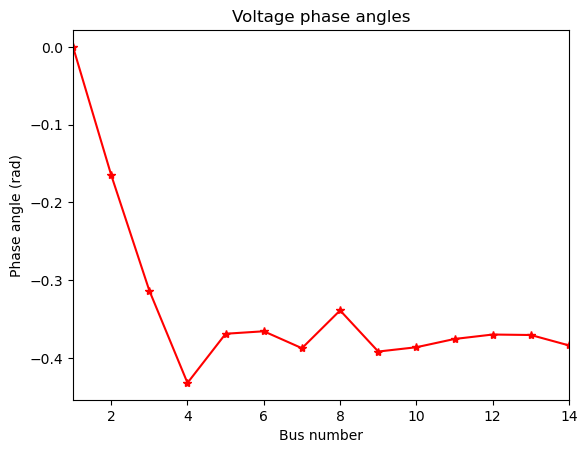

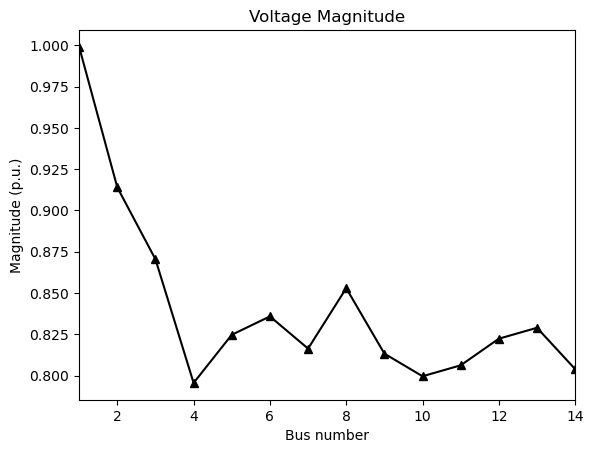

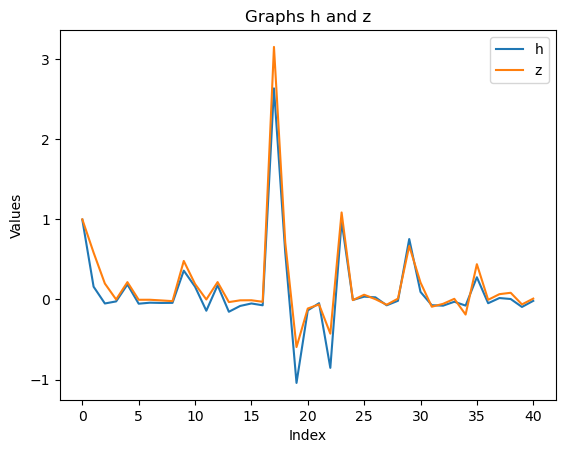

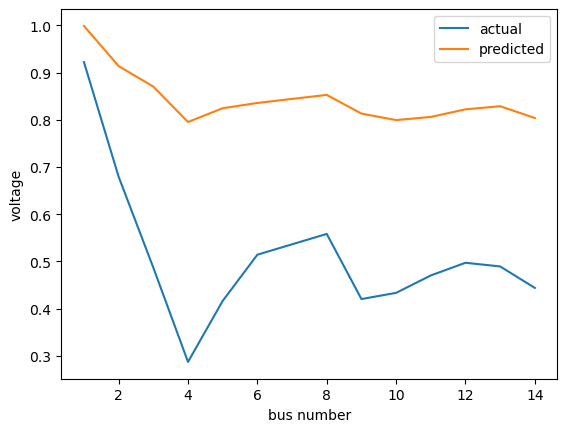

 repetition ------------->>>>>>>>>>>>>>>>> 1059
state 

 [0.98952936 0.90319593 0.86085516 0.78343948 0.81252939 0.82218299
 0.80443    0.8423897  0.7995199  0.78702131 0.79373025 0.80883249
 0.81378036 0.79038787]


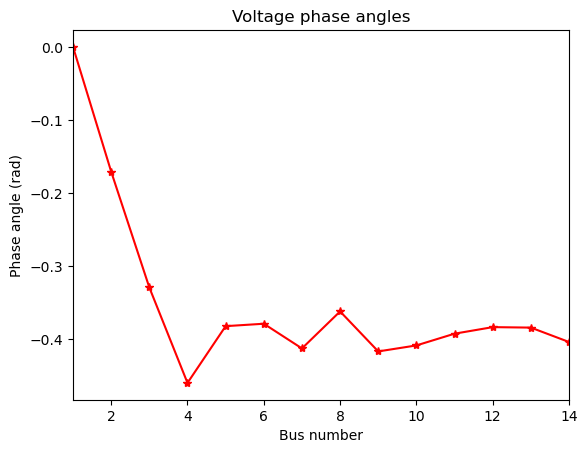

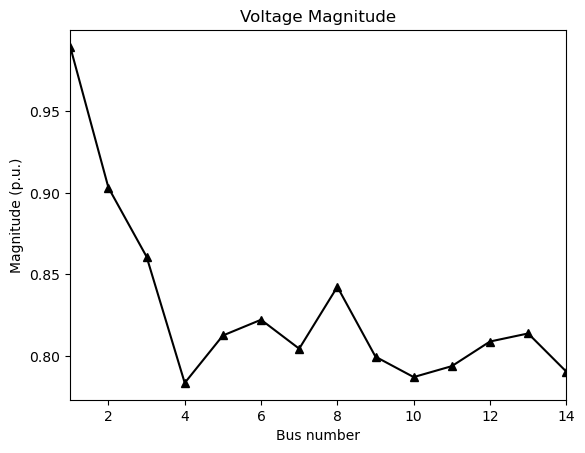

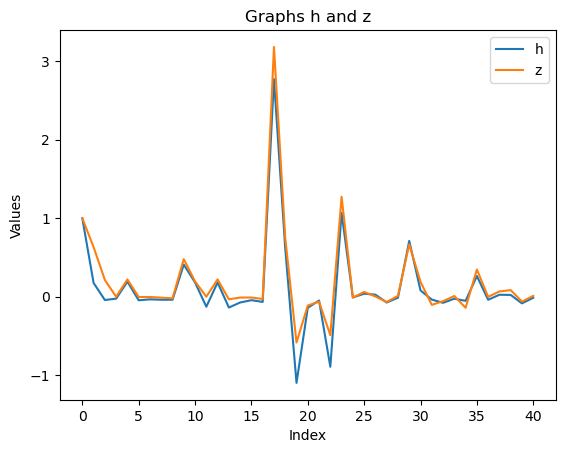

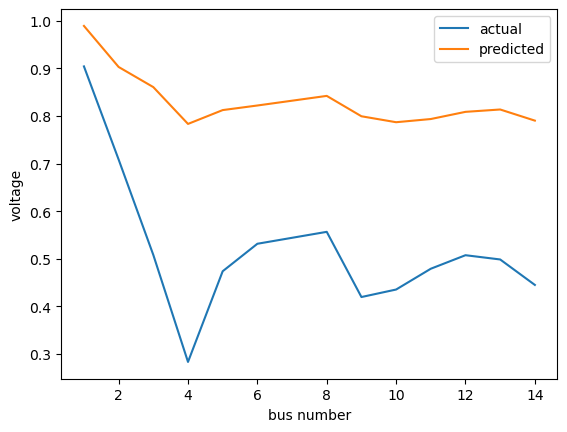

 repetition ------------->>>>>>>>>>>>>>>>> 1060
state 

 [0.97045447 0.87941125 0.83642496 0.75516315 0.78428879 0.79323989
 0.77655301 0.81674917 0.77000448 0.75808541 0.76491131 0.77947677
 0.78300691 0.76057627]


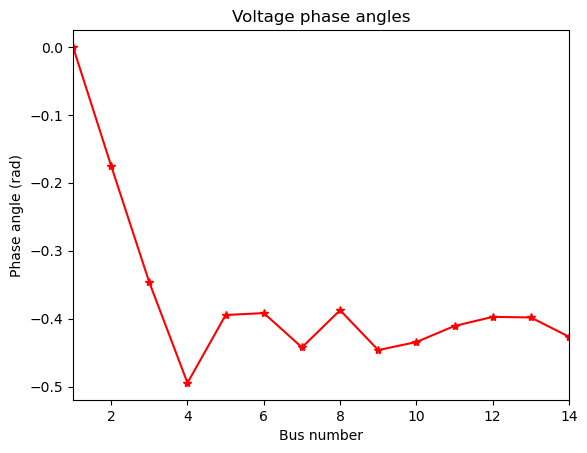

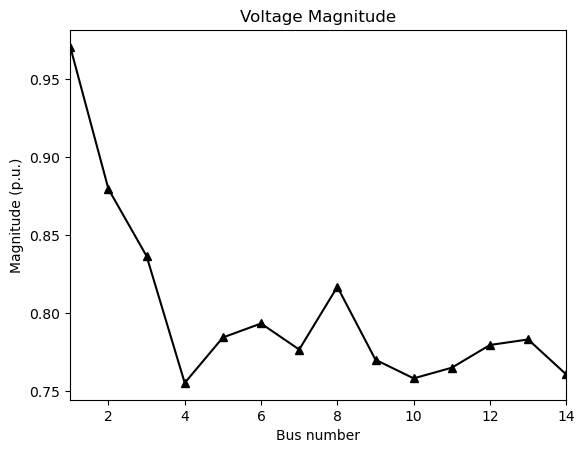

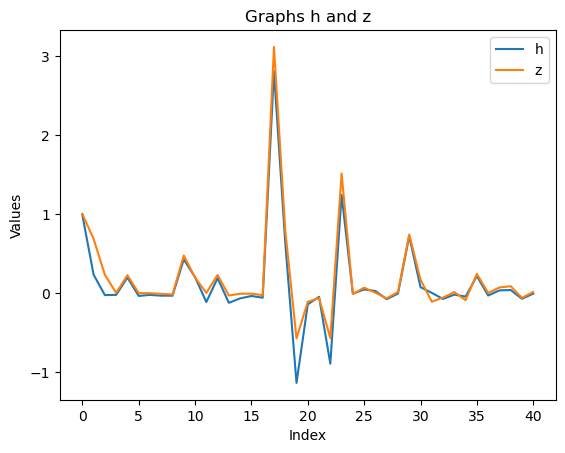

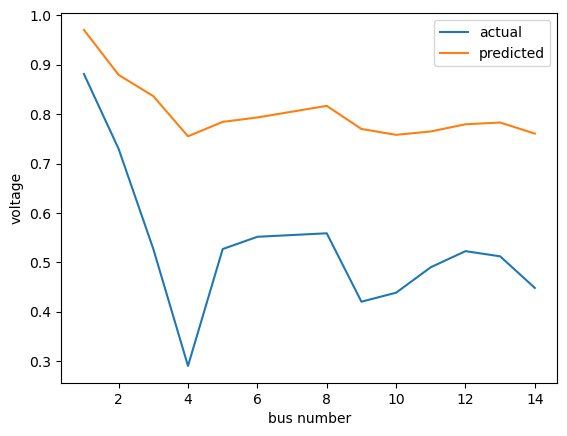

 repetition ------------->>>>>>>>>>>>>>>>> 1061
state 

 [0.95188389 0.85385182 0.80848049 0.72231098 0.75217017 0.76074336
 0.74415095 0.78707964 0.73579194 0.72458814 0.73197697 0.74631044
 0.74824257 0.72618978]


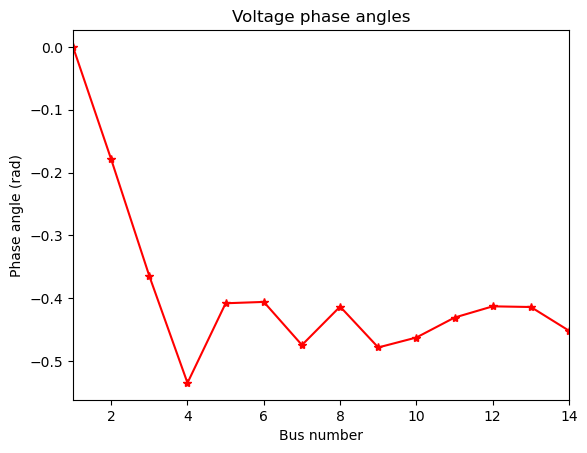

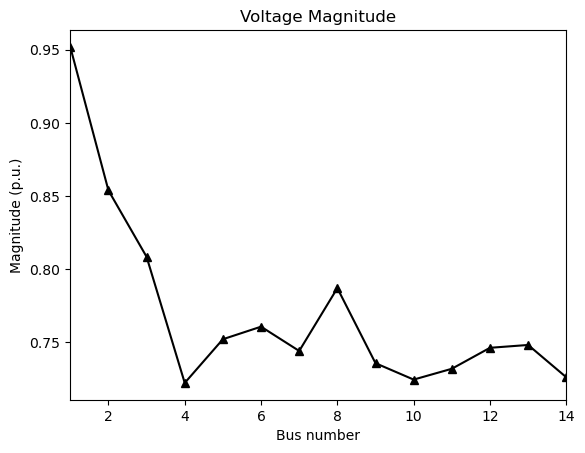

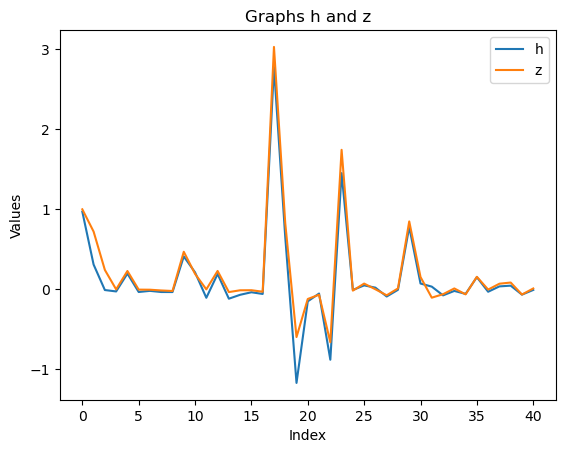

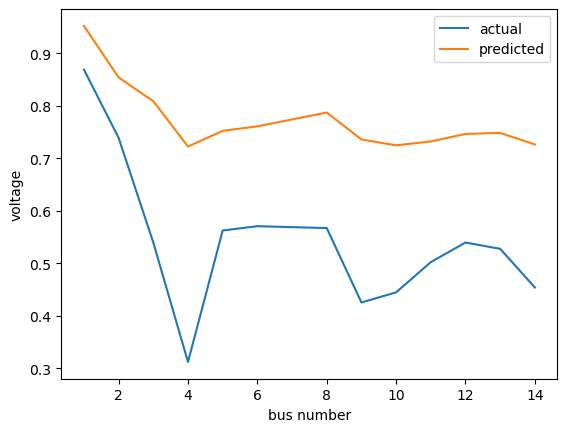

 repetition ------------->>>>>>>>>>>>>>>>> 1062
state 

 [0.94176026 0.83713038 0.78856136 0.69697464 0.72888978 0.73672564
 0.71908813 0.76467078 0.70813593 0.69896141 0.70789525 0.72186914
 0.72138406 0.69950396]


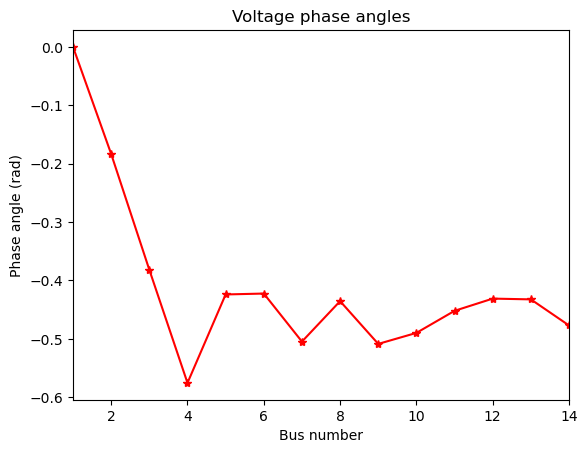

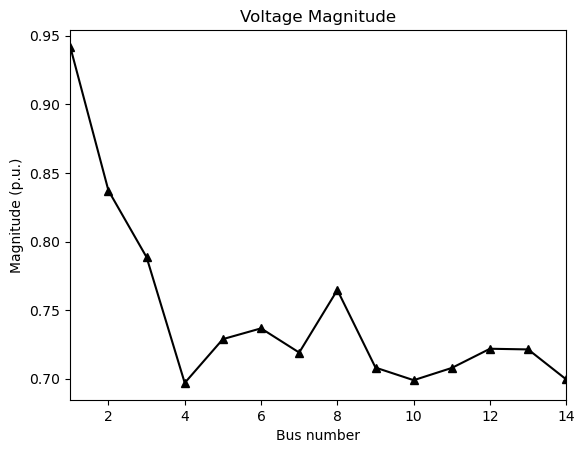

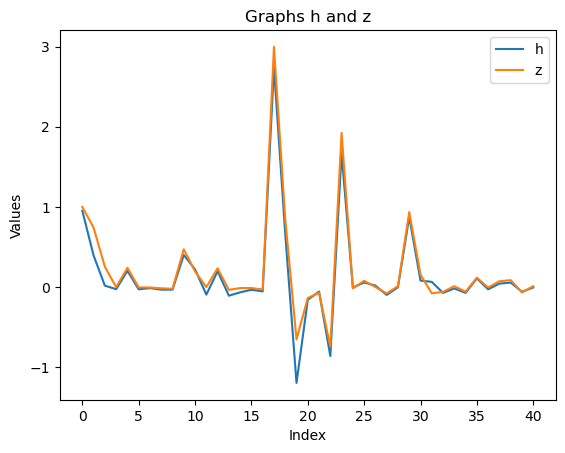

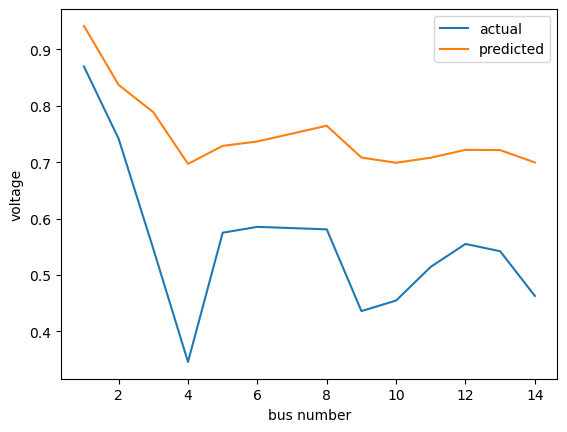

 repetition ------------->>>>>>>>>>>>>>>>> 1063
state 

 [0.93958419 0.83052553 0.7789507  0.68155343 0.71709382 0.72365349
 0.70372468 0.75159954 0.68929683 0.68387183 0.69553621 0.70888024
 0.70508444 0.6832429 ]


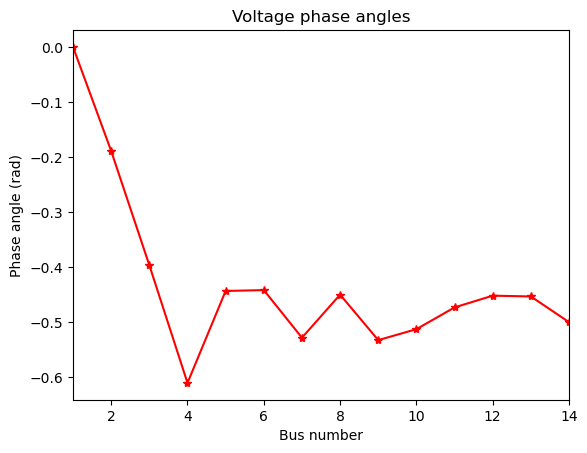

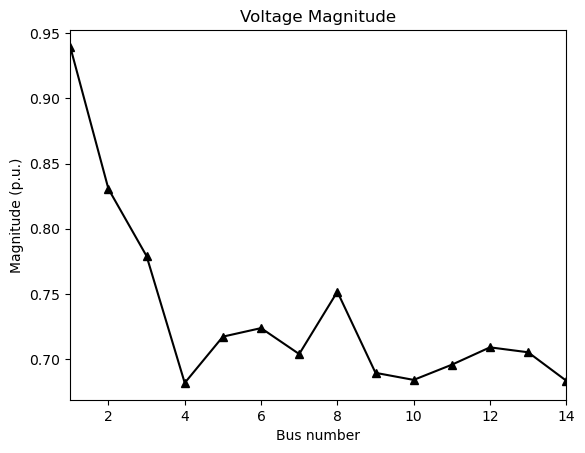

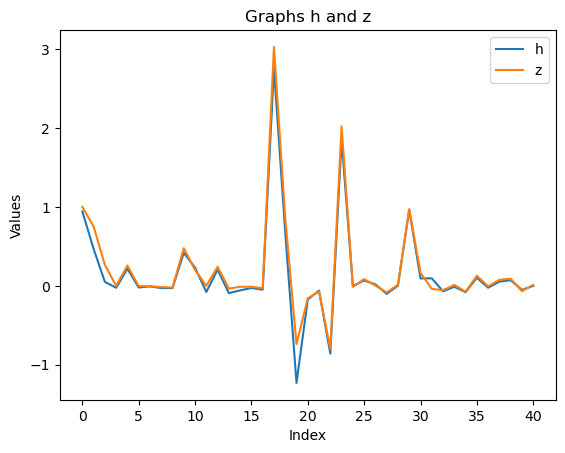

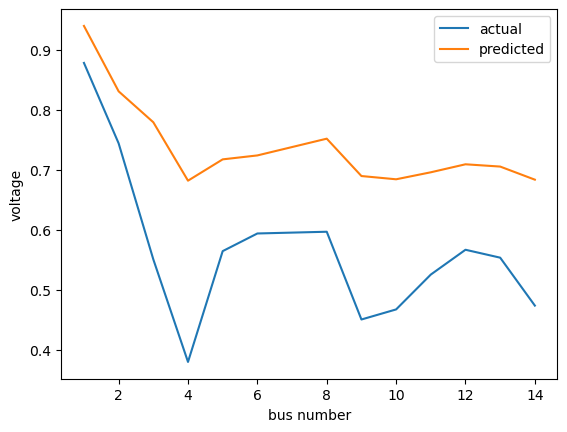

 repetition ------------->>>>>>>>>>>>>>>>> 1064
state 

 [0.94068906 0.82930987 0.77537182 0.67152464 0.71183145 0.71700507
 0.69377845 0.74367574 0.67563296 0.67477885 0.68989349 0.70264987
 0.6953569  0.6731205 ]


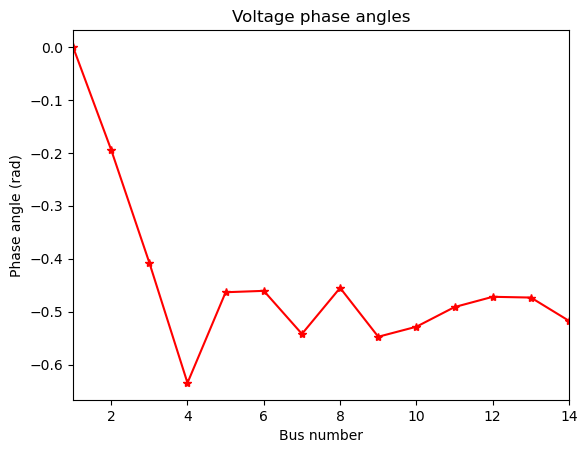

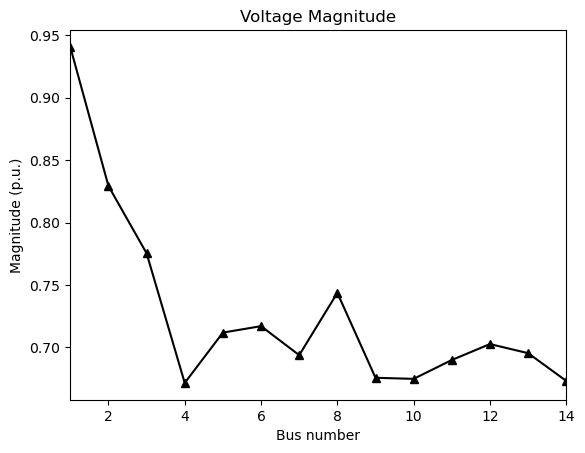

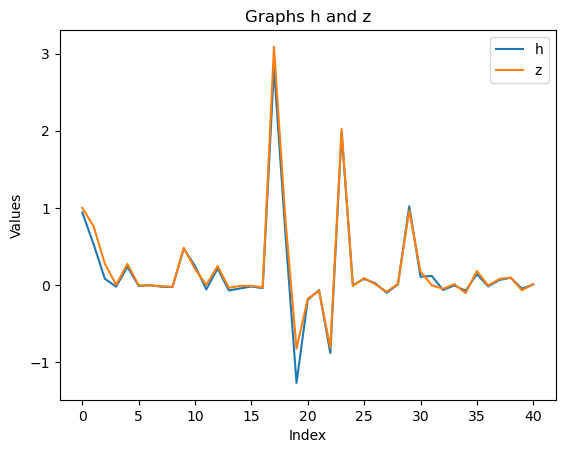

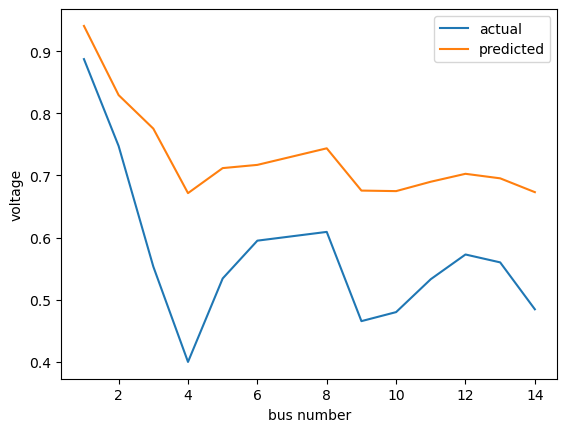

 repetition ------------->>>>>>>>>>>>>>>>> 1065
state 

 [0.94325854 0.83130292 0.77590268 0.66539217 0.71081198 0.71497033
 0.68807868 0.73967295 0.66707704 0.67003666 0.6883818  0.70104468
 0.69117638 0.667821  ]


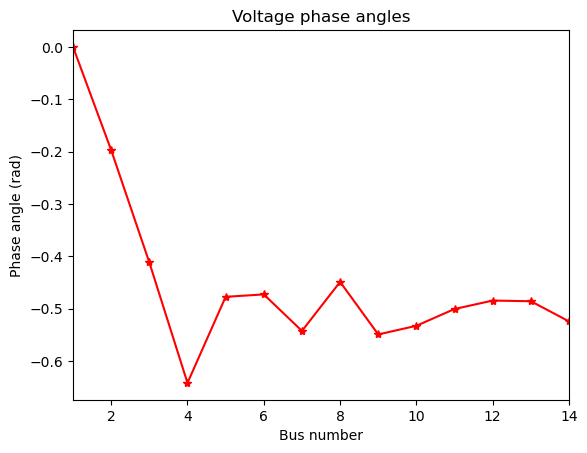

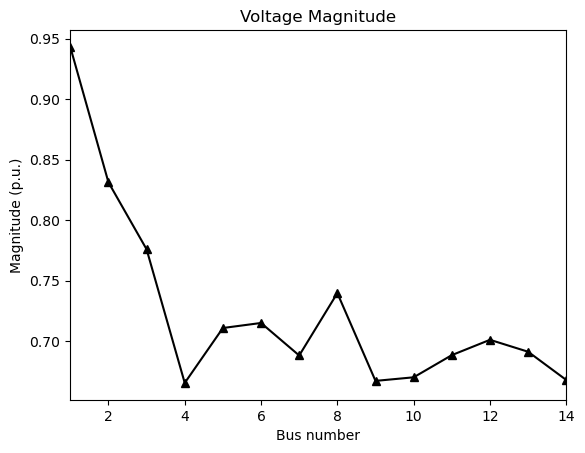

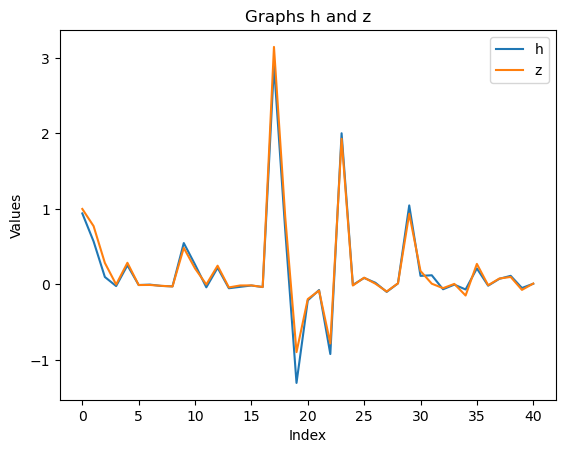

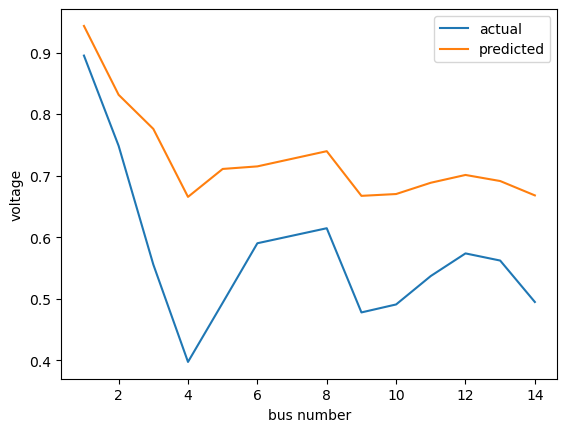

 repetition ------------->>>>>>>>>>>>>>>>> 1066
state 

 [0.94753265 0.83639772 0.78041962 0.6639871  0.71417225 0.71779394
 0.68771737 0.74052083 0.6655953  0.67037222 0.69083457 0.70409222
 0.6933765  0.66826062]


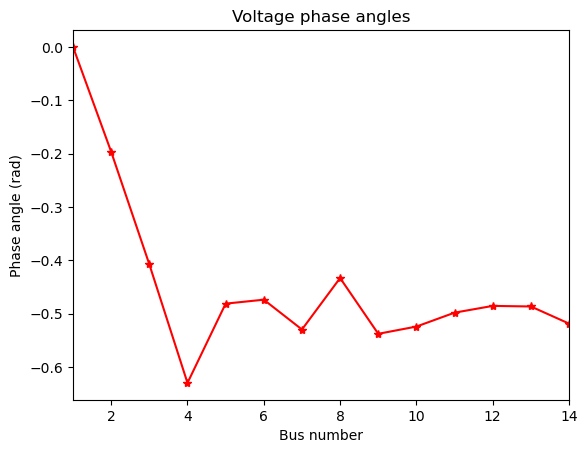

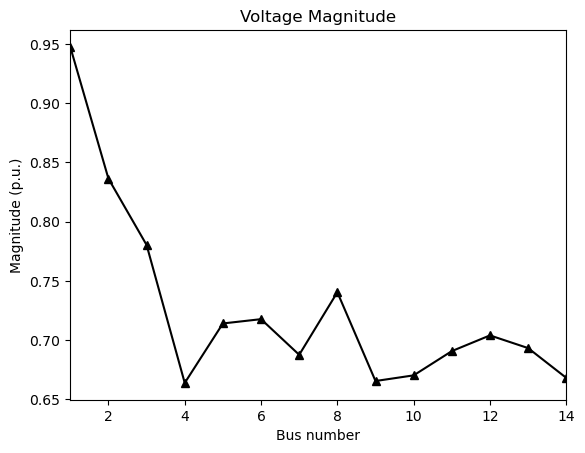

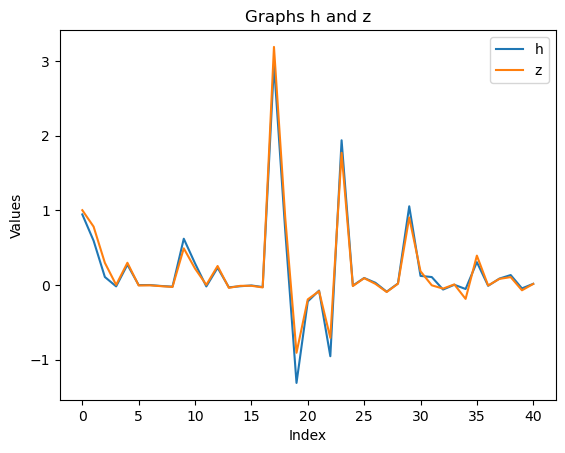

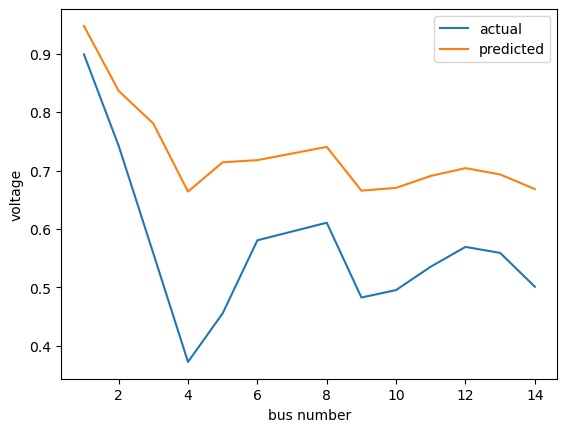

 repetition ------------->>>>>>>>>>>>>>>>> 1067
state 

 [0.95297777 0.84286448 0.78637455 0.66533482 0.71947436 0.72261279
 0.69074176 0.74441315 0.66901044 0.67364889 0.69477962 0.70893366
 0.69880337 0.67202811]


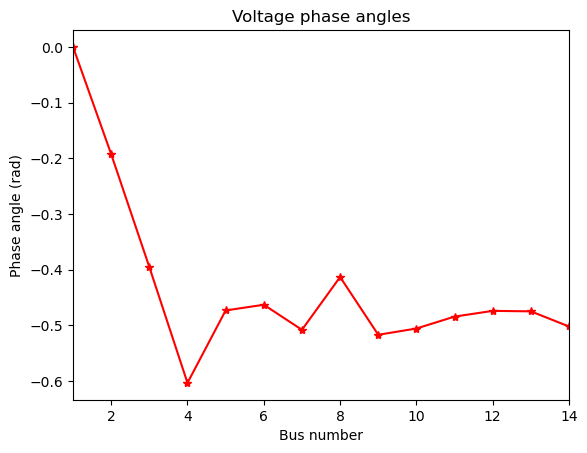

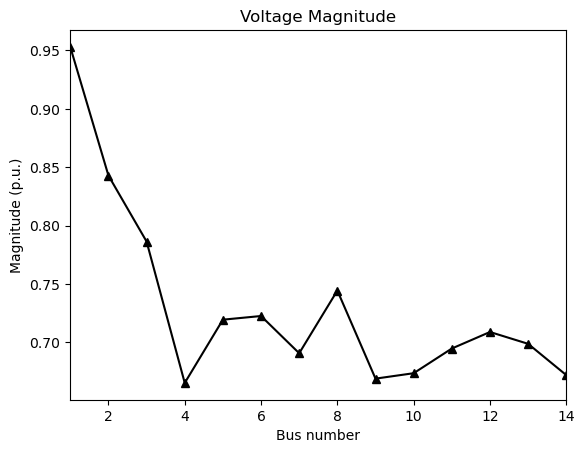

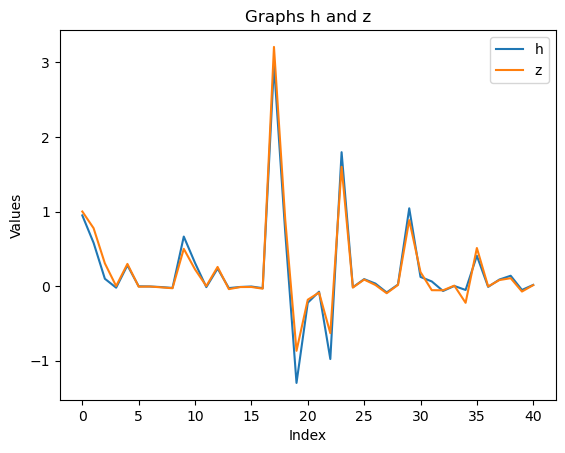

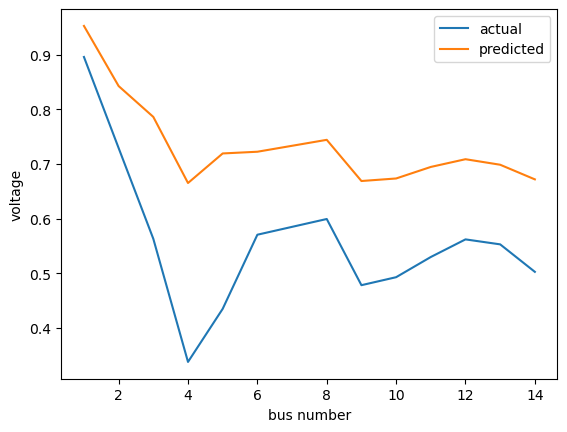

 repetition ------------->>>>>>>>>>>>>>>>> 1068
state 

 [0.95547307 0.8444541  0.78609302 0.66101605 0.71835905 0.72047879
 0.68854278 0.7432891  0.66743621 0.67130951 0.69213697 0.70674847
 0.69729313 0.66990446]


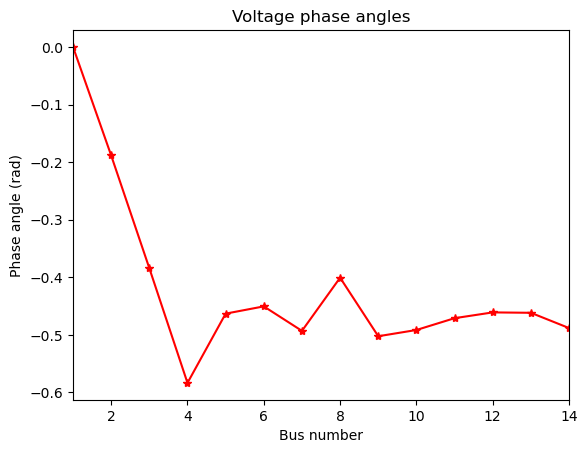

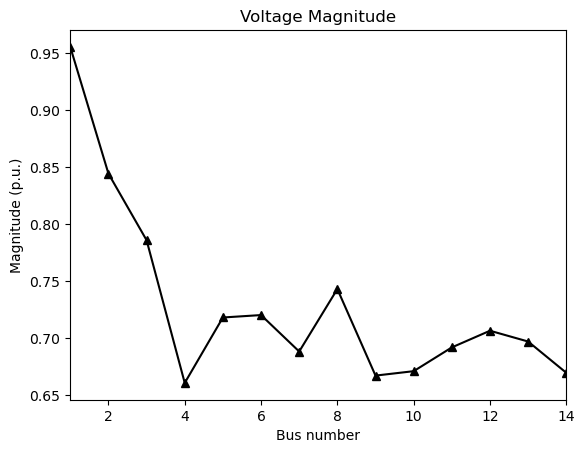

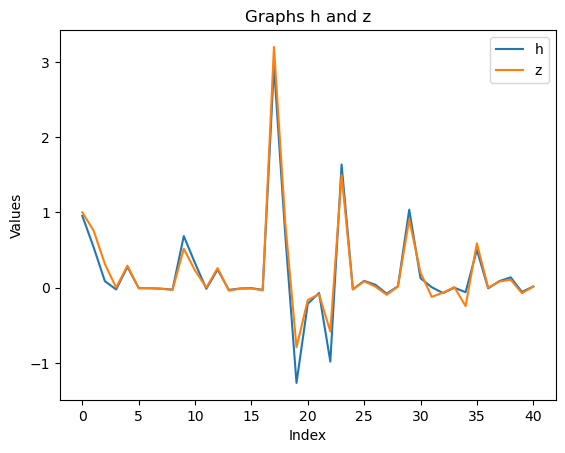

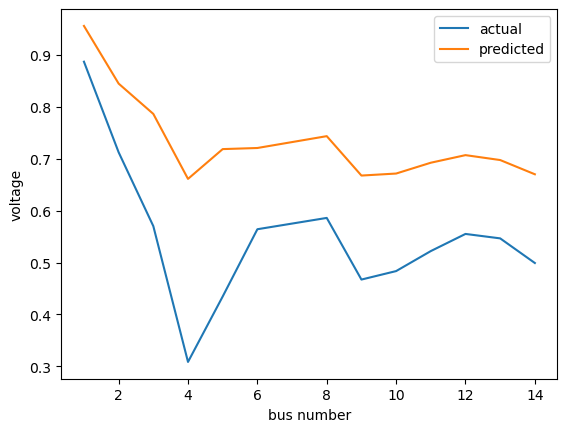

 repetition ------------->>>>>>>>>>>>>>>>> 1069
state 

 [0.94979959 0.83448097 0.77210619 0.64219137 0.70236377 0.70283484
 0.67205431 0.72893832 0.65066574 0.65429483 0.67462666 0.68898661
 0.67928947 0.65244733]


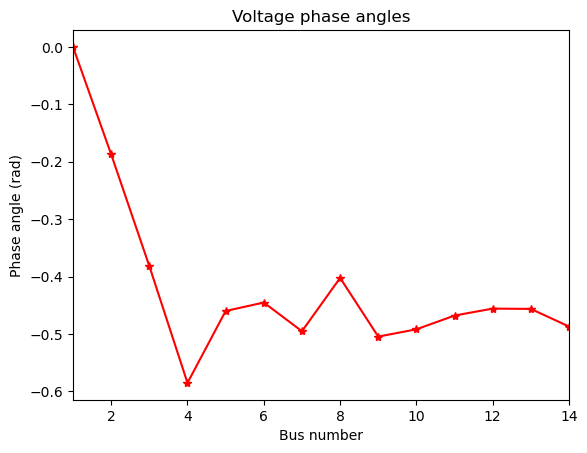

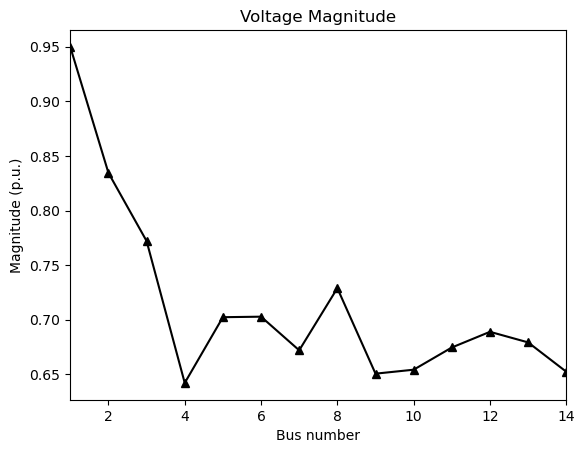

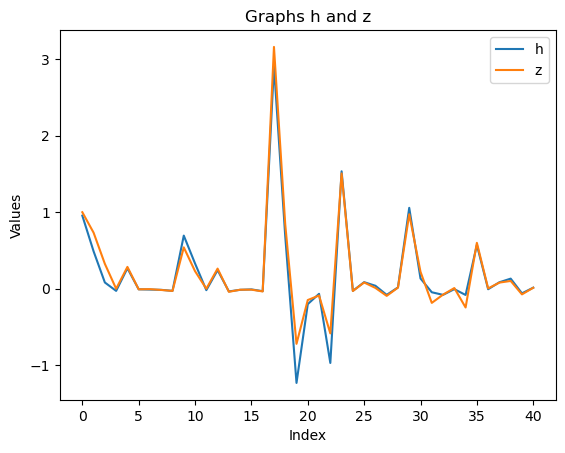

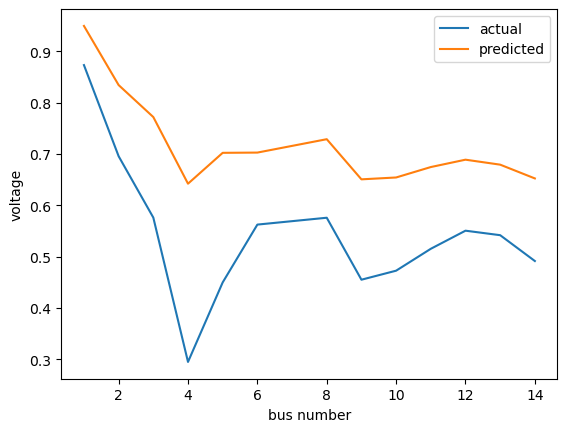

 repetition ------------->>>>>>>>>>>>>>>>> 1070
state 

 [0.93756152 0.8151241  0.74723361 0.61163752 0.67416719 0.67275952
 0.64365897 0.70382274 0.62102026 0.62497941 0.64494628 0.6586491
 0.64784301 0.62224292]


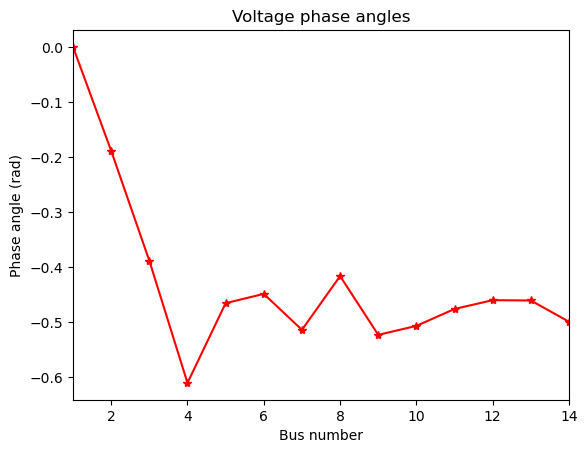

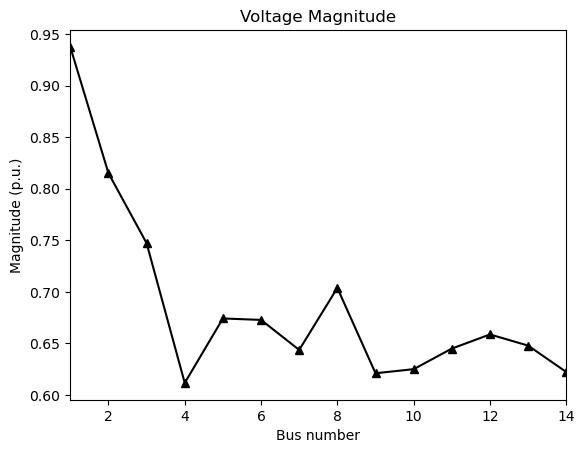

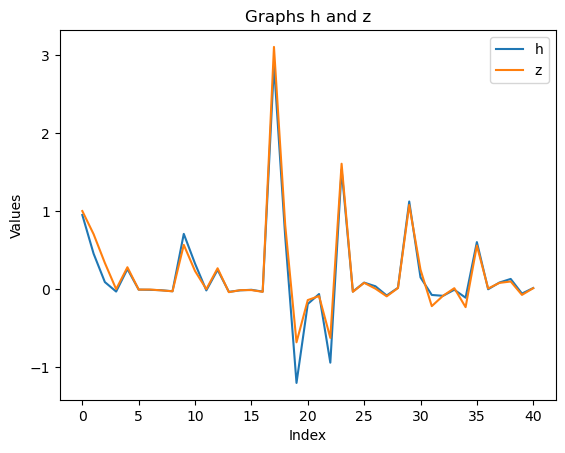

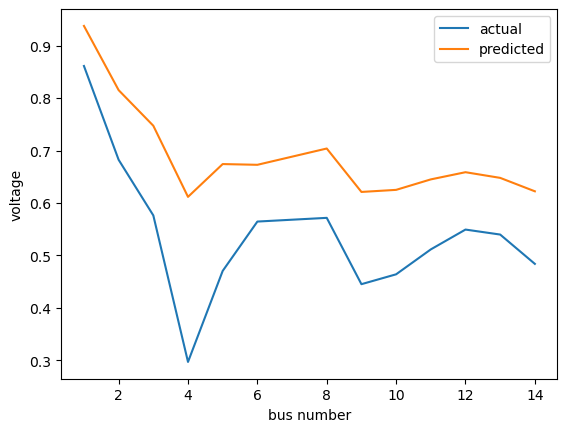

 repetition ------------->>>>>>>>>>>>>>>>> 1071
state 

 [0.92591887 0.79556616 0.72222287 0.58146462 0.64539693 0.64244311
 0.61485955 0.67838492 0.59084216 0.59509732 0.61475299 0.62788517
 0.61583117 0.59146484]


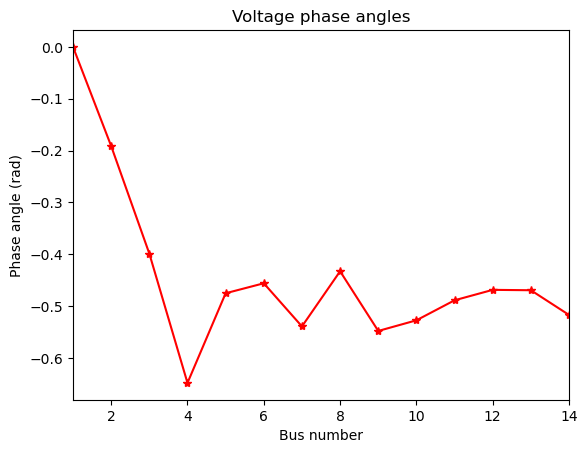

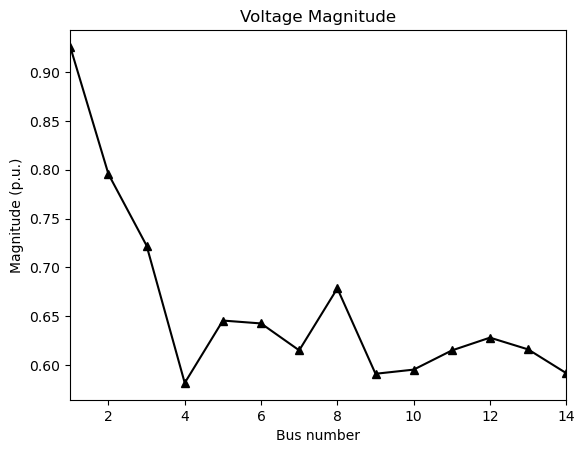

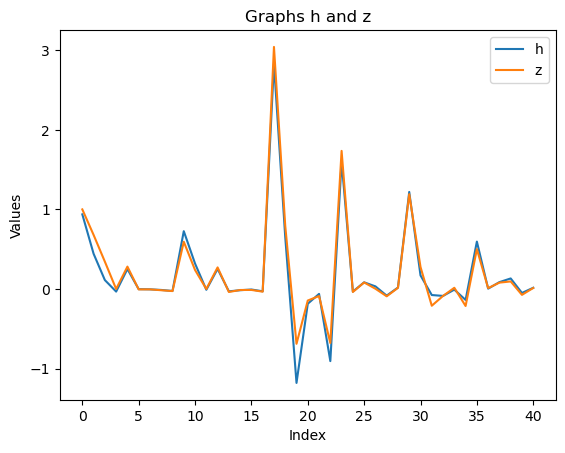

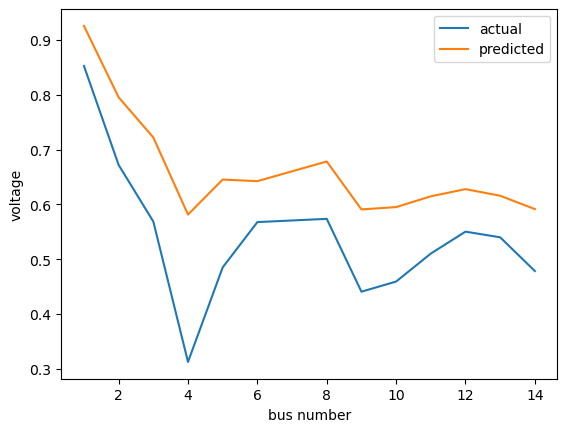

 repetition ------------->>>>>>>>>>>>>>>>> 1072
state 

 [0.91914904 0.78201906 0.70460664 0.56024597 0.6246857  0.62105489
 0.59396574 0.66005832 0.56946554 0.57328314 0.59263757 0.60584435
 0.59336663 0.56934923]


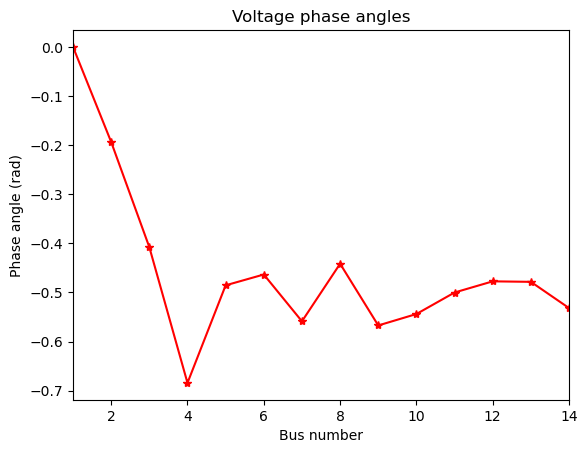

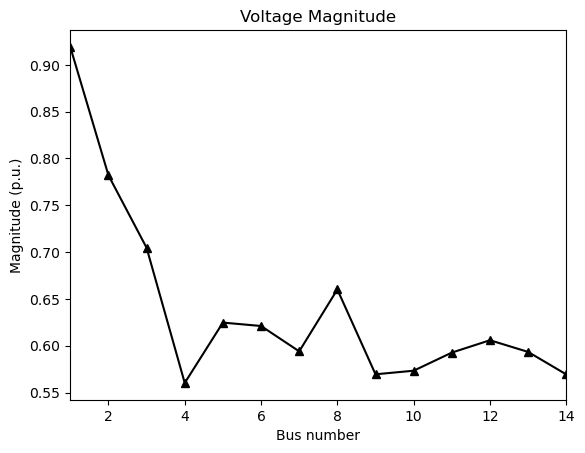

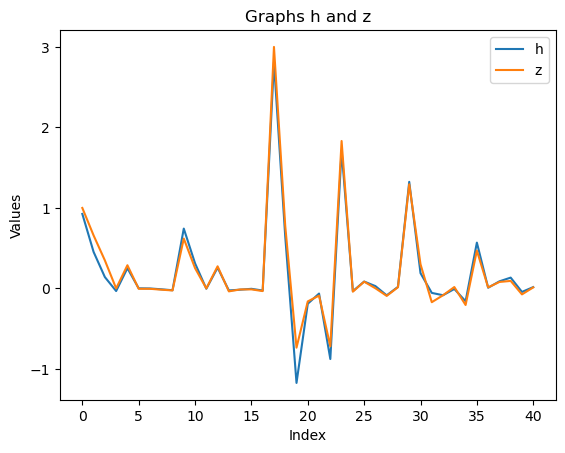

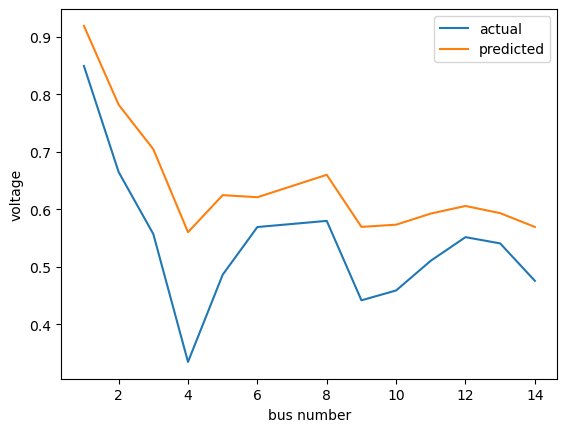

 repetition ------------->>>>>>>>>>>>>>>>> 1073
state 

 [0.91571978 0.77342651 0.69329585 0.54529909 0.61093357 0.6071793
 0.57890264 0.6469292  0.55450298 0.55782672 0.57743945 0.59131987
 0.57896001 0.55416898]


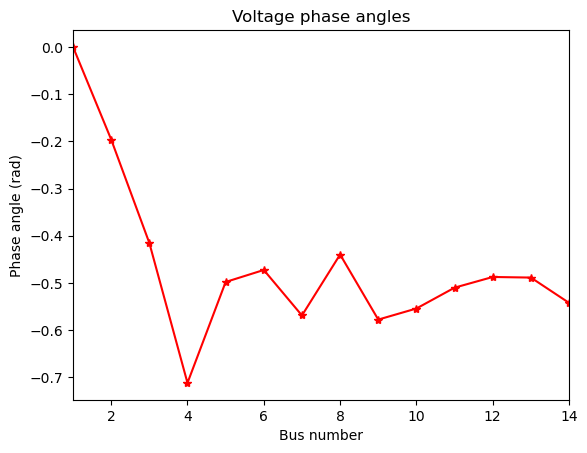

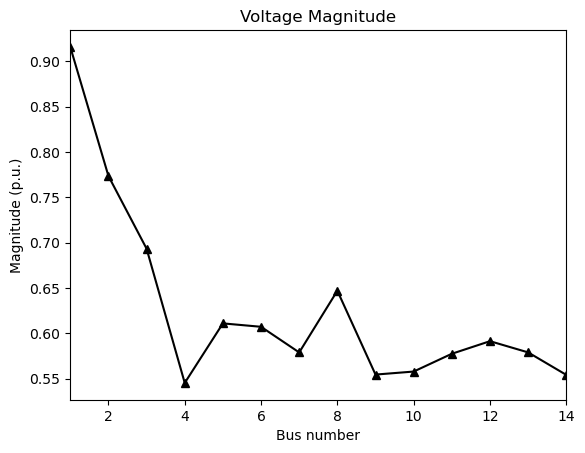

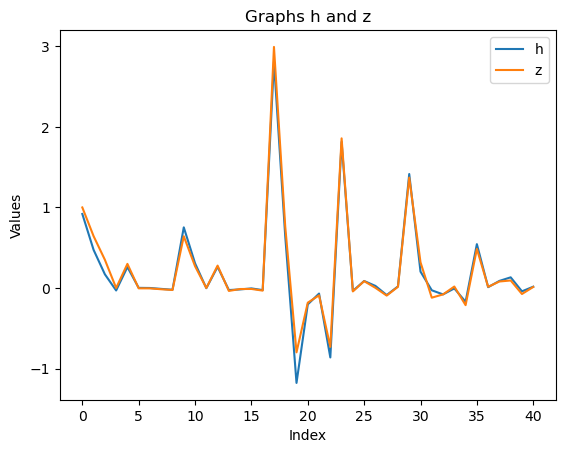

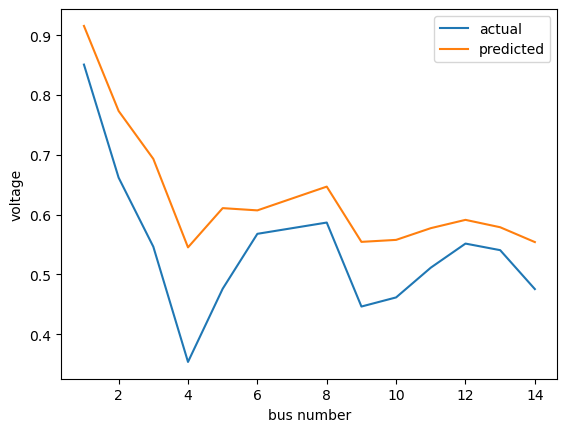

 repetition ------------->>>>>>>>>>>>>>>>> 1074
state 

 [0.91432383 0.76826477 0.68627659 0.53254708 0.60137733 0.59697904
 0.56642893 0.63638231 0.54137027 0.54561958 0.56652176 0.58088265
 0.56790782 0.54213279]


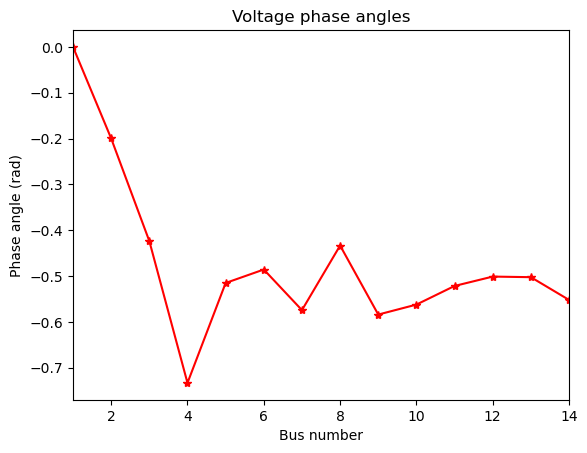

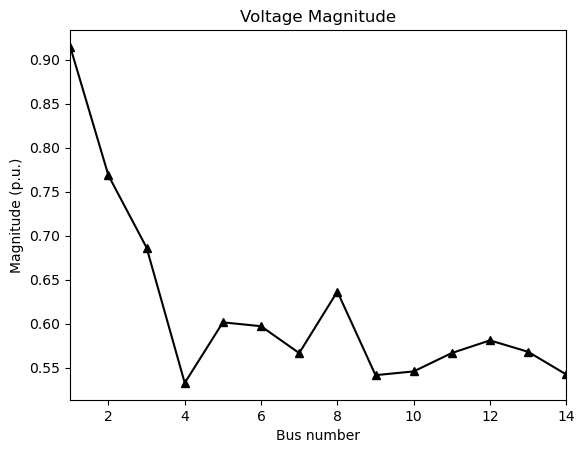

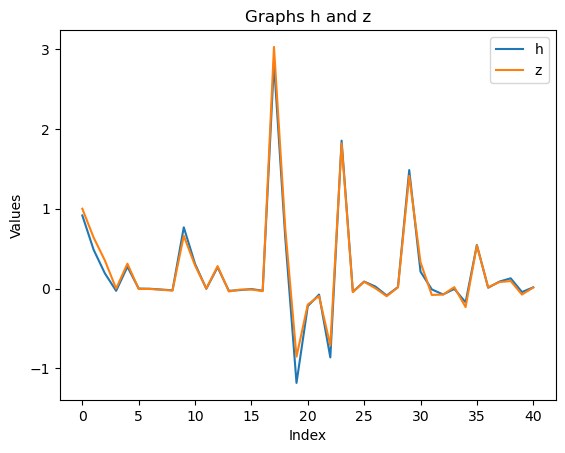

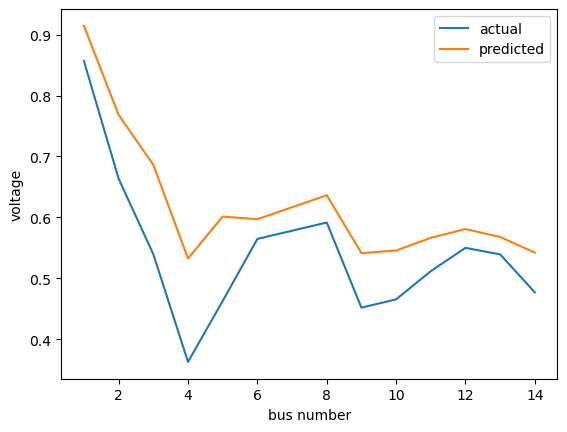

 repetition ------------->>>>>>>>>>>>>>>>> 1075
state 

 [0.916822   0.76871536 0.68617838 0.52571191 0.5986072  0.5927531
 0.56036774 0.63192391 0.53394936 0.54017826 0.56266277 0.57692289
 0.56266823 0.53652346]


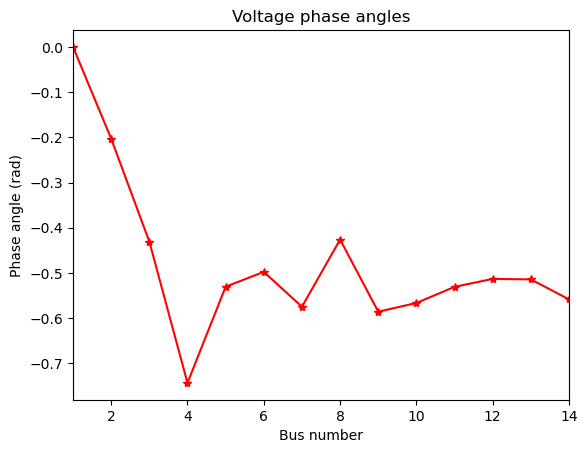

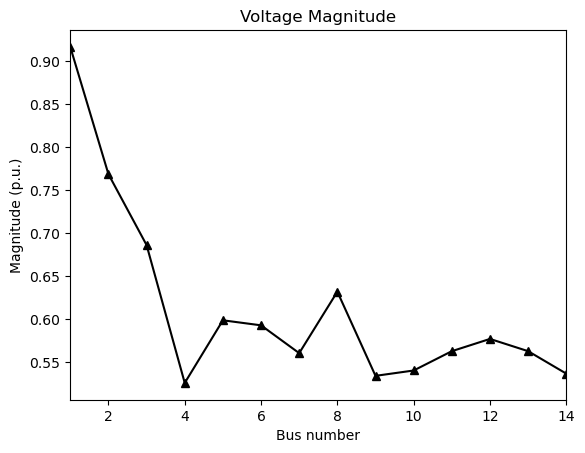

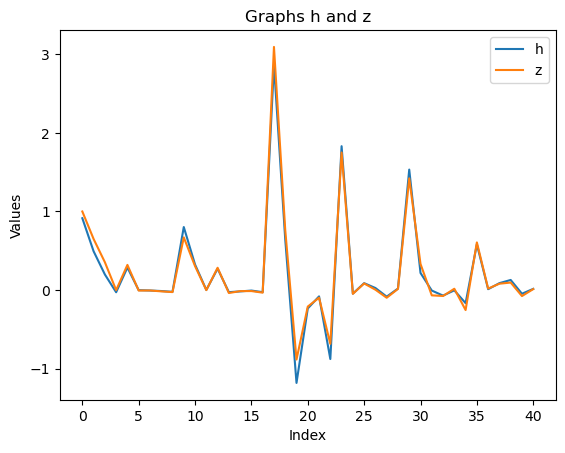

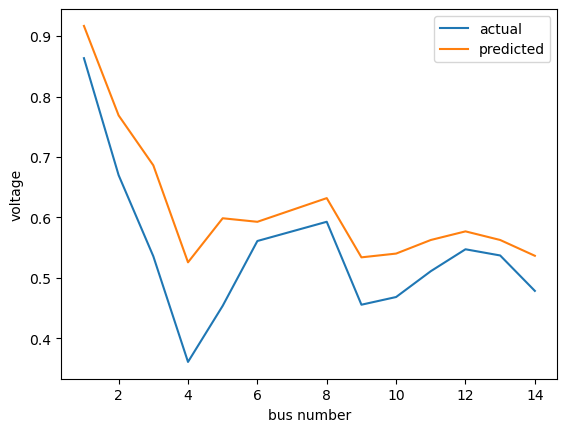

 repetition ------------->>>>>>>>>>>>>>>>> 1076
state 

 [0.92370047 0.77531403 0.69400407 0.52842745 0.60403704 0.59647563
 0.56401969 0.63632467 0.53661471 0.54424066 0.5673784  0.5811248
 0.56597531 0.54030389]


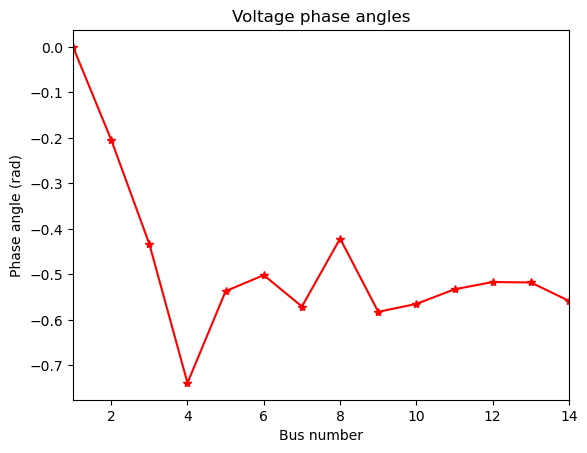

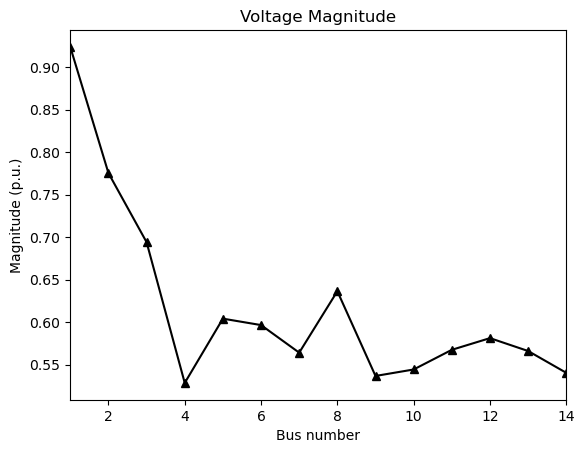

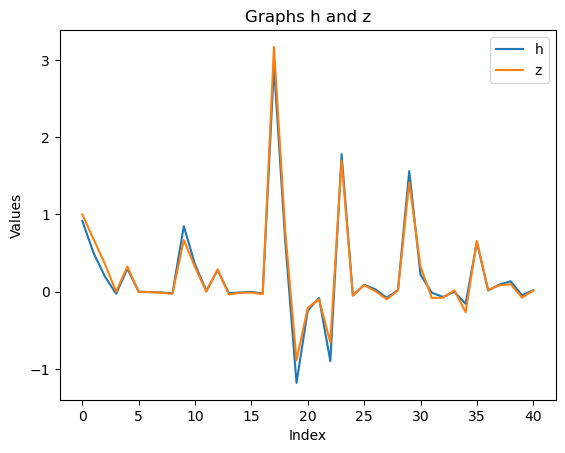

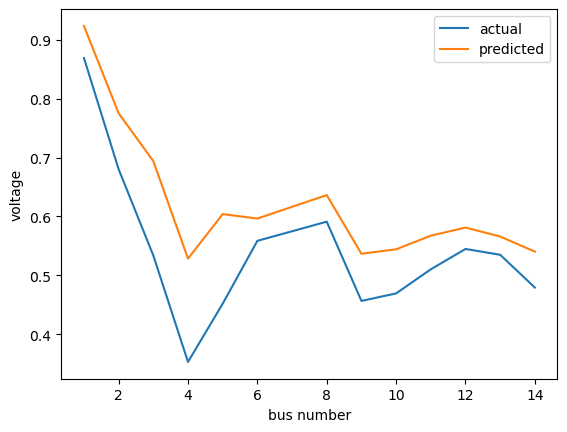

 repetition ------------->>>>>>>>>>>>>>>>> 1077
state 

 [0.93152055 0.78355362 0.70454041 0.53557751 0.61217447 0.60273974
 0.57209889 0.64479278 0.54377156 0.55231838 0.57519739 0.58793267
 0.57195481 0.54781334]


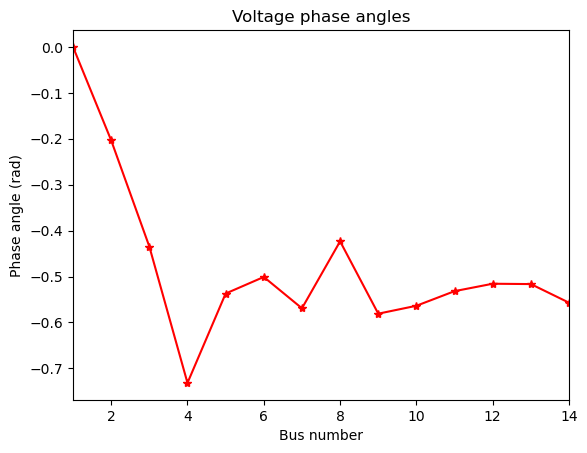

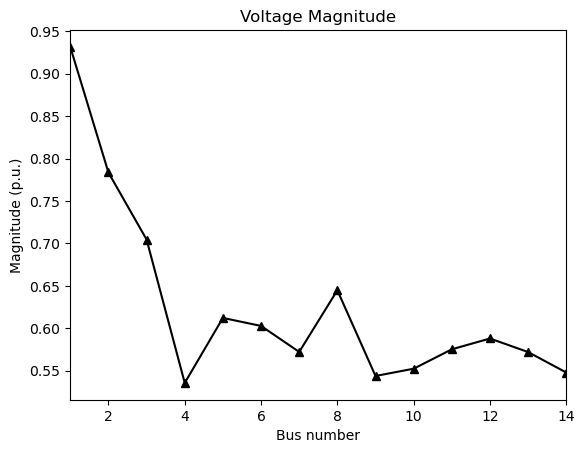

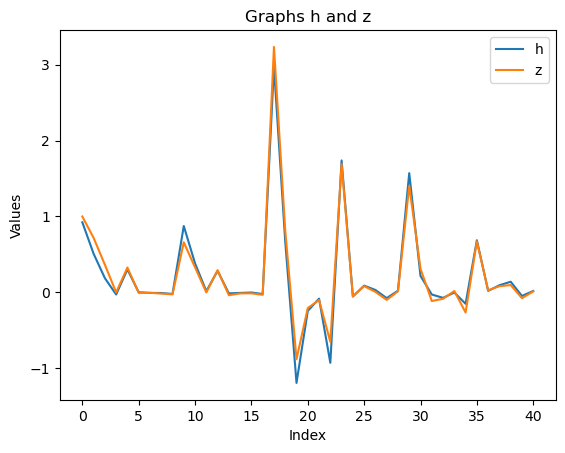

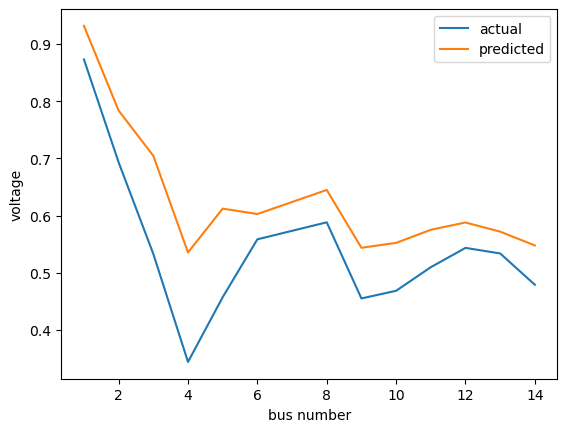

 repetition ------------->>>>>>>>>>>>>>>>> 1078
state 

 [0.93607898 0.78805433 0.71129959 0.53897988 0.61592913 0.60405414
 0.5765141  0.65019407 0.54617515 0.55648441 0.5790252  0.58991795
 0.57203839 0.55068713]


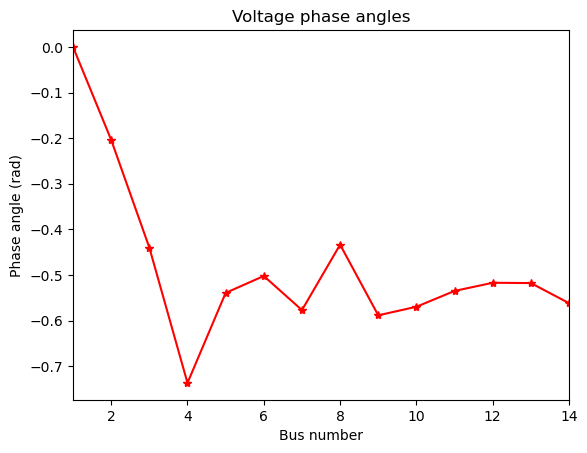

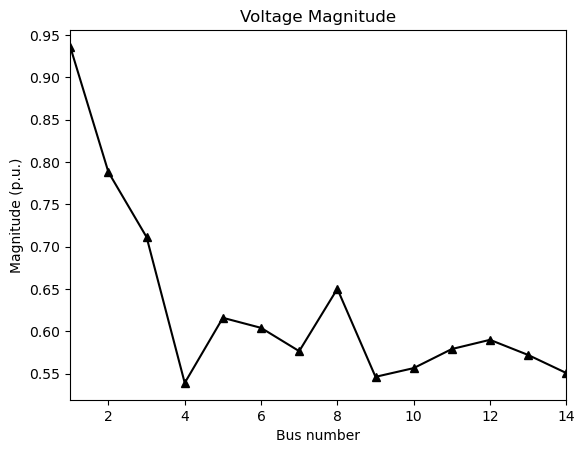

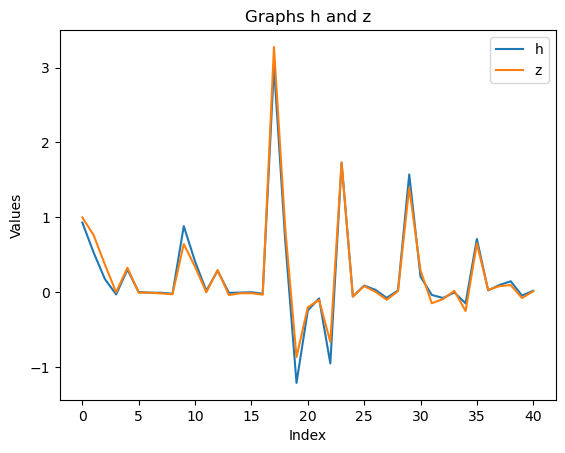

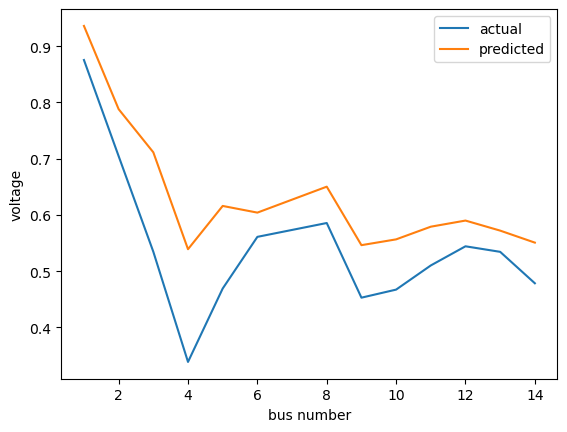

 repetition ------------->>>>>>>>>>>>>>>>> 1079
state 

 [0.93653784 0.78781138 0.71271967 0.53687907 0.61402376 0.59926195
 0.57541182 0.65077621 0.54195347 0.55501428 0.57746406 0.58587786
 0.5649836  0.54730091]


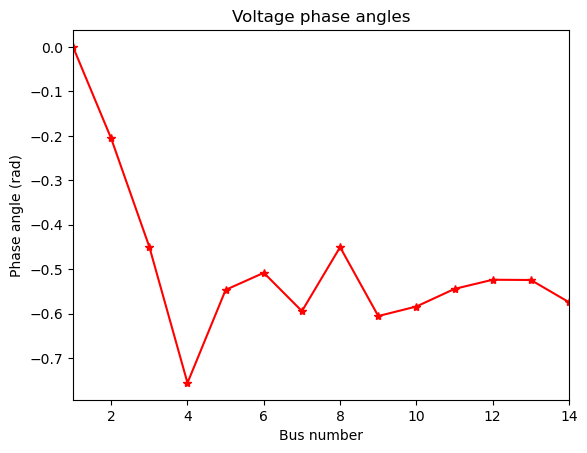

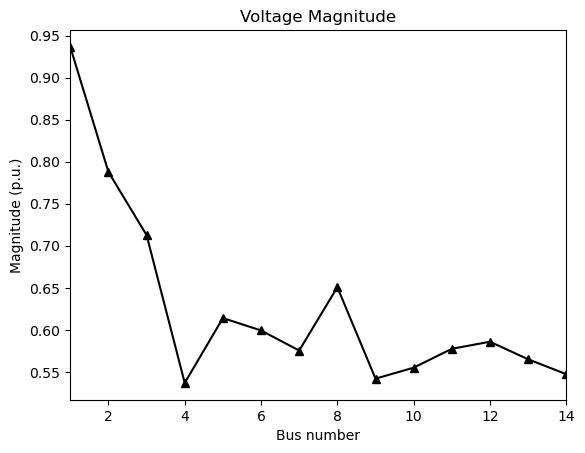

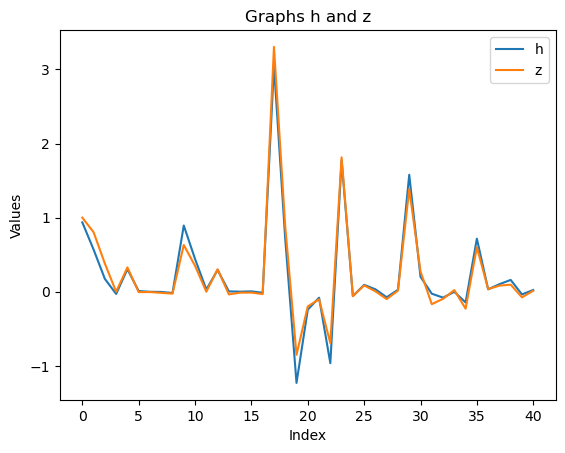

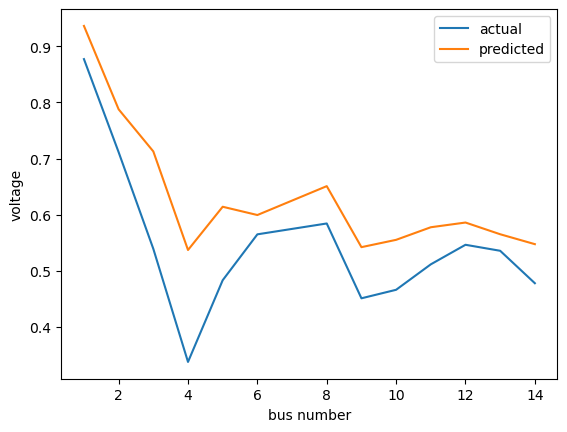

 repetition ------------->>>>>>>>>>>>>>>>> 1080
state 

 [0.935452   0.78577858 0.7114932  0.53287908 0.61009008 0.59262993
 0.57217488 0.64939155 0.53548818 0.55141082 0.57391696 0.57991567
 0.55585278 0.54175808]


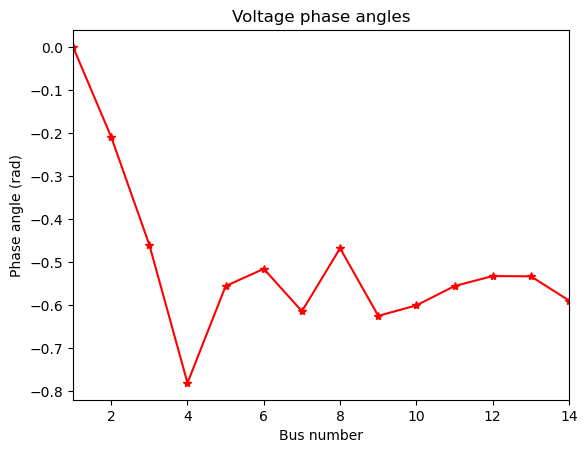

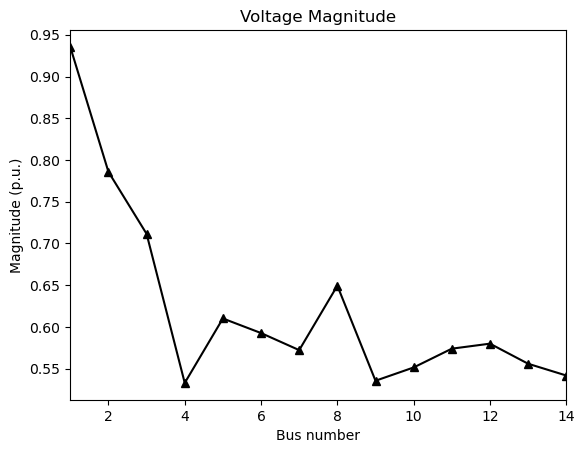

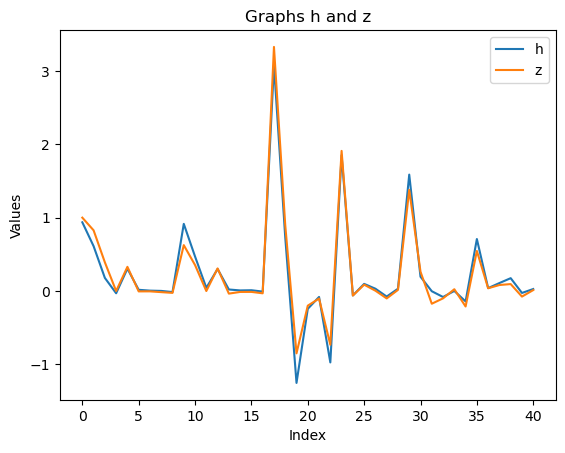

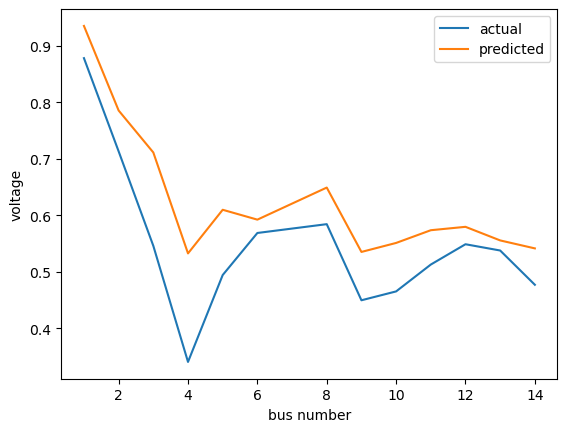

 repetition ------------->>>>>>>>>>>>>>>>> 1081
state 

 [0.93513999 0.78425923 0.70972102 0.52917474 0.60659128 0.58712909
 0.56887852 0.64769592 0.52976084 0.54787794 0.57054826 0.57483115
 0.54833327 0.53680254]


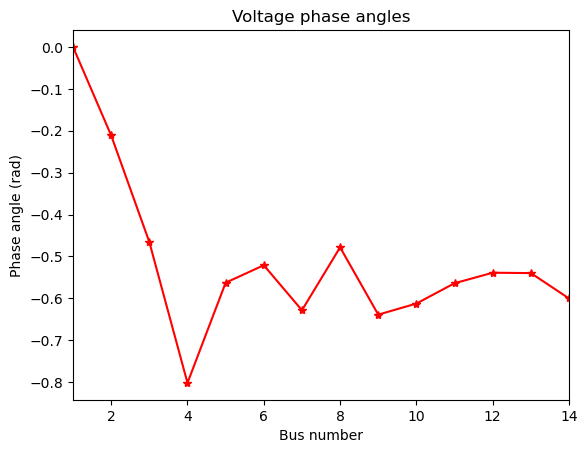

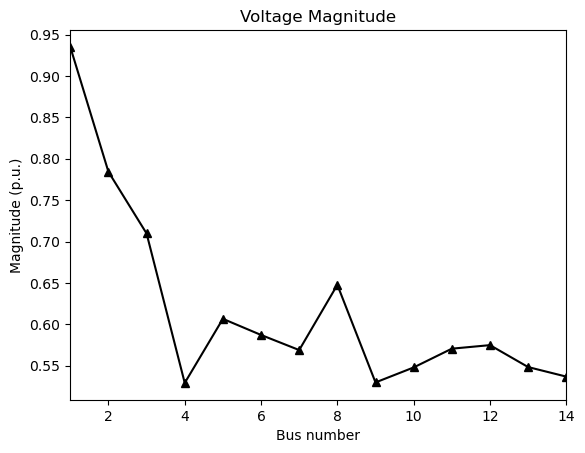

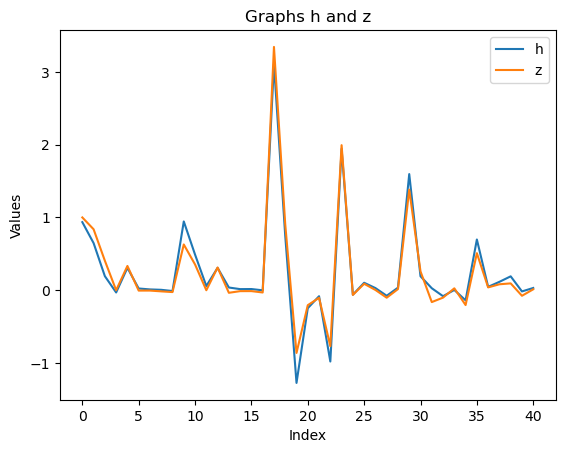

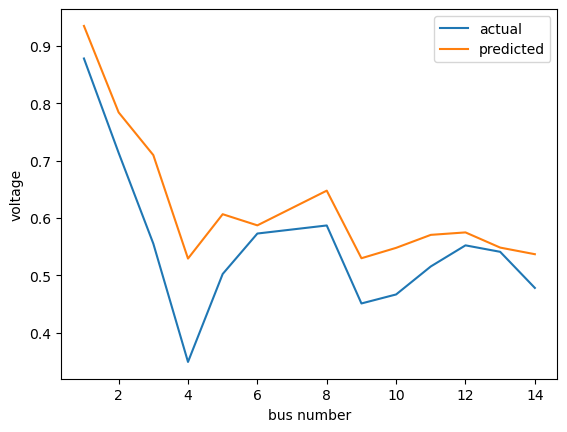

 repetition ------------->>>>>>>>>>>>>>>>> 1082
state 

 [0.93624252 0.78362818 0.70796165 0.52589714 0.6037178  0.58304711
 0.56560415 0.64567739 0.52506801 0.54450736 0.56744651 0.57087062
 0.54290134 0.53264874]


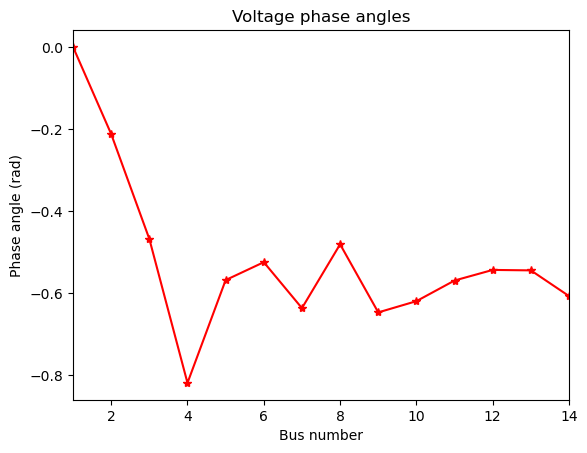

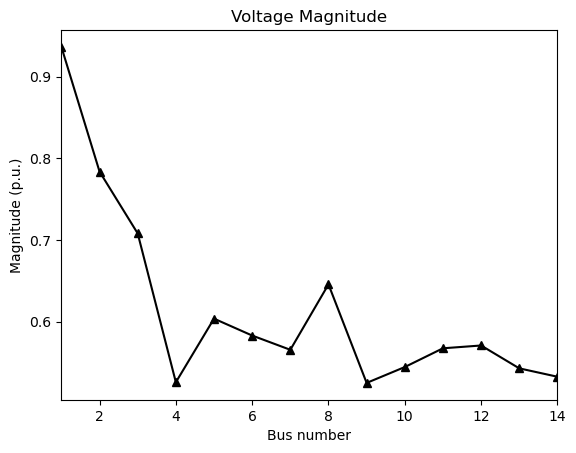

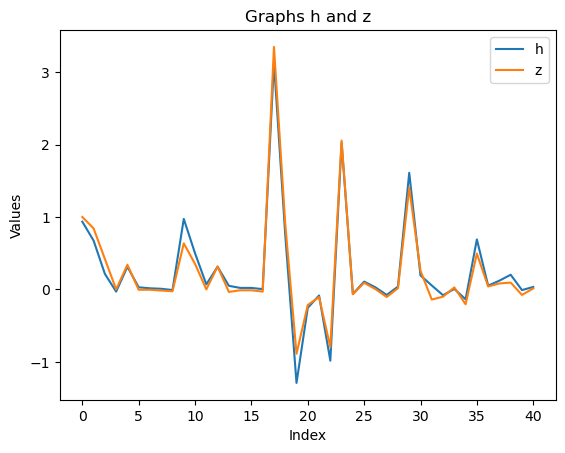

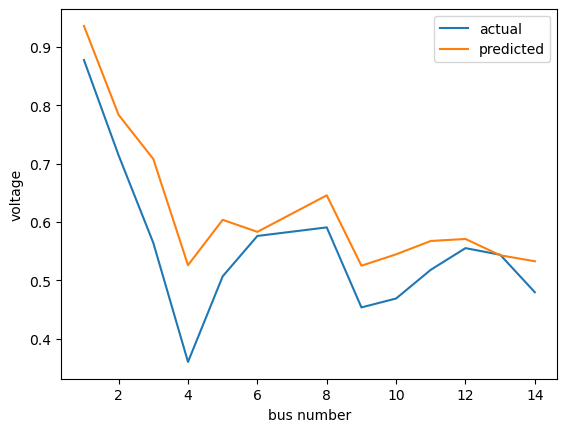

 repetition ------------->>>>>>>>>>>>>>>>> 1083
state 

 [0.93882977 0.78438575 0.70752847 0.52466604 0.60264971 0.58156505
 0.56388736 0.64467878 0.52298662 0.54277524 0.56592609 0.56927361
 0.54085311 0.53074278]


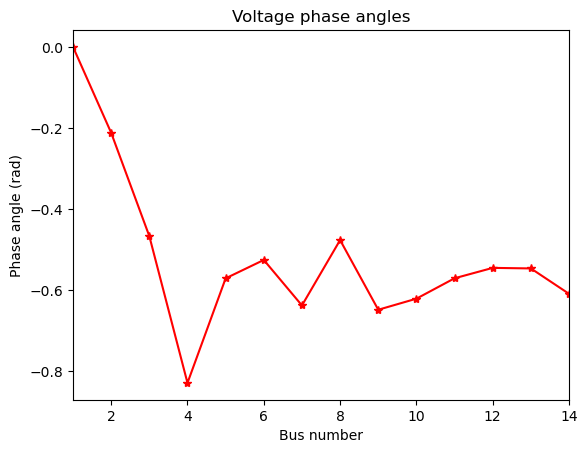

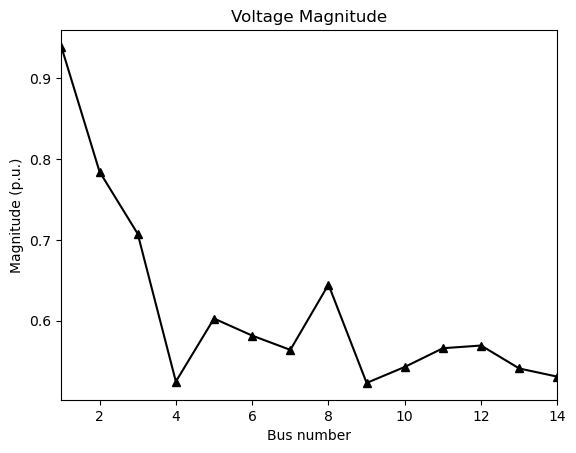

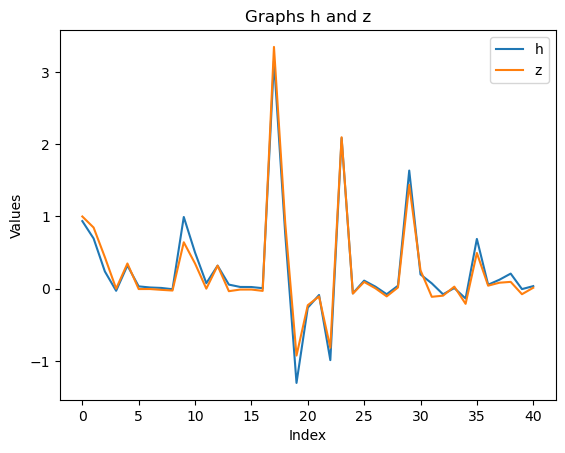

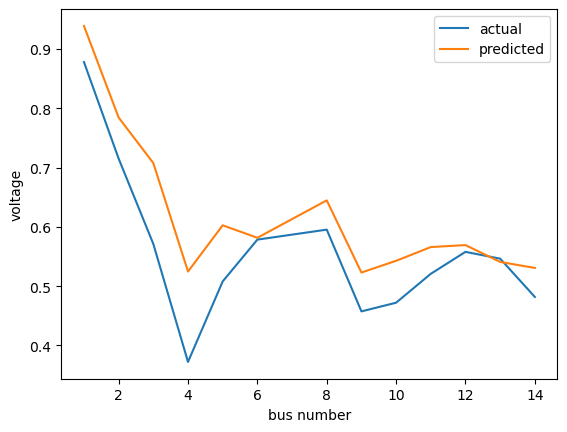

 repetition ------------->>>>>>>>>>>>>>>>> 1084
state 

 [0.94294142 0.78756191 0.7102587  0.52776398 0.60552729 0.58481756
 0.56611562 0.64686457 0.52604509 0.54505279 0.56819327 0.57221275
 0.5445165  0.53349381]


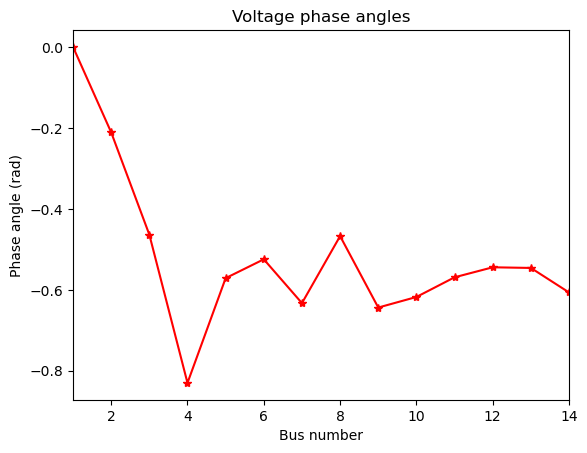

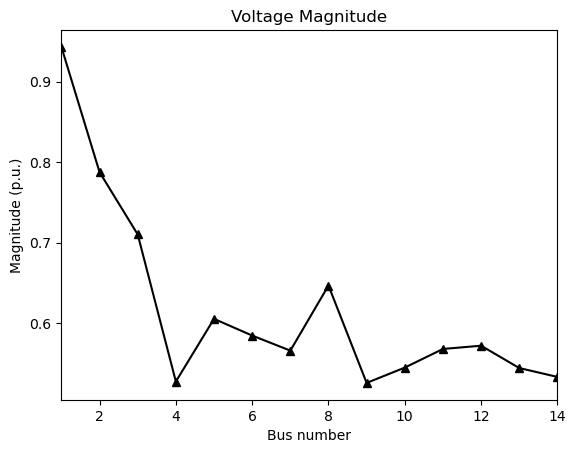

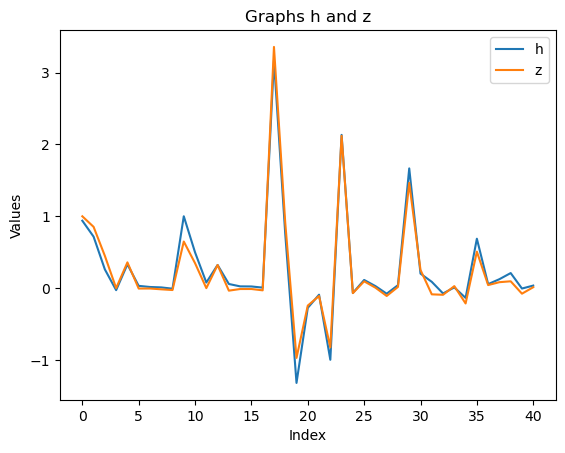

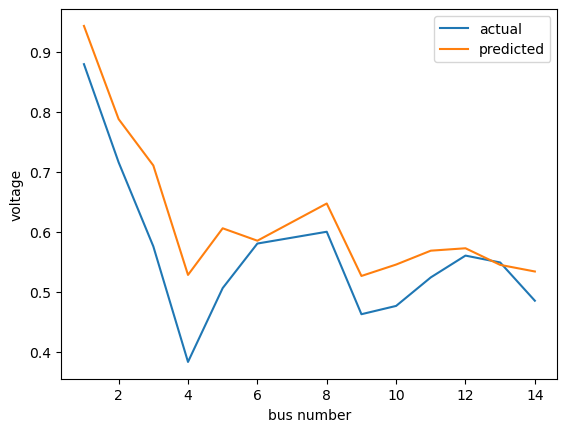

 repetition ------------->>>>>>>>>>>>>>>>> 1085
state 

 [0.94840466 0.79347937 0.71655988 0.53527158 0.61279196 0.59298327
 0.57277139 0.65282497 0.53454607 0.55179367 0.57465921 0.57993896
 0.55398136 0.54124939]


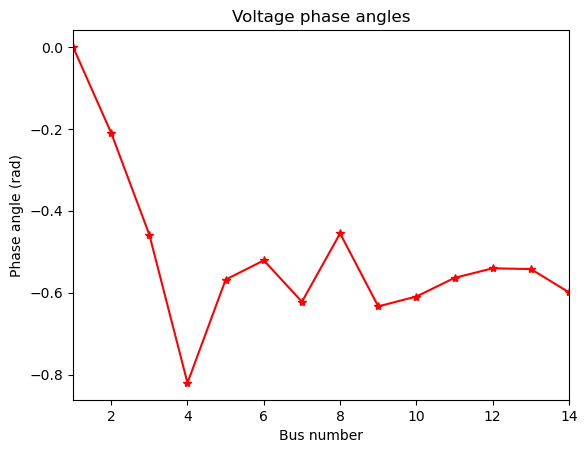

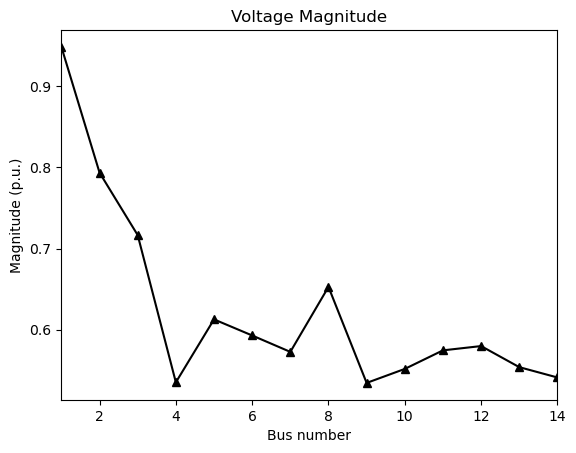

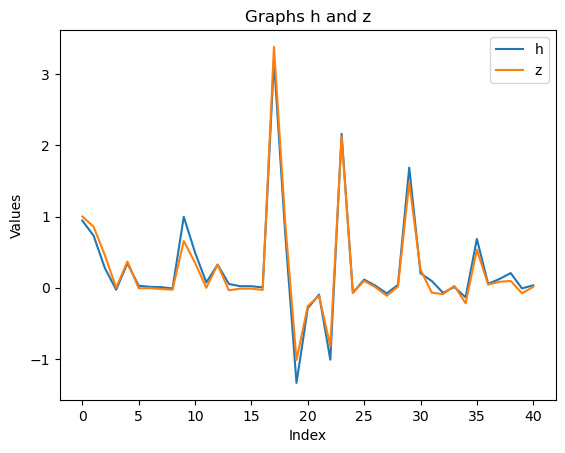

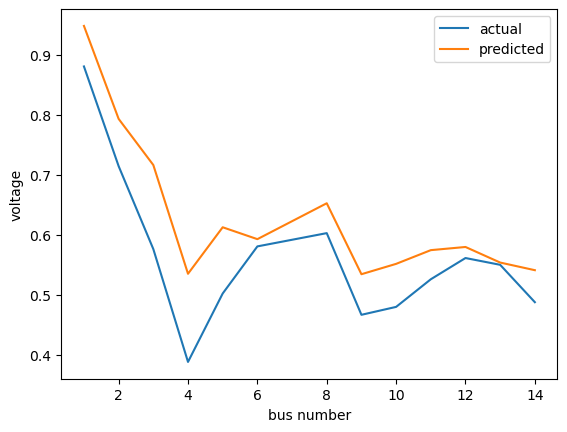

 repetition ------------->>>>>>>>>>>>>>>>> 1086
state 

 [0.95482287 0.80128372 0.72510843 0.5451299  0.62255334 0.60363092
 0.58223949 0.66141505 0.5462184  0.56122871 0.58349828 0.59013992
 0.56630034 0.55182307]


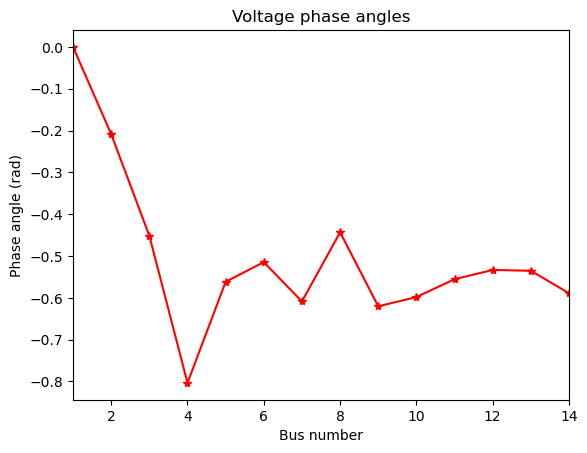

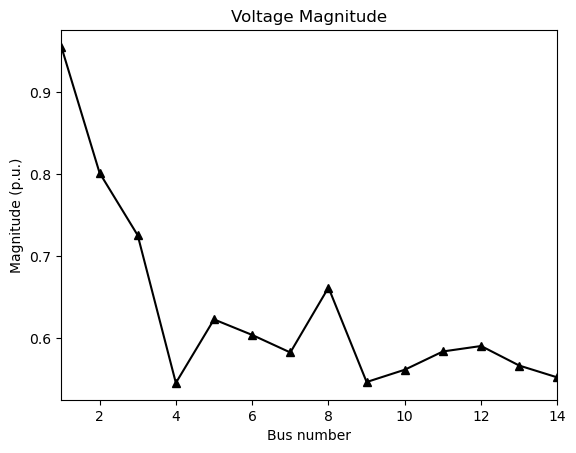

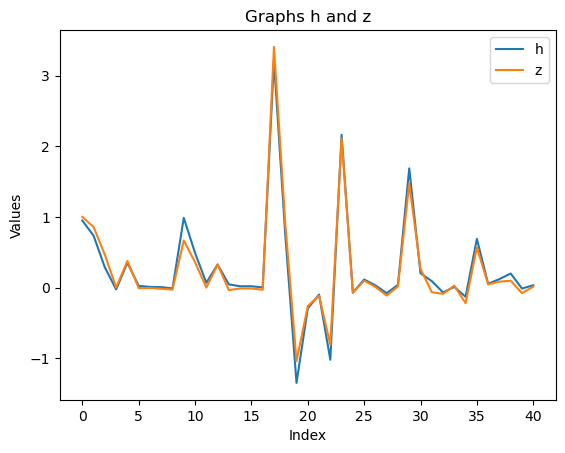

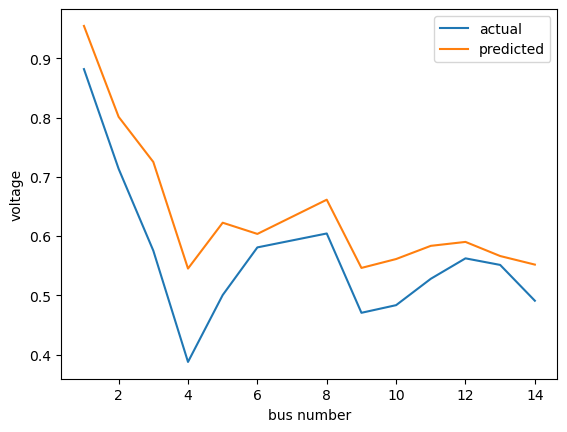

 repetition ------------->>>>>>>>>>>>>>>>> 1087
state 

 [0.96111874 0.80862091 0.73282146 0.55307048 0.63070102 0.61213306
 0.59062386 0.6694584  0.5562023  0.56936099 0.59084768 0.5983627
 0.57609662 0.56067724]


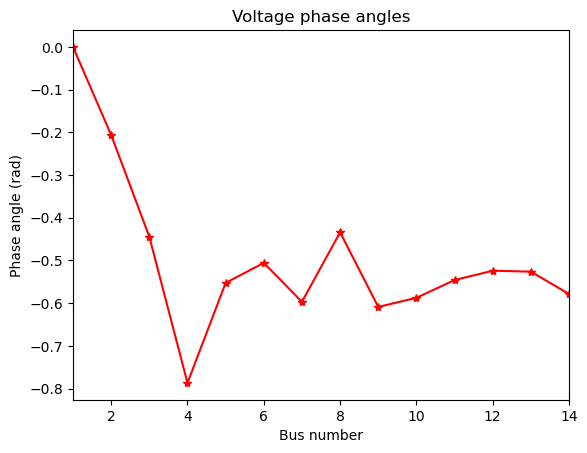

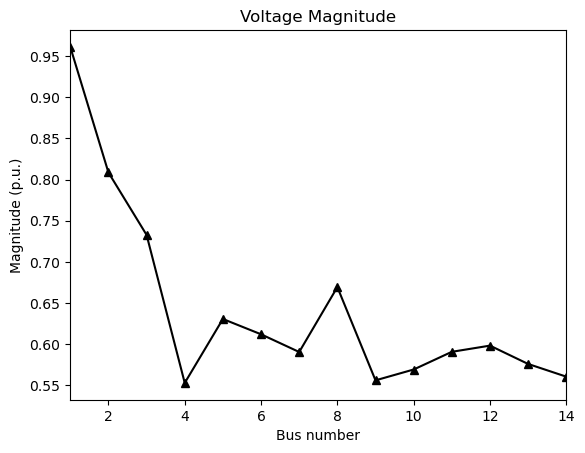

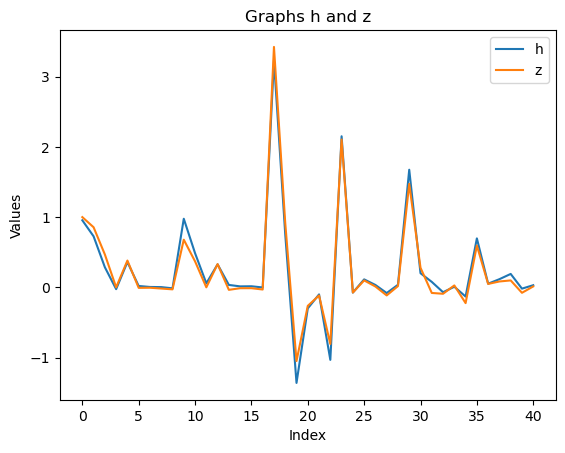

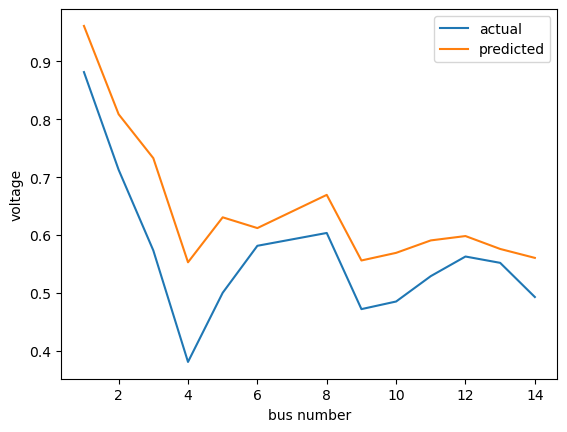

 repetition ------------->>>>>>>>>>>>>>>>> 1088
state 

 [0.96553992 0.81220322 0.73557396 0.55332167 0.63210348 0.61282301
 0.59238441 0.67216723 0.55816342 0.57064083 0.59147064 0.5989181
 0.57686046 0.5618122 ]


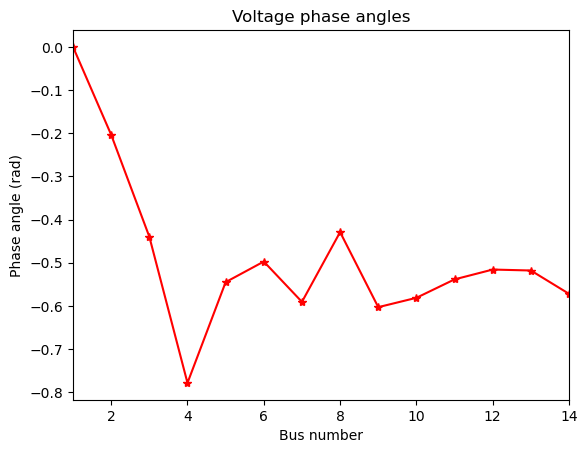

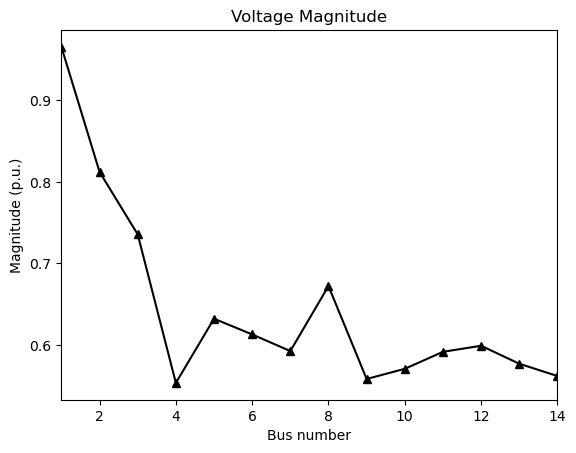

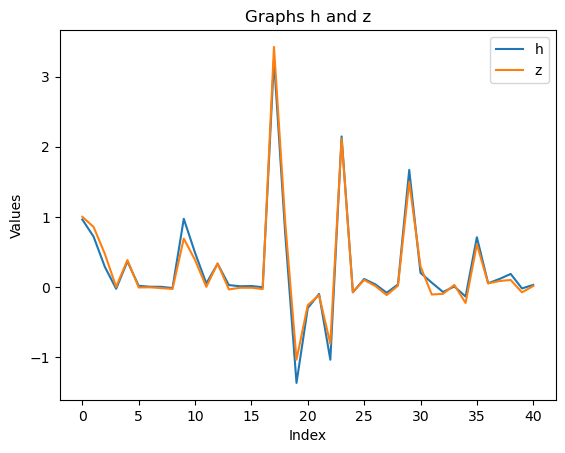

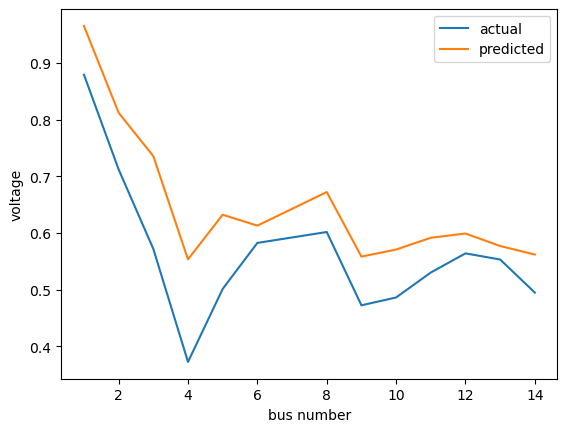

 repetition ------------->>>>>>>>>>>>>>>>> 1089
state 

 [0.96726212 0.81048639 0.73137192 0.54301679 0.62451653 0.60357778
 0.5846544  0.6669494  0.54918032 0.56236163 0.58301239 0.58967999
 0.56641192 0.55263888]


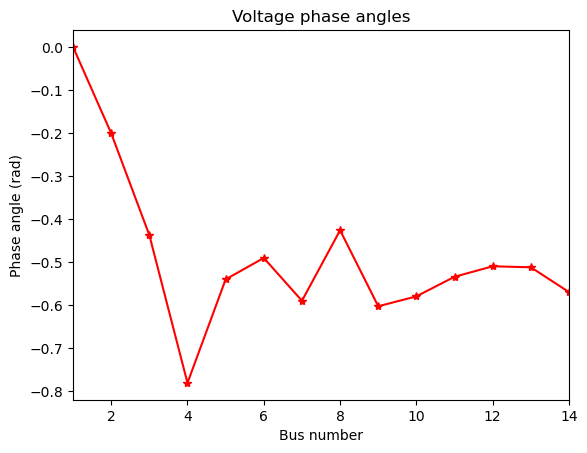

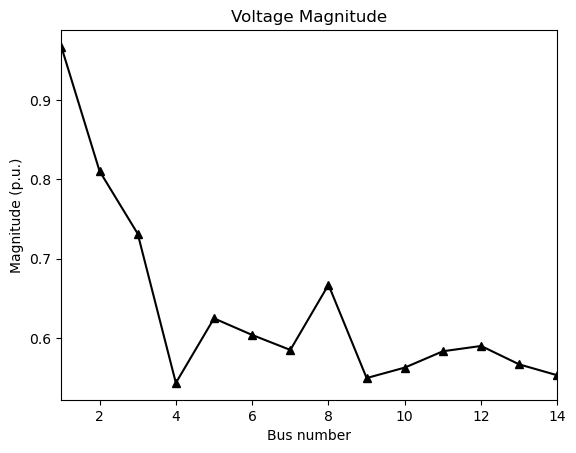

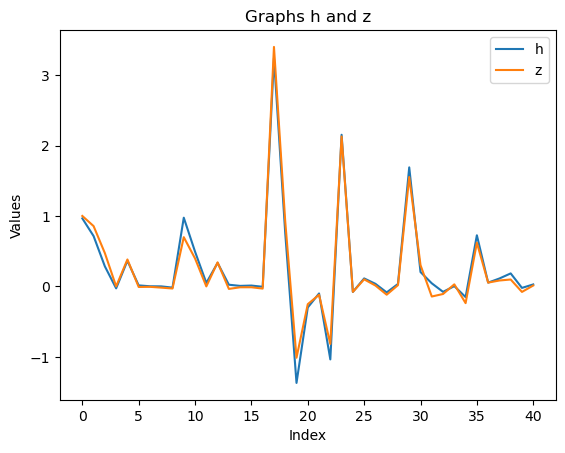

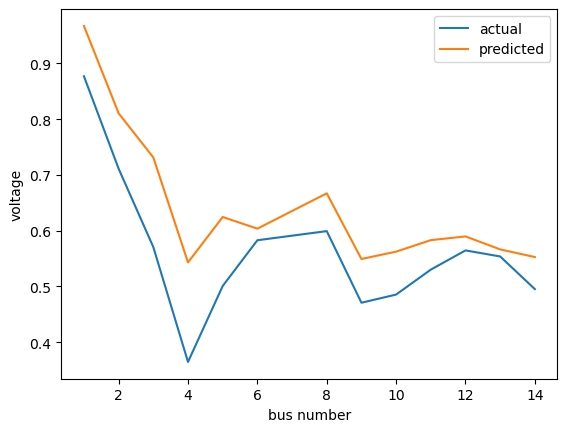

 repetition ------------->>>>>>>>>>>>>>>>> 1090
state 

 [0.9675179  0.80550358 0.72259053 0.52541006 0.61117421 0.58795617
 0.57028568 0.65617931 0.5327099  0.54756961 0.56855464 0.57411678
 0.54876121 0.53657907]


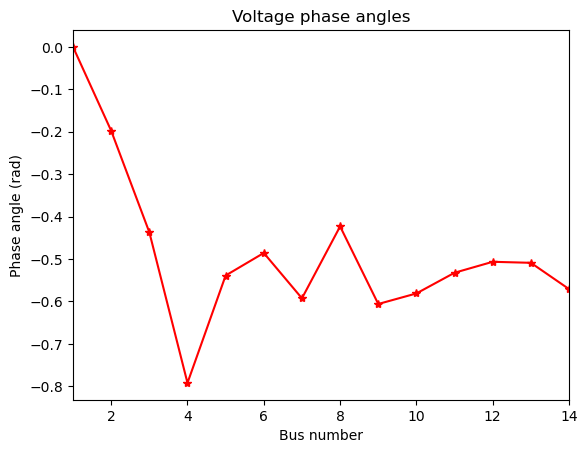

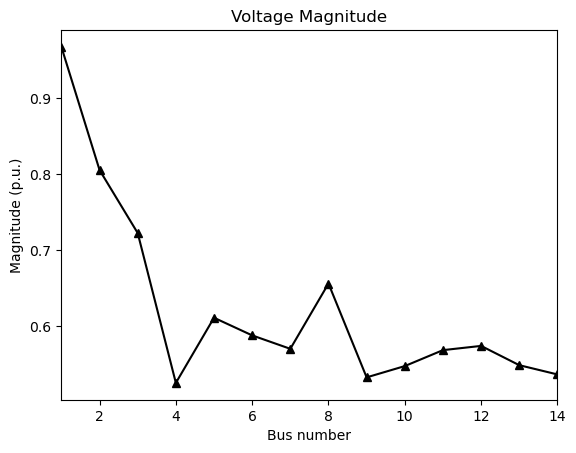

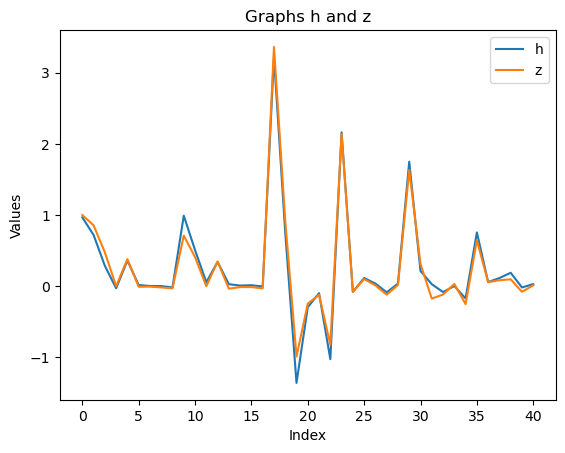

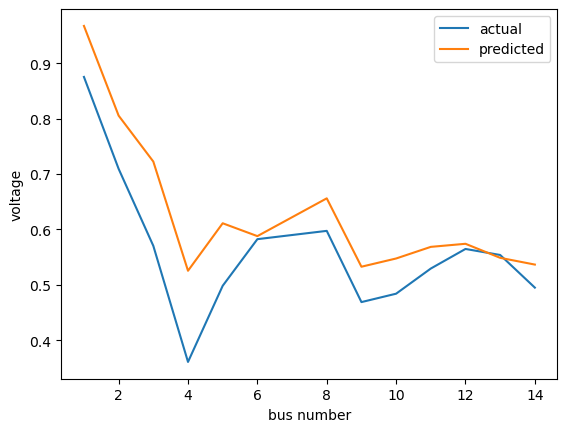

 repetition ------------->>>>>>>>>>>>>>>>> 1091
state 

 [0.9679958  0.8007629  0.7136422  0.50708929 0.59806235 0.57242204
 0.5551283  0.64476303 0.5154329  0.53233017 0.55406328 0.55865244
 0.53112219 0.52021195]


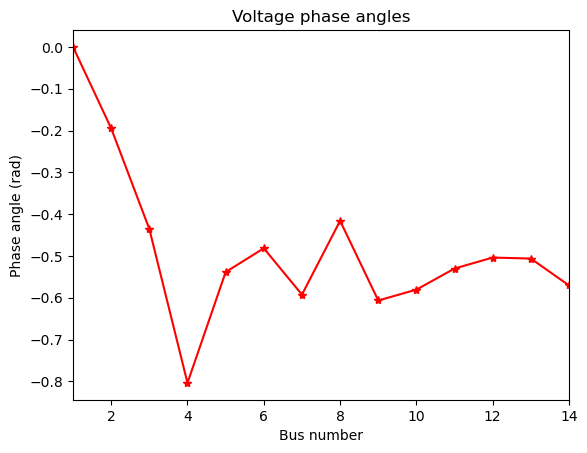

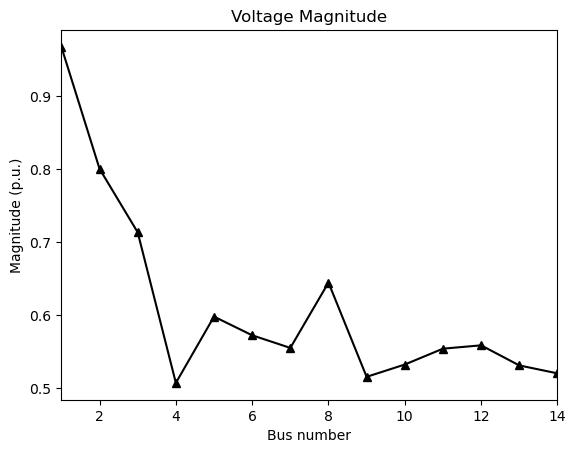

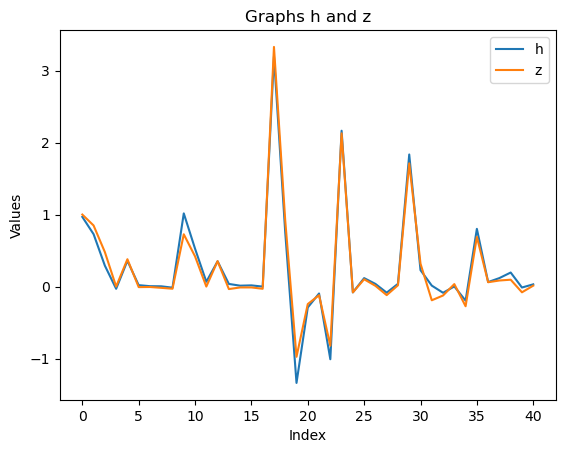

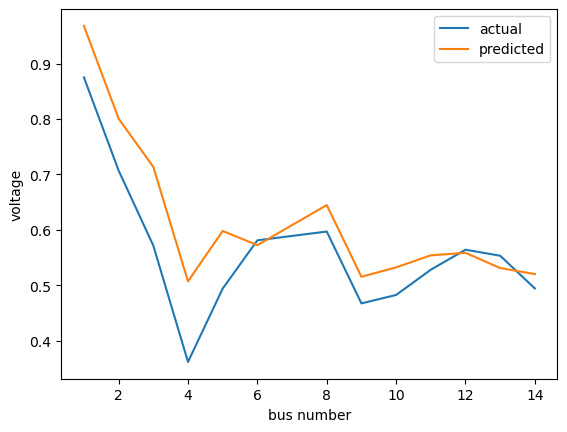

 repetition ------------->>>>>>>>>>>>>>>>> 1092
state 

 [0.96909512 0.79822833 0.70737766 0.4931001  0.5893486  0.56149709
 0.54348998 0.63616233 0.50230264 0.52103767 0.54375044 0.54779083
 0.51864477 0.50829582]


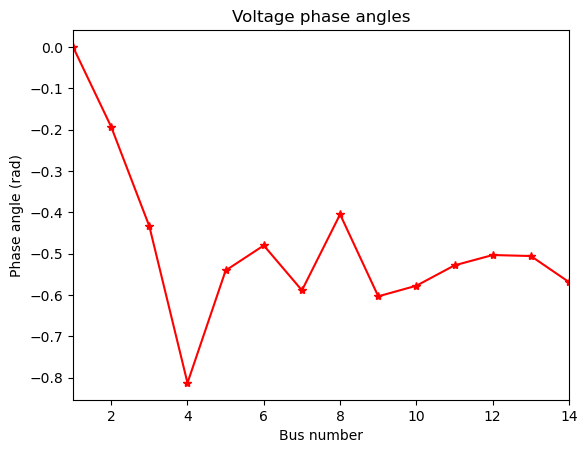

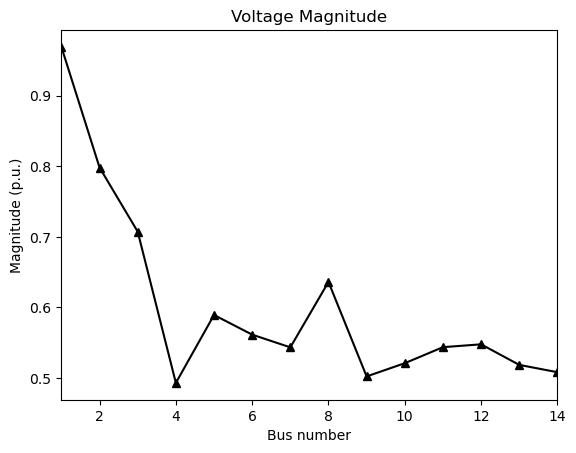

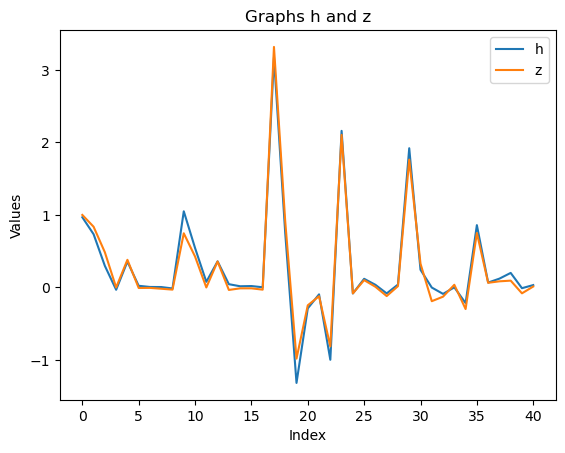

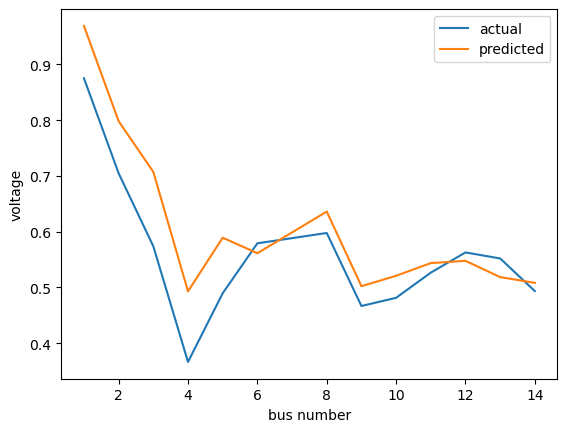

 repetition ------------->>>>>>>>>>>>>>>>> 1093
state 

 [0.97058021 0.79818421 0.70472847 0.48579212 0.58624687 0.5566396
 0.5372853  0.63178521 0.49564848 0.51538301 0.53889497 0.54293722
 0.51318726 0.50264776]


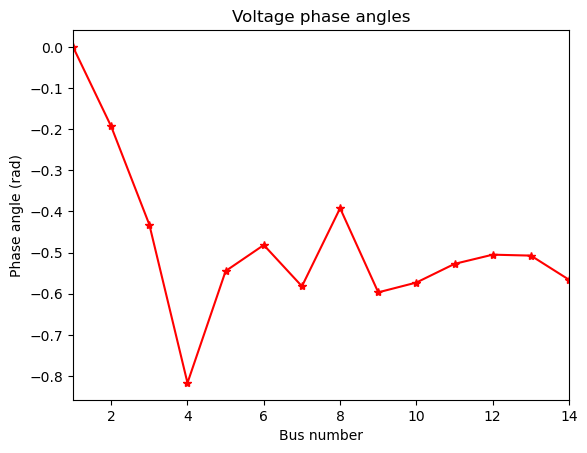

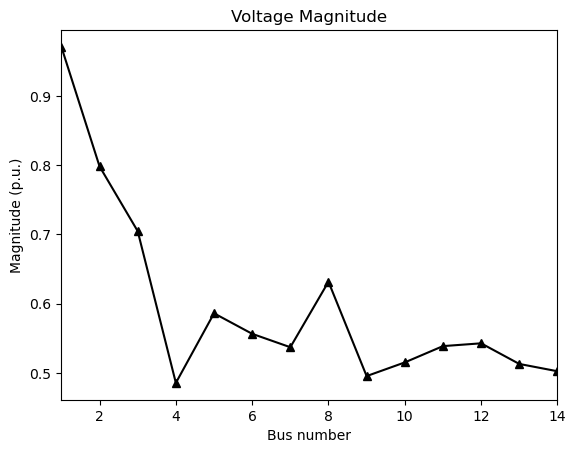

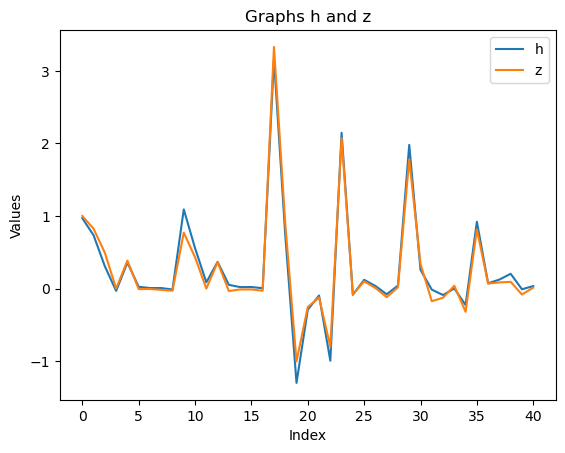

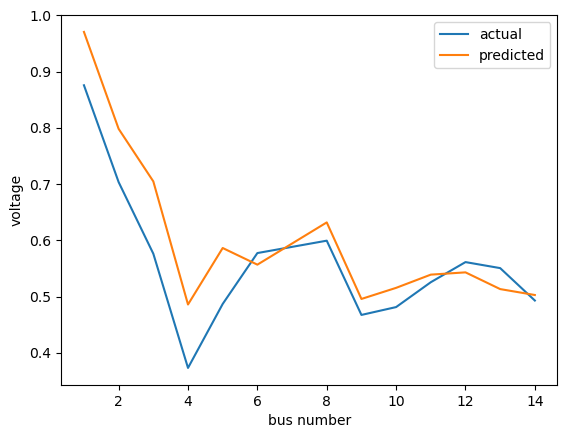

 repetition ------------->>>>>>>>>>>>>>>>> 1094
state 

 [0.97257622 0.80038182 0.70599924 0.486095   0.5883584  0.55771139
 0.53746232 0.63242754 0.49675649 0.51579875 0.53922454 0.54382778
 0.51487792 0.50365426]


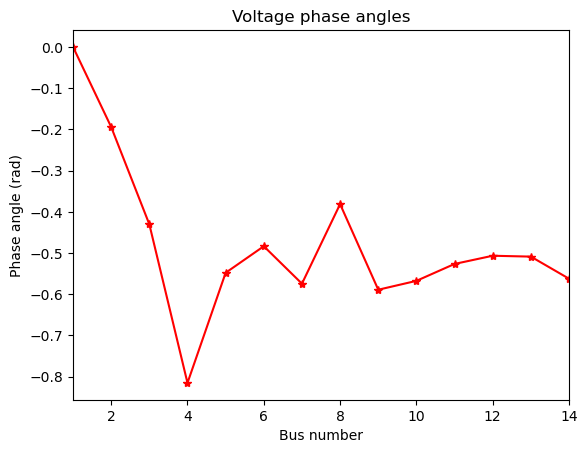

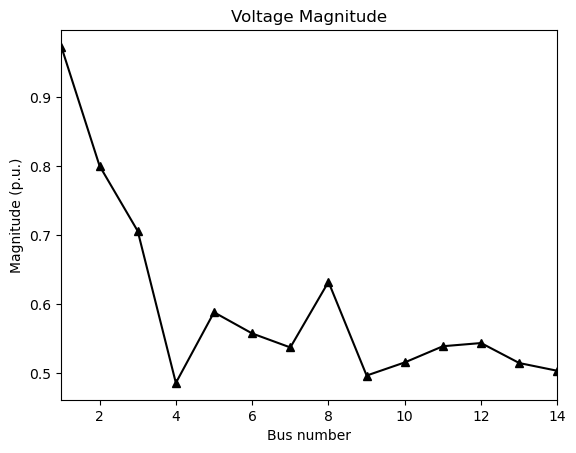

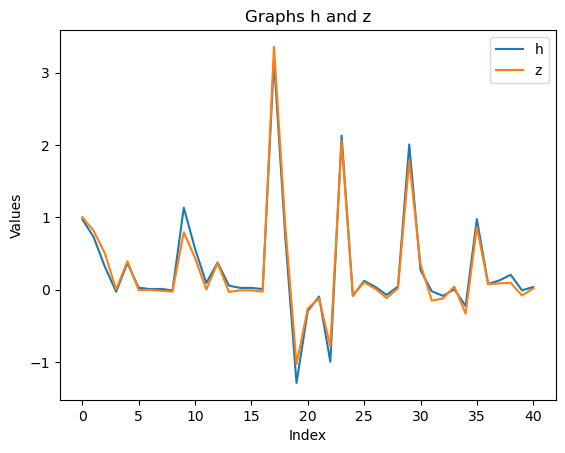

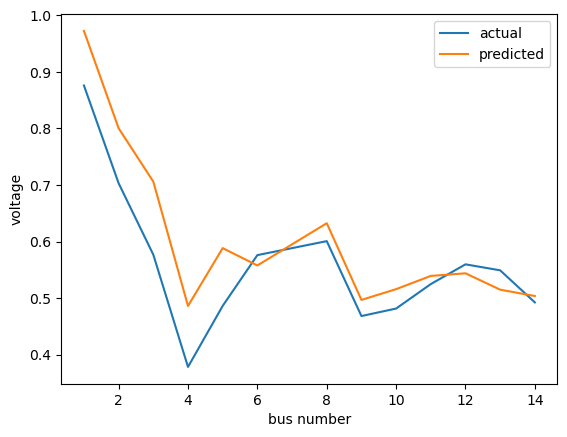

 repetition ------------->>>>>>>>>>>>>>>>> 1095
state 

 [0.97513841 0.80394055 0.71045986 0.49262136 0.59370098 0.56275957
 0.54314788 0.63755392 0.50451719 0.52100098 0.54303255 0.54846835
 0.52153516 0.50972974]


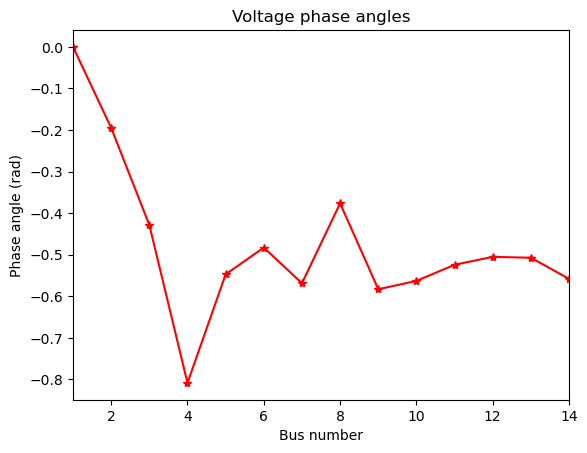

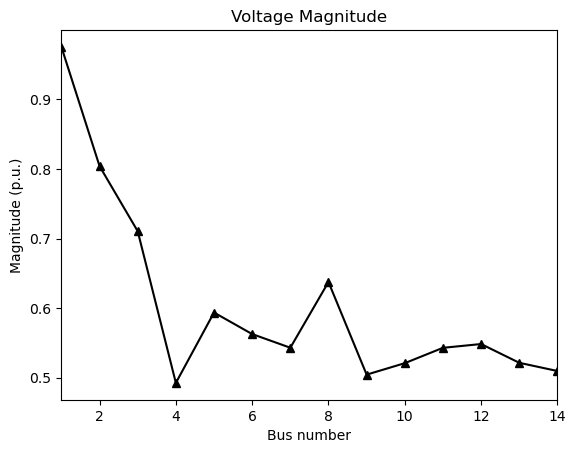

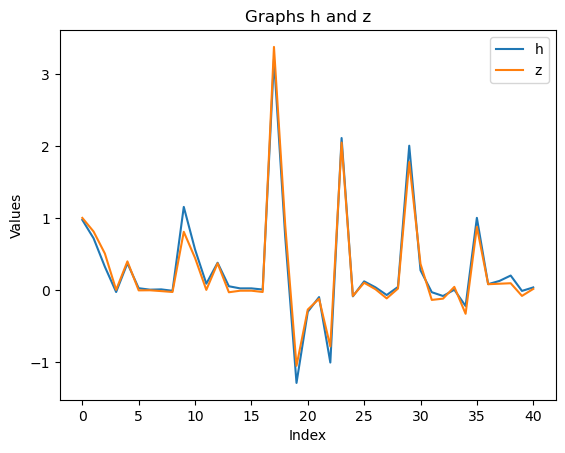

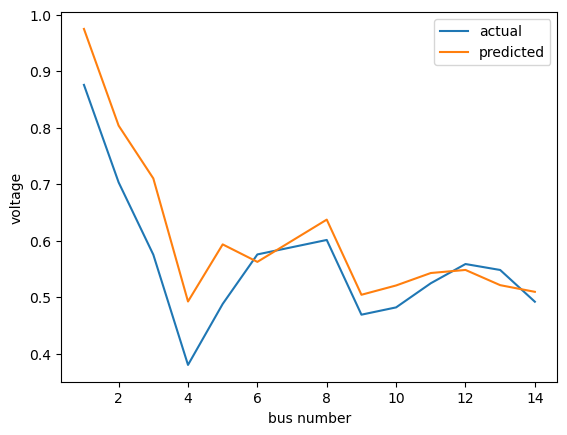

 repetition ------------->>>>>>>>>>>>>>>>> 1096
state 

 [0.97784089 0.80733718 0.71598038 0.5012707  0.59899024 0.56813051
 0.55107031 0.64475042 0.51471276 0.52772213 0.54732627 0.55332544
 0.52870417 0.51710262]


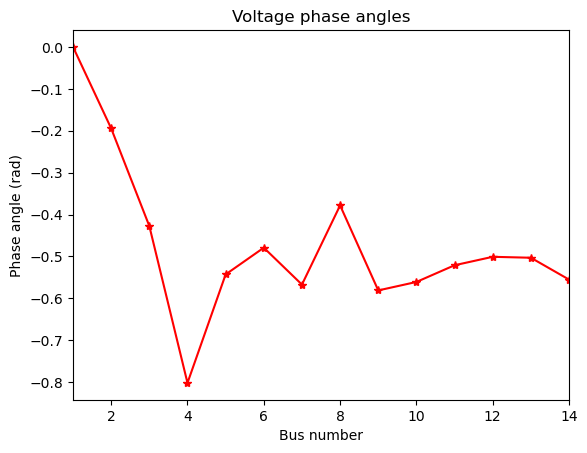

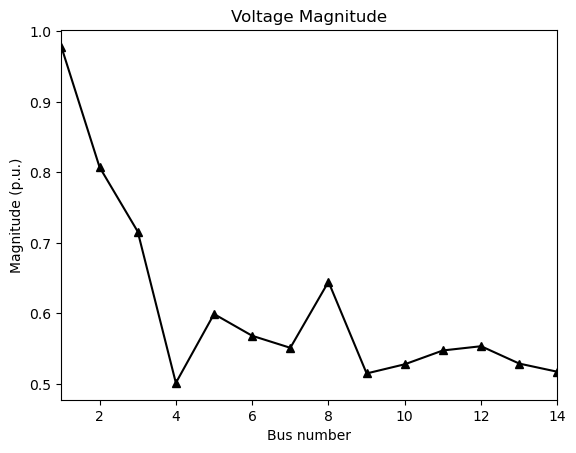

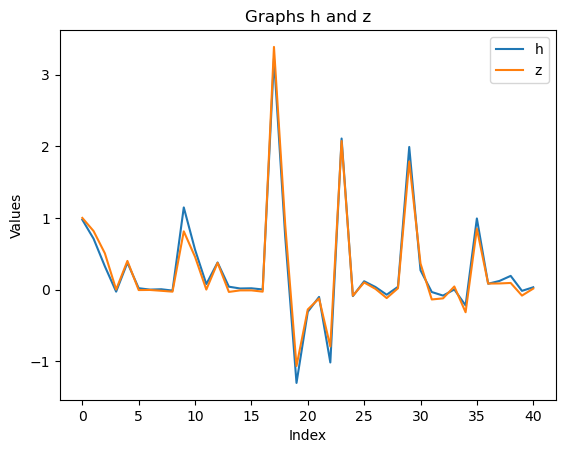

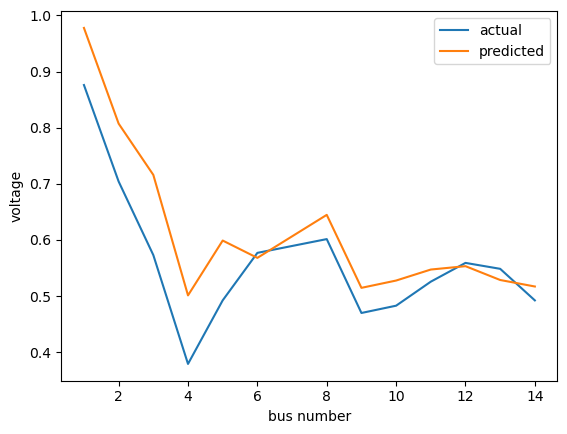

 repetition ------------->>>>>>>>>>>>>>>>> 1097
state 

 [0.9802646  0.80946786 0.72043568 0.50797618 0.60173756 0.57092962
 0.557745   0.65124769 0.52309565 0.53280285 0.54960208 0.55563361
 0.53282602 0.52233465]


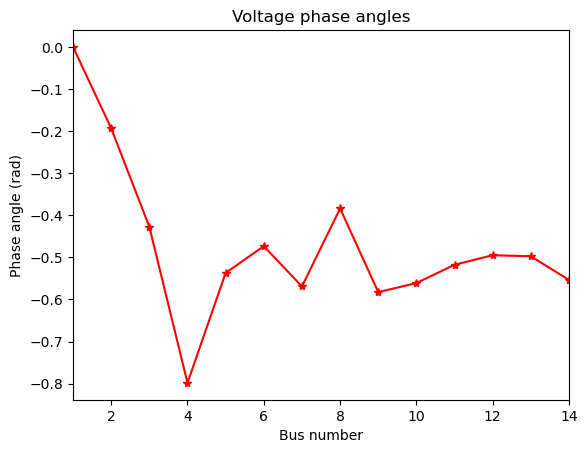

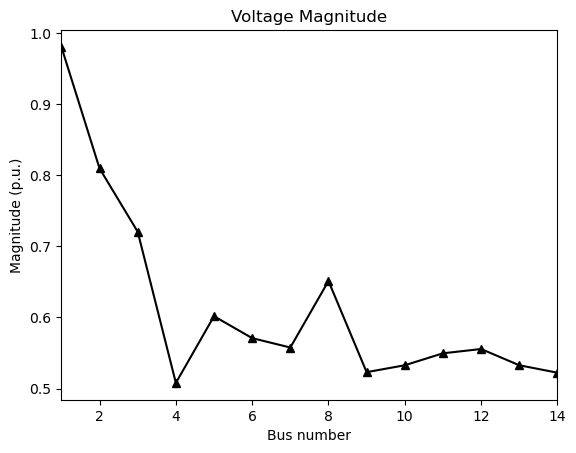

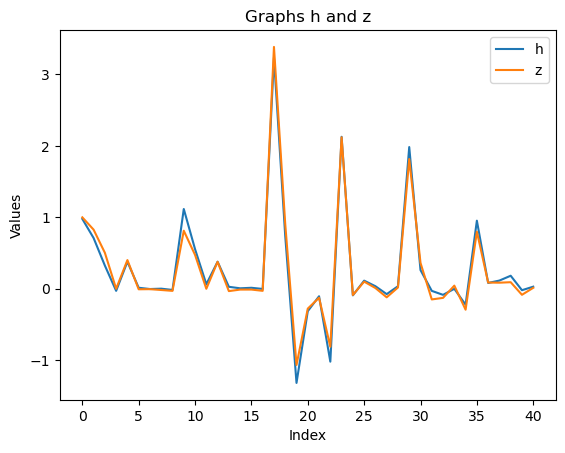

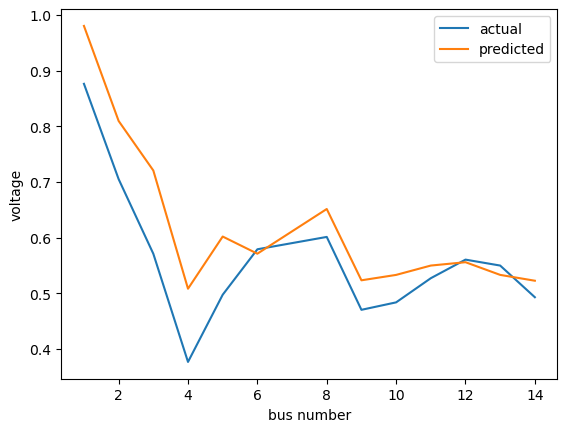

 repetition ------------->>>>>>>>>>>>>>>>> 1098
state 

 [0.98256233 0.81055795 0.72324417 0.51130289 0.60193333 0.57095245
 0.56179129 0.65582451 0.52813224 0.53529191 0.54955238 0.55525106
 0.53354222 0.52458572]


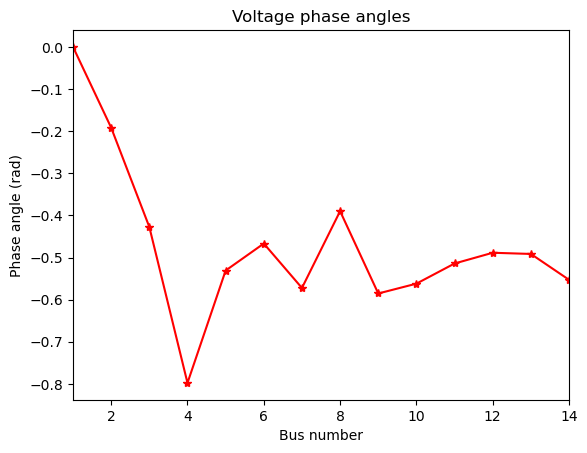

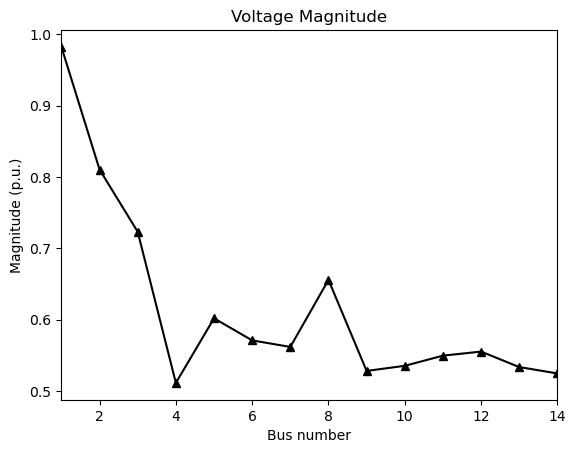

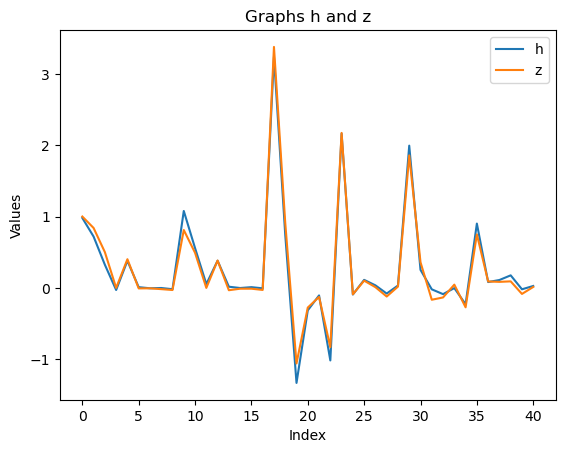

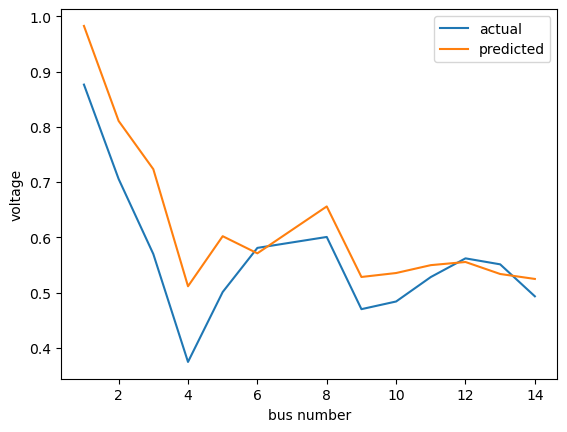

 repetition ------------->>>>>>>>>>>>>>>>> 1099
state 

 [0.98488865 0.81133087 0.72481288 0.51161714 0.60088225 0.56934685
 0.56323942 0.65831695 0.52983157 0.535644   0.54820505 0.55340387
 0.53199732 0.52450507]


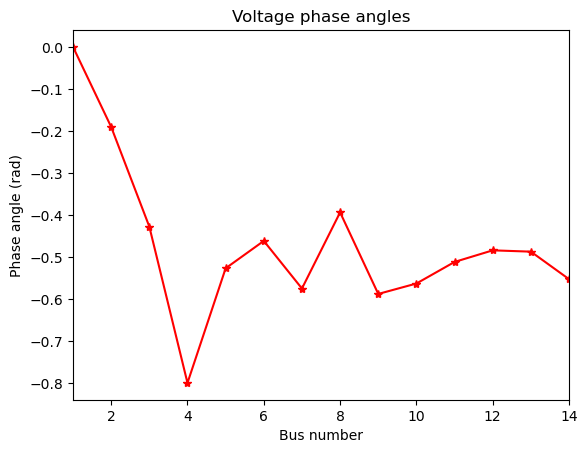

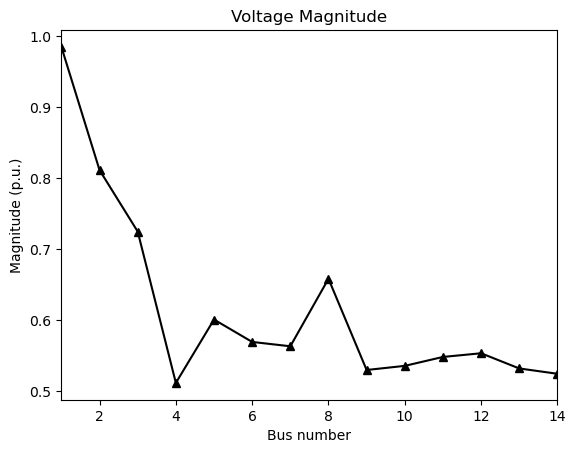

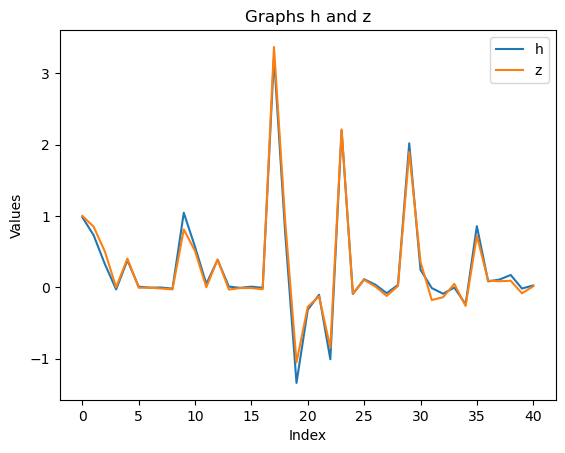

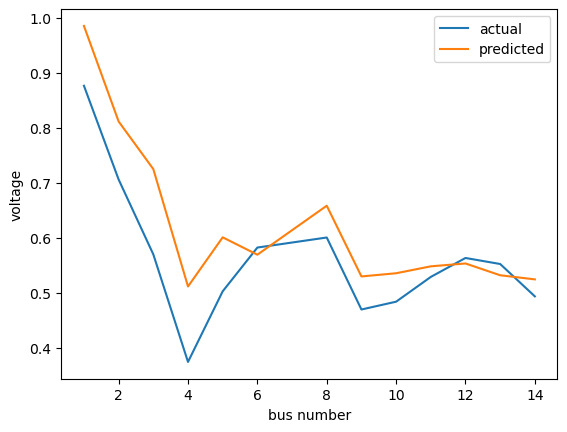

In [27]:
Pi= pd.read_csv("data/PQ_fault_modified2.csv")
nbus=14;
Pi= Pi.to_numpy();
num=14

dim_x = 27 # state dimension
dim_z = 41 # measurement dimension
def fx(x, dt):
    F = np.identity(27)
    return np.dot(F, x)



points = MerweScaledSigmaPoints(n=dim_x, alpha=0.1, beta=2.0, kappa=-1.0)

#need to improve on the values of alpha beta kappa for better results of z-h rest is good
#now z-h is good but alpha beta kappa can be improved



kf = UnscentedKalmanFilter(dim_x=dim_x, dim_z=dim_z, dt=0.1, fx=fx, hx=Hx, points=points)
initial_state = np.zeros(27)  # Initial state vector
for i in range(13,27):
    initial_state[i]=1
kf.x=initial_state

kf.P = np.eye(dim_x) * 0.001 # initial state covariance matrix
kf.Q = np.eye(dim_x) * 1e-5# process noise covariance matrix
kf.R = np.eye(dim_z) * 1e-8 # measurement noise covariance matrix




df=pd.read_csv("data/Vrms_fault2.csv")






for i in range (1000,1100):
    h1=Hx(kf.x)
    zdata = zdatas(i)
    z1 = zdata[:,2]
    z= np.zeros(41)
    for i1 in range (41):
        z[i1]=z1[i1]
    kf.predict() # predict step
    kf.update(z) # update step
    

     # ++++++++++++++++++++++
    # Presenting the results
    # ===================
    del2 = np.zeros(14);
    del2[1:]=kf.x[0:13]
    print(" repetition ------------->>>>>>>>>>>>>>>>>",i)
    print("state \n\n",kf.x[13:])


    plot.figure()
    plot.plot(range(1,nbus+1),del2,'-r*')
    plot.title('Voltage phase angles')
    plot.xlabel('Bus number')
    plot.ylabel('Phase angle (rad)')
    plot.xlim(1,nbus)

    plot.figure()
    plot.plot(range(1,nbus+1),kf.x[13:],'-k^')
    plot.title('Voltage Magnitude')
    plot.xlabel('Bus number')
    plot.ylabel('Magnitude (p.u.)')
    plot.xlim(1,nbus)
    plot.show()

    fig, ax = plot.subplots()
    ax.plot(h1, label='h')
    ax.plot(z, label='z')
    ax.set_title('Graphs h and z')             # Set the plot title and labels
    ax.set_xlabel('Index')
    ax.set_ylabel('Values')
    ax.legend()                                # Add a legend
    plot.show()                                # Display the plot


    volt_pred=[]
    volt_actual=[]
    bus_number=[]
    for i1 in range(14):
        if(i1==6):
            continue
        volt_pred.append(kf.x[13+i1])
        volt_actual.append(df[f'Subsystem #1|CTLs|Vars|Vrms_{i1+1}'][i]/11.1)
        bus_number.append(i1+1)
    plot.figure()
    plot.plot(bus_number,volt_actual,label="actual")
    plot.plot(bus_number,volt_pred,label="predicted")
    plot.xlabel('bus number')
    plot.ylabel('voltage')
    plot.legend()
    plot.show()

    # ++++++++++++++++++++++
    # end of the results
    # ===================


